In [1]:
# Reptile example on keras
# Original code on pytorch at https://blog.openai.com/reptile/
# Porting to keras by shi3z Apr. 12 2018
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.layers import *
from keras.models import *
from keras import backend as K
from copy import deepcopy

seed = 0
plot = True
innerstepsize = 0.02 # stepsize in inner SGD
innerepochs = 1 # number of epochs of each inner SGD
outerstepsize0 = 0.1 # stepsize of outer optimization, i.e., meta-optimization
niterations = 30000 # number of outer updates; each iteration we sample one task and update on it

rng = np.random.RandomState(seed)



# Define task distribution
x_all = np.linspace(-5, 5, 50)[:,None] # All of the x points
ntrain = 10 # Size of training minibatches

def gen_task():
    "Generate classification problem"
    phase = rng.uniform(low=0, high=2*np.pi)
    ampl = rng.uniform(0.1, 5)
    f_randomsine = lambda x : np.sin(x + phase) * ampl
    return f_randomsine

model = Sequential()
model.add(Dense(64,input_shape=(1,),activation='tanh'))
model.add(Dense(64,activation='tanh'))
model.add(Dense(1))

model.compile(loss='mse', optimizer='sgd')


f_plot = gen_task()
# test task
xtrain_plot = x_all[rng.choice(len(x_all), size=ntrain)]
xtrain_plot.shape

Using TensorFlow backend.


(10, 1)

In [3]:
f = gen_task()
y_all = f(x_all)
y_all.shape, x_all.shape

((50, 1), (50, 1))

In [4]:
def train_on_batch(x,y):
    weights_before = model.weights


    model.train_on_batch(x,y)
    weights_after = model.weights
    for i in range(len(weights_after)):
        model.weights[i]  = (weights_after[i]-
                                (weights_after[i]-weights_before[i])*innerstepsize)

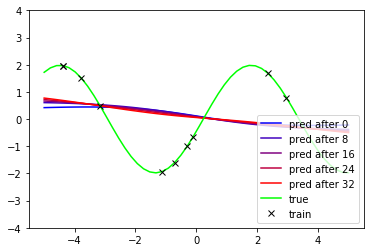

-----------------------------
iteration               1
loss on plotted curve   1.875


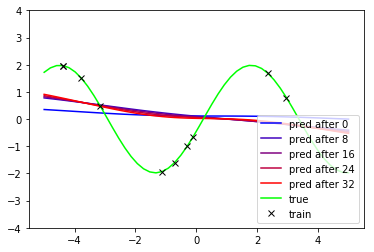

-----------------------------
iteration               10
loss on plotted curve   1.729


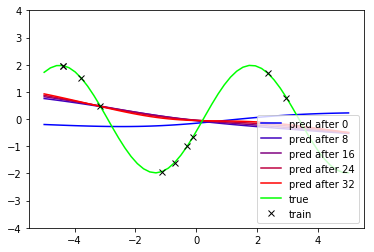

-----------------------------
iteration               20
loss on plotted curve   1.737


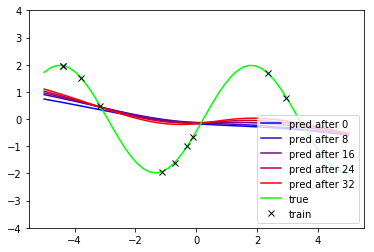

-----------------------------
iteration               30
loss on plotted curve   1.499


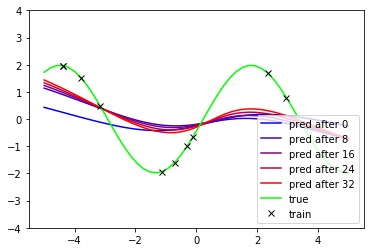

-----------------------------
iteration               40
loss on plotted curve   1.039


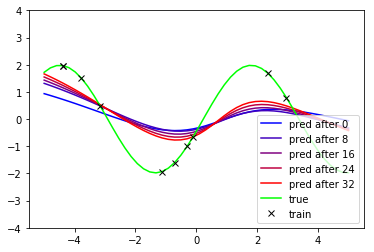

-----------------------------
iteration               50
loss on plotted curve   0.952


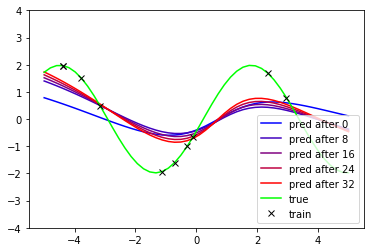

-----------------------------
iteration               60
loss on plotted curve   0.863


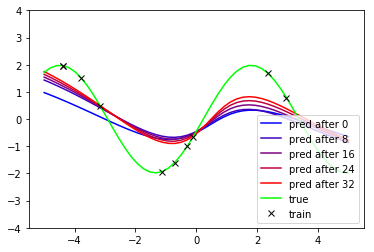

-----------------------------
iteration               70
loss on plotted curve   0.670


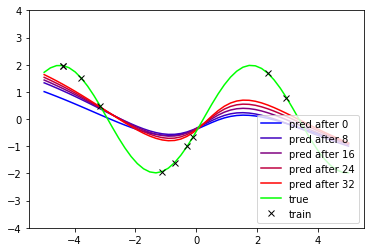

-----------------------------
iteration               80
loss on plotted curve   0.720


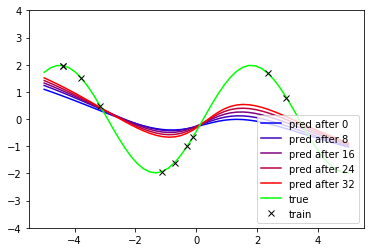

-----------------------------
iteration               90
loss on plotted curve   0.850


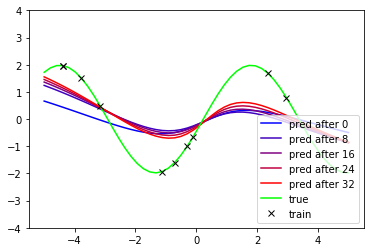

-----------------------------
iteration               100
loss on plotted curve   0.803


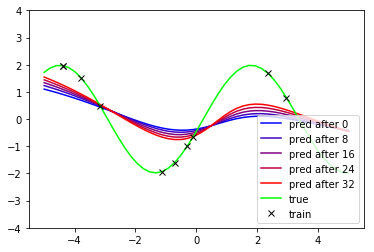

-----------------------------
iteration               110
loss on plotted curve   0.983


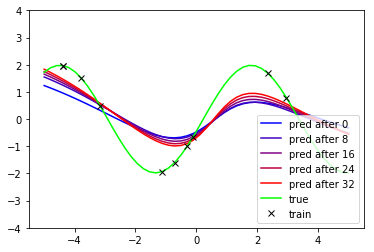

-----------------------------
iteration               120
loss on plotted curve   0.701


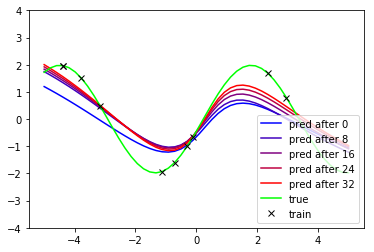

-----------------------------
iteration               130
loss on plotted curve   0.403


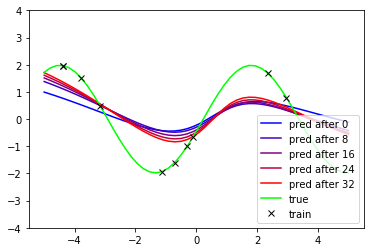

-----------------------------
iteration               140
loss on plotted curve   0.782


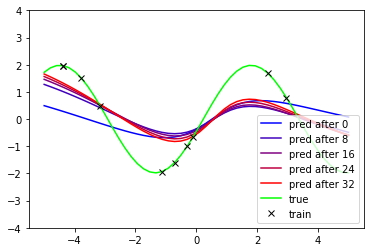

-----------------------------
iteration               150
loss on plotted curve   0.804


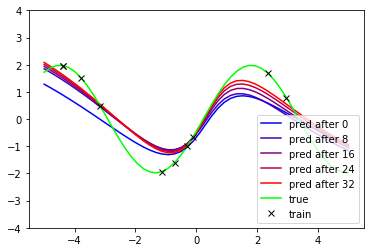

-----------------------------
iteration               160
loss on plotted curve   0.364


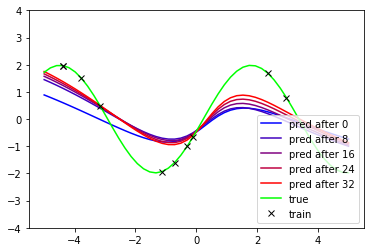

-----------------------------
iteration               170
loss on plotted curve   0.610


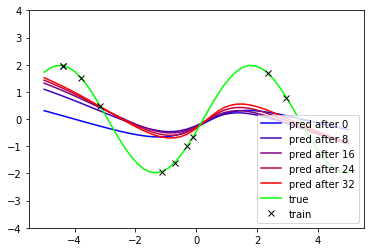

-----------------------------
iteration               180
loss on plotted curve   0.845


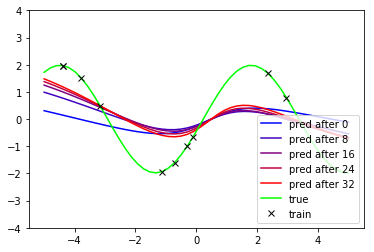

-----------------------------
iteration               190
loss on plotted curve   0.930


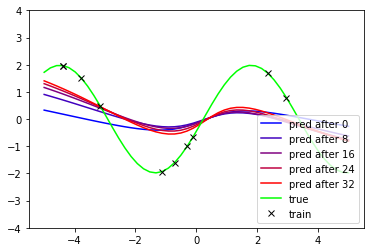

-----------------------------
iteration               200
loss on plotted curve   0.993


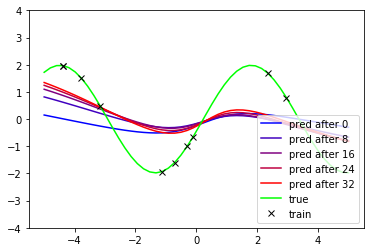

-----------------------------
iteration               210
loss on plotted curve   1.064


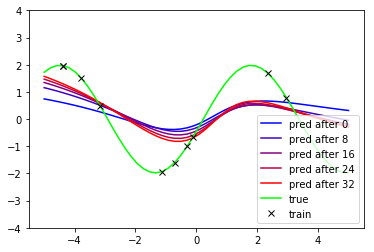

-----------------------------
iteration               220
loss on plotted curve   0.965


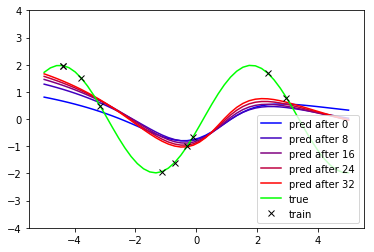

-----------------------------
iteration               230
loss on plotted curve   1.096


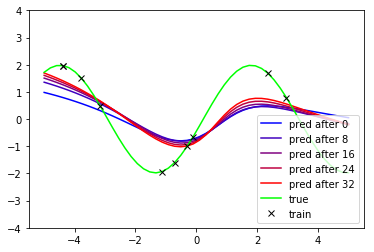

-----------------------------
iteration               240
loss on plotted curve   0.963


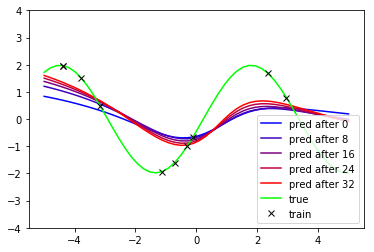

-----------------------------
iteration               250
loss on plotted curve   1.102


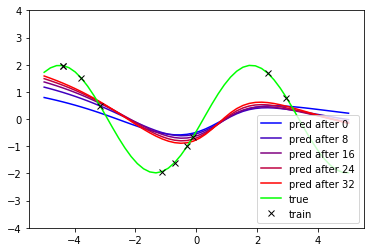

-----------------------------
iteration               260
loss on plotted curve   1.075


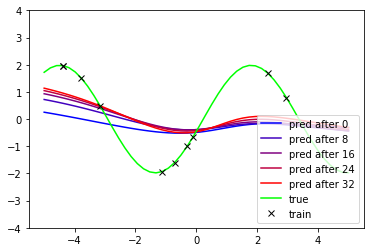

-----------------------------
iteration               270
loss on plotted curve   1.423


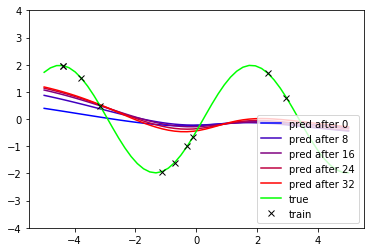

-----------------------------
iteration               280
loss on plotted curve   1.480


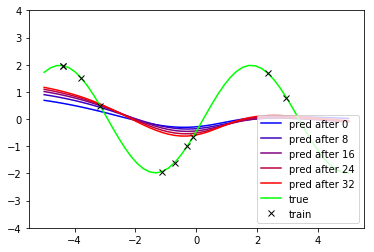

-----------------------------
iteration               290
loss on plotted curve   1.480


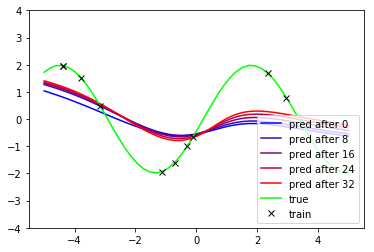

-----------------------------
iteration               300
loss on plotted curve   1.171


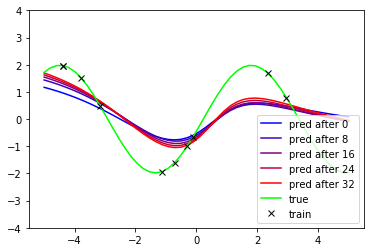

-----------------------------
iteration               310
loss on plotted curve   0.934


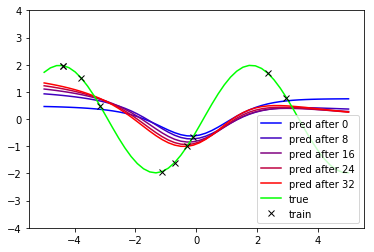

-----------------------------
iteration               320
loss on plotted curve   1.436


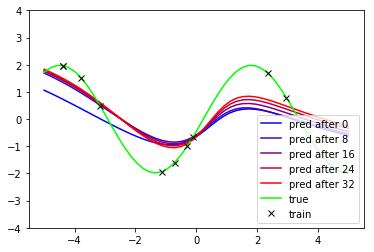

-----------------------------
iteration               330
loss on plotted curve   0.771


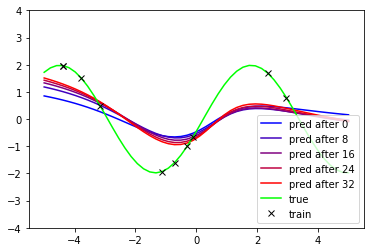

-----------------------------
iteration               340
loss on plotted curve   1.051


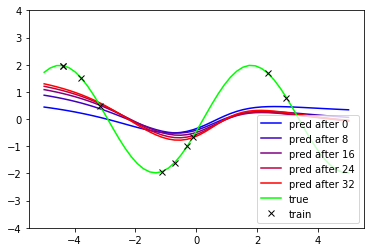

-----------------------------
iteration               350
loss on plotted curve   1.247


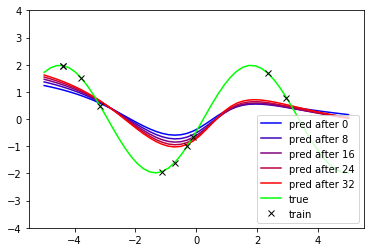

-----------------------------
iteration               360
loss on plotted curve   0.990


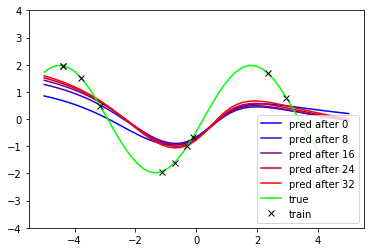

-----------------------------
iteration               370
loss on plotted curve   0.993


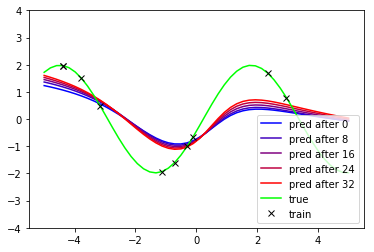

-----------------------------
iteration               380
loss on plotted curve   0.991


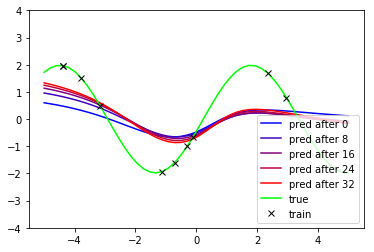

-----------------------------
iteration               390
loss on plotted curve   1.156


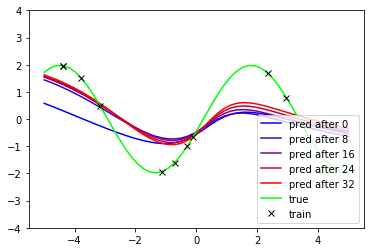

-----------------------------
iteration               400
loss on plotted curve   0.853


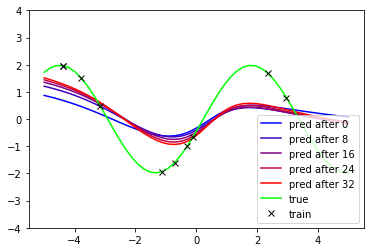

-----------------------------
iteration               410
loss on plotted curve   0.969


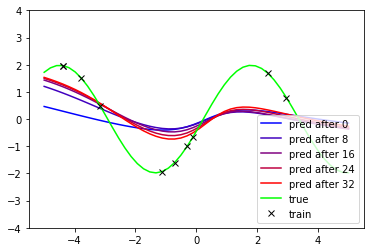

-----------------------------
iteration               420
loss on plotted curve   1.020


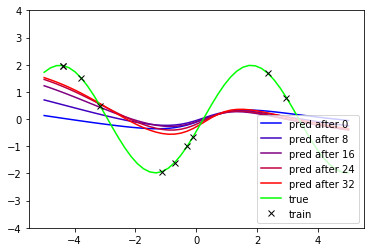

-----------------------------
iteration               430
loss on plotted curve   1.103


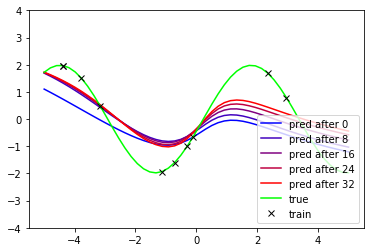

-----------------------------
iteration               440
loss on plotted curve   0.731


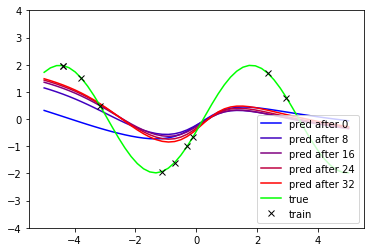

-----------------------------
iteration               450
loss on plotted curve   0.954


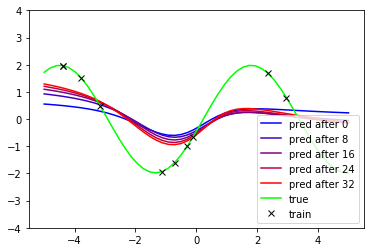

-----------------------------
iteration               460
loss on plotted curve   1.088


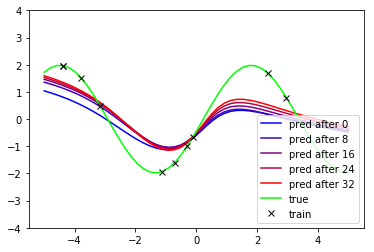

-----------------------------
iteration               470
loss on plotted curve   0.765


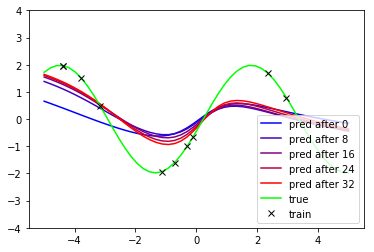

-----------------------------
iteration               480
loss on plotted curve   0.795


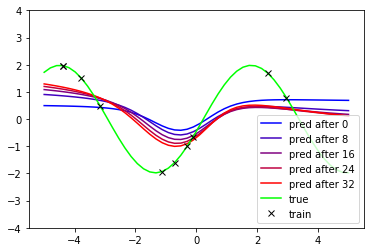

-----------------------------
iteration               490
loss on plotted curve   1.183


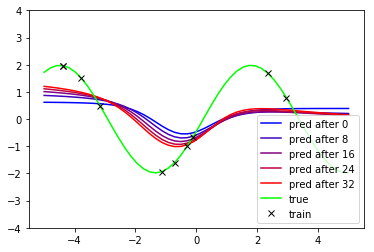

-----------------------------
iteration               500
loss on plotted curve   1.300


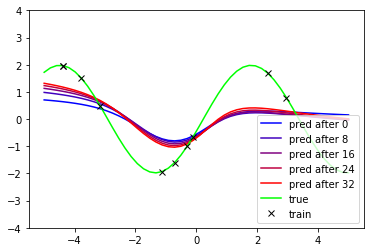

-----------------------------
iteration               510
loss on plotted curve   1.114


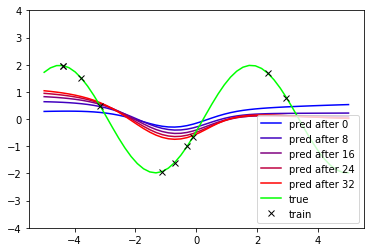

-----------------------------
iteration               520
loss on plotted curve   1.386


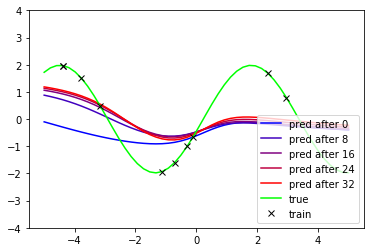

-----------------------------
iteration               530
loss on plotted curve   1.263


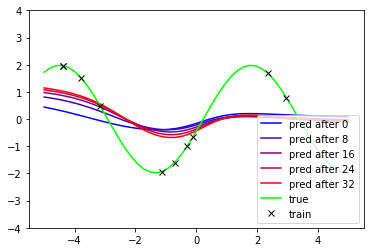

-----------------------------
iteration               540
loss on plotted curve   1.294


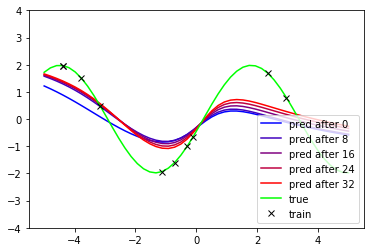

-----------------------------
iteration               550
loss on plotted curve   0.759


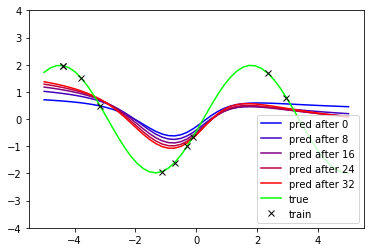

-----------------------------
iteration               560
loss on plotted curve   1.036


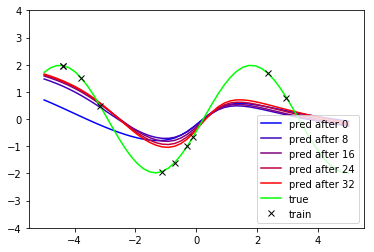

-----------------------------
iteration               570
loss on plotted curve   0.814


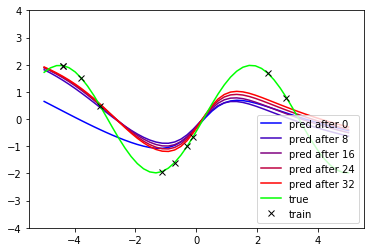

-----------------------------
iteration               580
loss on plotted curve   0.612


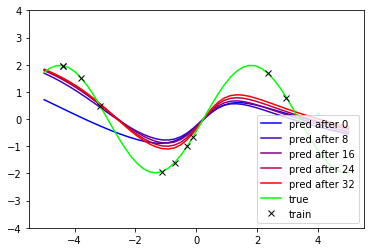

-----------------------------
iteration               590
loss on plotted curve   0.676


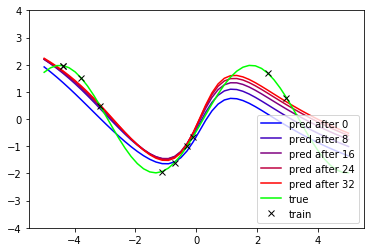

-----------------------------
iteration               600
loss on plotted curve   0.395


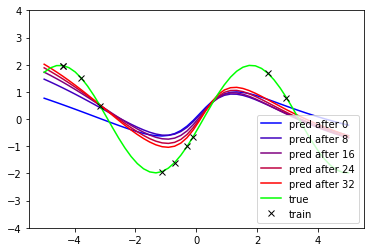

-----------------------------
iteration               610
loss on plotted curve   0.543


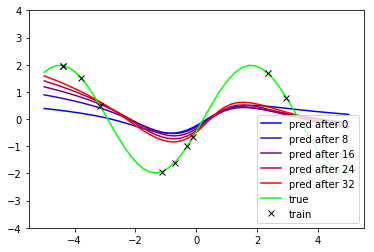

-----------------------------
iteration               620
loss on plotted curve   0.923


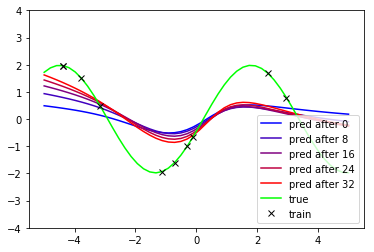

-----------------------------
iteration               630
loss on plotted curve   0.930


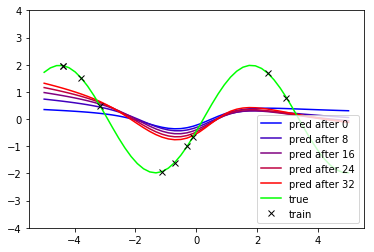

-----------------------------
iteration               640
loss on plotted curve   1.159


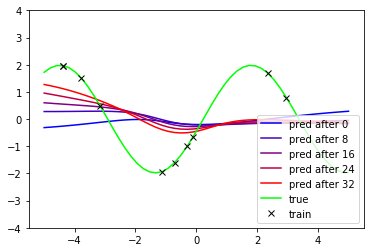

-----------------------------
iteration               650
loss on plotted curve   1.543


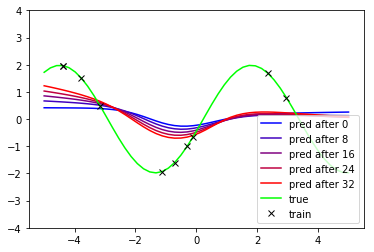

-----------------------------
iteration               660
loss on plotted curve   1.371


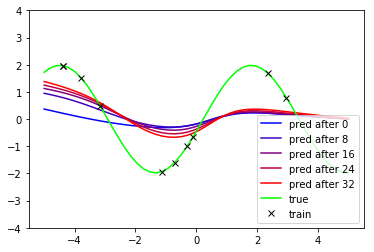

-----------------------------
iteration               670
loss on plotted curve   1.217


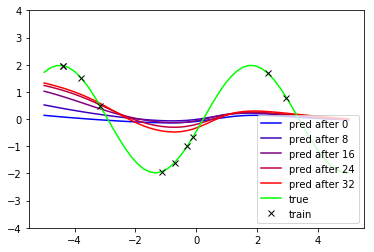

-----------------------------
iteration               680
loss on plotted curve   1.317


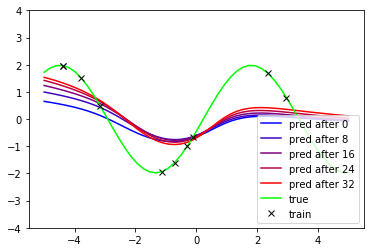

-----------------------------
iteration               690
loss on plotted curve   1.159


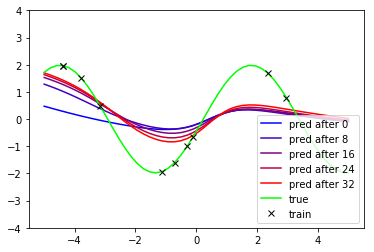

-----------------------------
iteration               700
loss on plotted curve   1.029


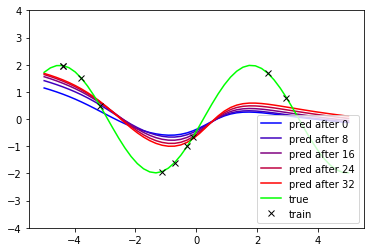

-----------------------------
iteration               710
loss on plotted curve   0.992


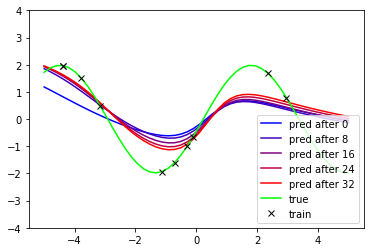

-----------------------------
iteration               720
loss on plotted curve   0.817


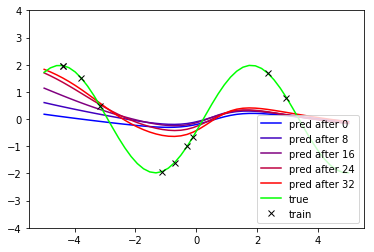

-----------------------------
iteration               730
loss on plotted curve   1.096


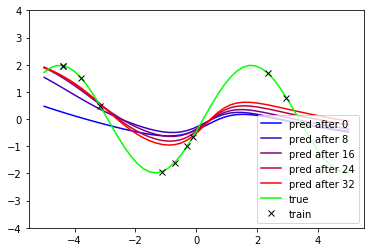

-----------------------------
iteration               740
loss on plotted curve   0.873


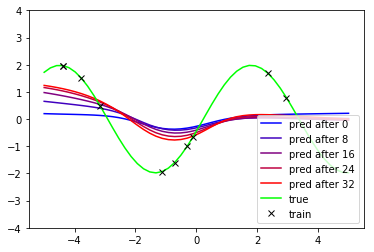

-----------------------------
iteration               750
loss on plotted curve   1.328


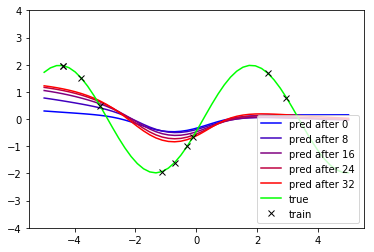

-----------------------------
iteration               760
loss on plotted curve   1.303


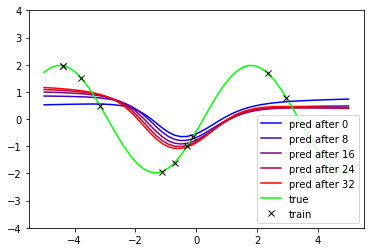

-----------------------------
iteration               770
loss on plotted curve   1.508


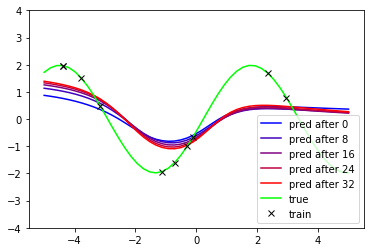

-----------------------------
iteration               780
loss on plotted curve   1.161


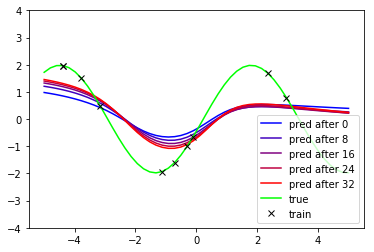

-----------------------------
iteration               790
loss on plotted curve   1.102


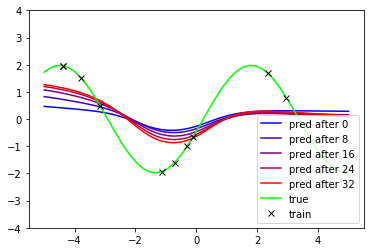

-----------------------------
iteration               800
loss on plotted curve   1.275


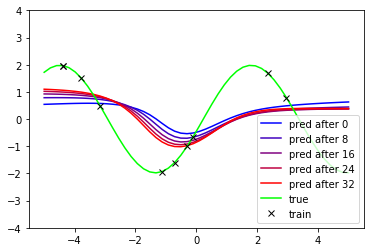

-----------------------------
iteration               810
loss on plotted curve   1.571


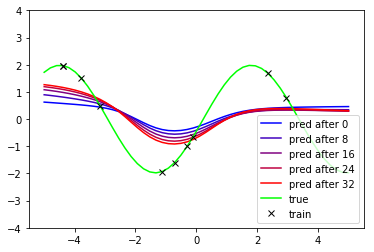

-----------------------------
iteration               820
loss on plotted curve   1.337


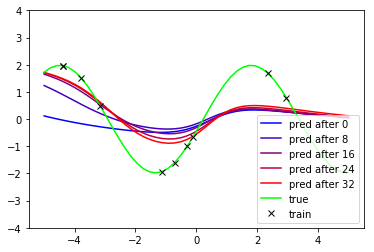

-----------------------------
iteration               830
loss on plotted curve   1.039


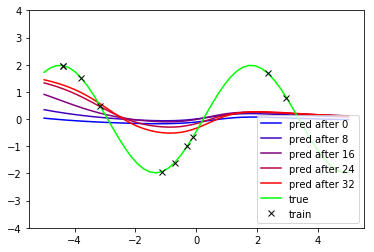

-----------------------------
iteration               840
loss on plotted curve   1.299


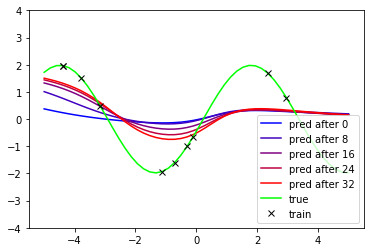

-----------------------------
iteration               850
loss on plotted curve   1.188


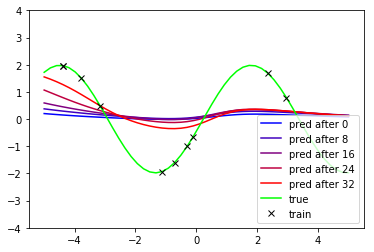

-----------------------------
iteration               860
loss on plotted curve   1.342


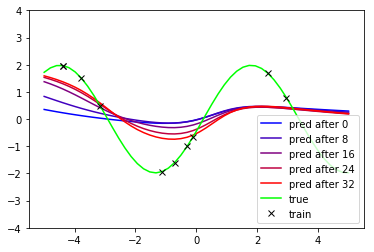

-----------------------------
iteration               870
loss on plotted curve   1.179


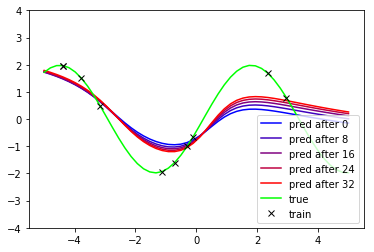

-----------------------------
iteration               880
loss on plotted curve   0.945


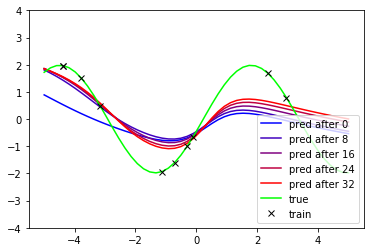

-----------------------------
iteration               890
loss on plotted curve   0.834


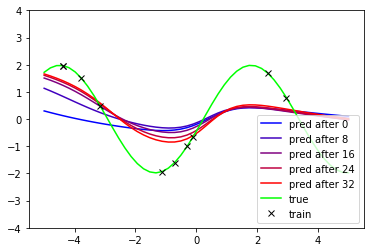

-----------------------------
iteration               900
loss on plotted curve   1.009


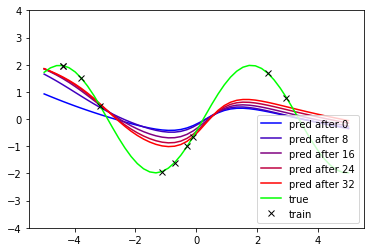

-----------------------------
iteration               910
loss on plotted curve   0.829


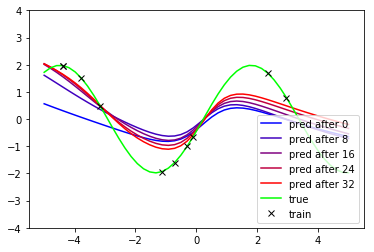

-----------------------------
iteration               920
loss on plotted curve   0.674


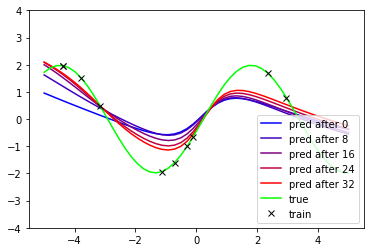

-----------------------------
iteration               930
loss on plotted curve   0.622


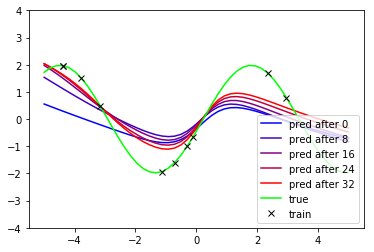

-----------------------------
iteration               940
loss on plotted curve   0.627


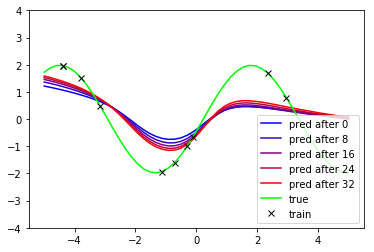

-----------------------------
iteration               950
loss on plotted curve   0.922


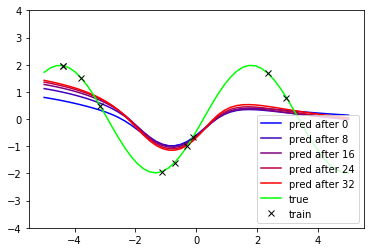

-----------------------------
iteration               960
loss on plotted curve   1.031


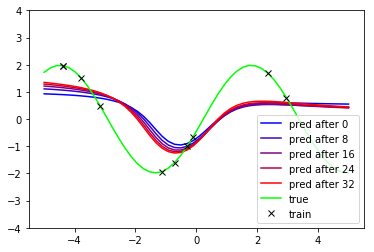

-----------------------------
iteration               970
loss on plotted curve   1.337


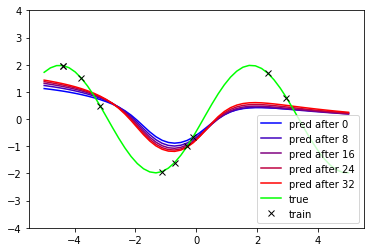

-----------------------------
iteration               980
loss on plotted curve   1.119


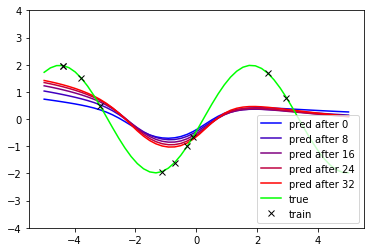

-----------------------------
iteration               990
loss on plotted curve   1.086


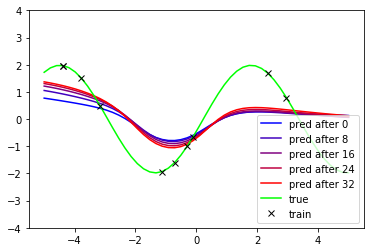

-----------------------------
iteration               1000
loss on plotted curve   1.146


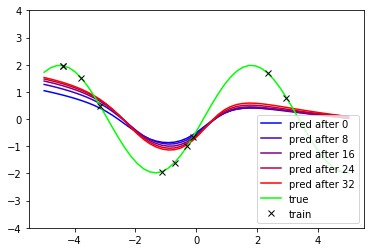

-----------------------------
iteration               1010
loss on plotted curve   0.969


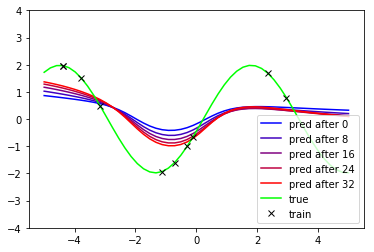

-----------------------------
iteration               1020
loss on plotted curve   1.119


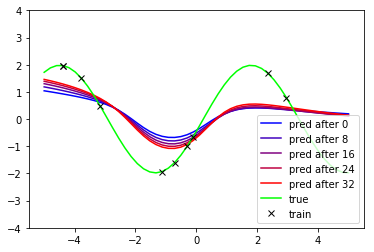

-----------------------------
iteration               1030
loss on plotted curve   1.072


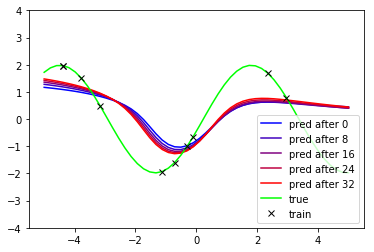

-----------------------------
iteration               1040
loss on plotted curve   1.278


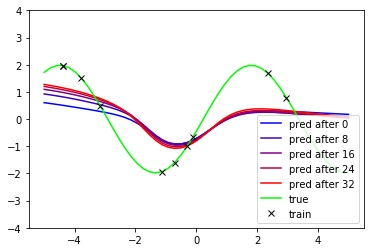

-----------------------------
iteration               1050
loss on plotted curve   1.264


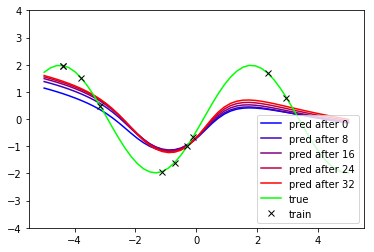

-----------------------------
iteration               1060
loss on plotted curve   0.868


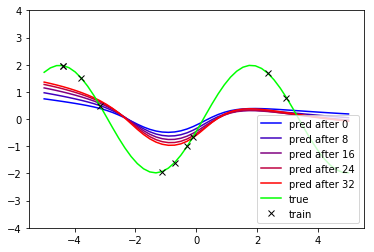

-----------------------------
iteration               1070
loss on plotted curve   1.080


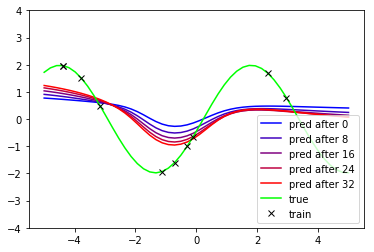

-----------------------------
iteration               1080
loss on plotted curve   1.236


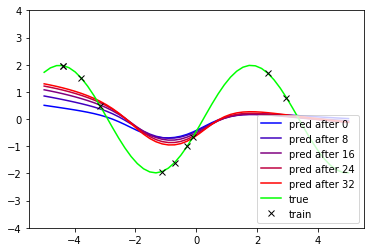

-----------------------------
iteration               1090
loss on plotted curve   1.138


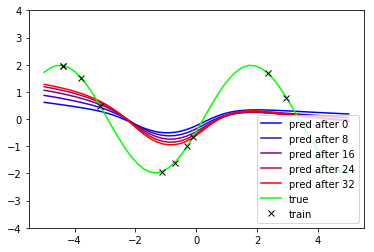

-----------------------------
iteration               1100
loss on plotted curve   1.137


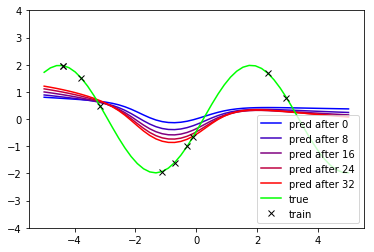

-----------------------------
iteration               1110
loss on plotted curve   1.238


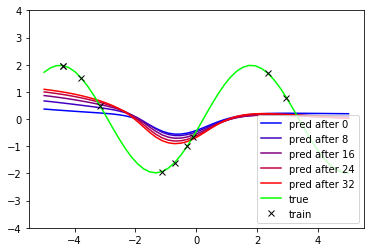

-----------------------------
iteration               1120
loss on plotted curve   1.380


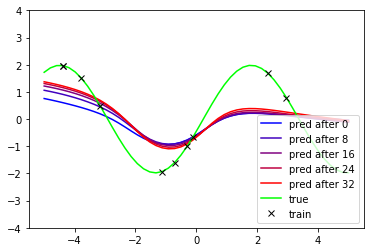

-----------------------------
iteration               1130
loss on plotted curve   1.047


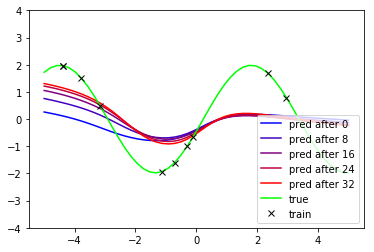

-----------------------------
iteration               1140
loss on plotted curve   1.099


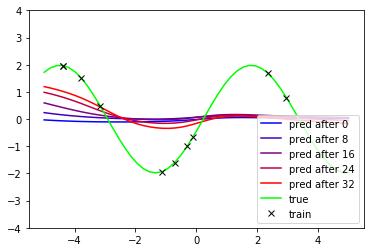

-----------------------------
iteration               1150
loss on plotted curve   1.402


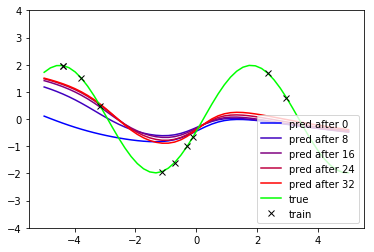

-----------------------------
iteration               1160
loss on plotted curve   0.986


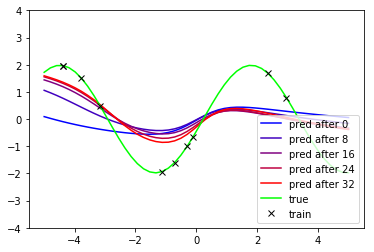

-----------------------------
iteration               1170
loss on plotted curve   0.917


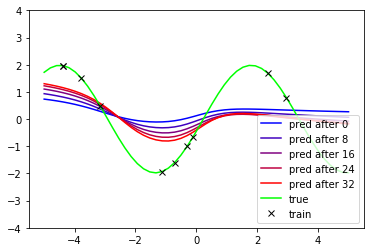

-----------------------------
iteration               1180
loss on plotted curve   1.125


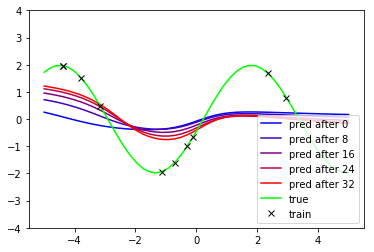

-----------------------------
iteration               1190
loss on plotted curve   1.202


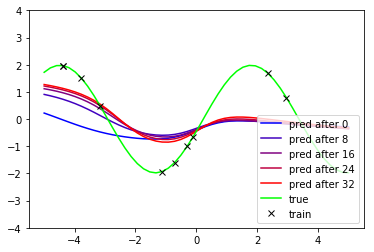

-----------------------------
iteration               1200
loss on plotted curve   1.151


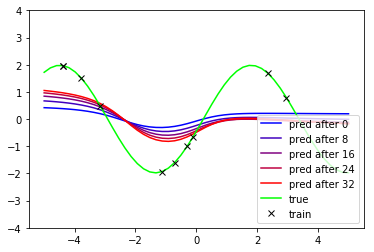

-----------------------------
iteration               1210
loss on plotted curve   1.288


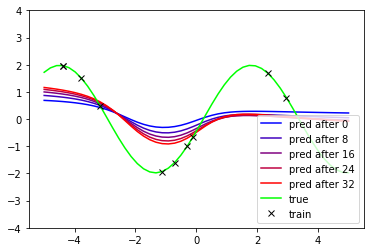

-----------------------------
iteration               1220
loss on plotted curve   1.178


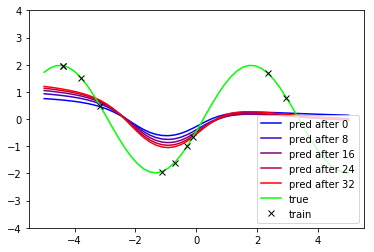

-----------------------------
iteration               1230
loss on plotted curve   1.127


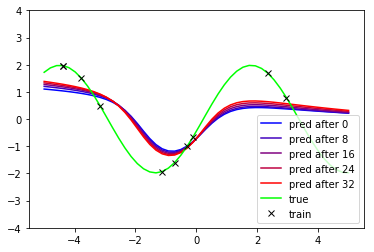

-----------------------------
iteration               1240
loss on plotted curve   1.106


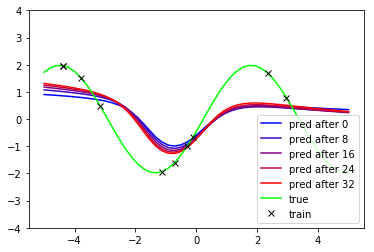

-----------------------------
iteration               1250
loss on plotted curve   1.191


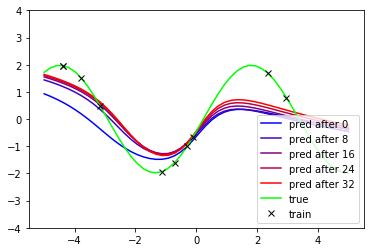

-----------------------------
iteration               1260
loss on plotted curve   0.697


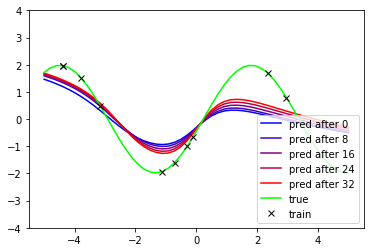

-----------------------------
iteration               1270
loss on plotted curve   0.677


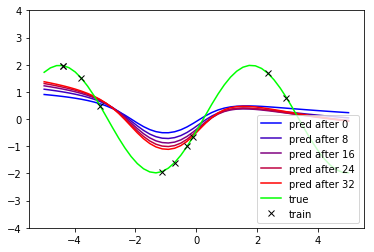

-----------------------------
iteration               1280
loss on plotted curve   0.969


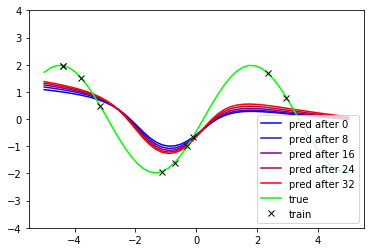

-----------------------------
iteration               1290
loss on plotted curve   1.007


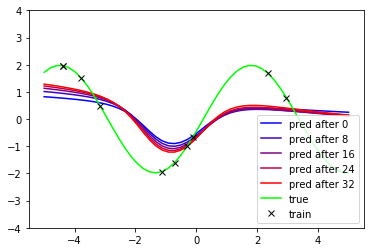

-----------------------------
iteration               1300
loss on plotted curve   1.146


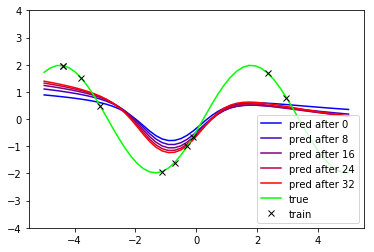

-----------------------------
iteration               1310
loss on plotted curve   1.039


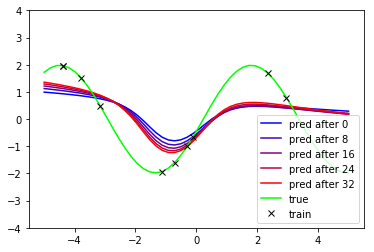

-----------------------------
iteration               1320
loss on plotted curve   1.126


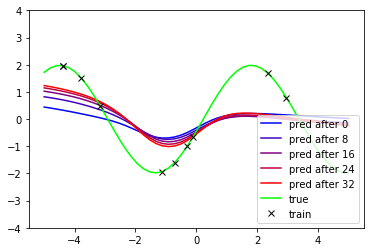

-----------------------------
iteration               1330
loss on plotted curve   1.114


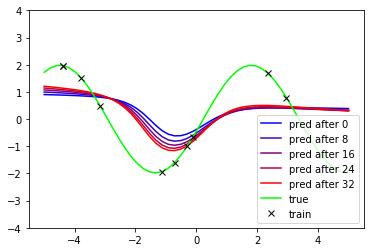

-----------------------------
iteration               1340
loss on plotted curve   1.305


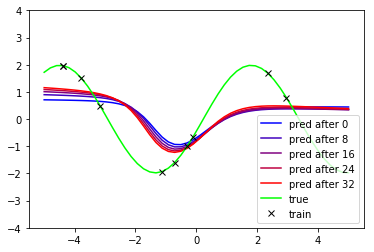

-----------------------------
iteration               1350
loss on plotted curve   1.423


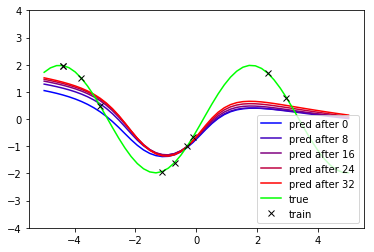

-----------------------------
iteration               1360
loss on plotted curve   0.909


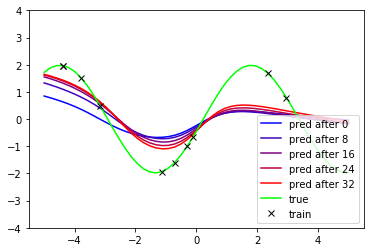

-----------------------------
iteration               1370
loss on plotted curve   0.870


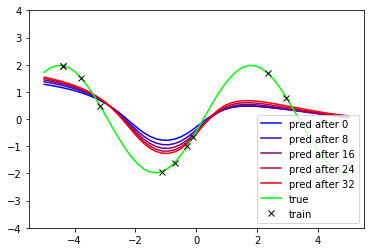

-----------------------------
iteration               1380
loss on plotted curve   0.888


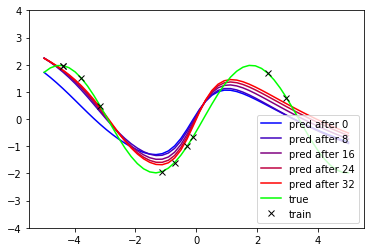

-----------------------------
iteration               1390
loss on plotted curve   0.383


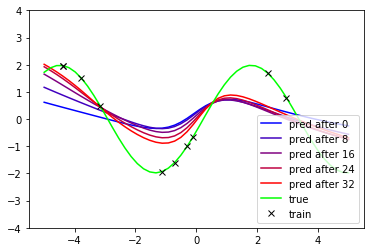

-----------------------------
iteration               1400
loss on plotted curve   0.645


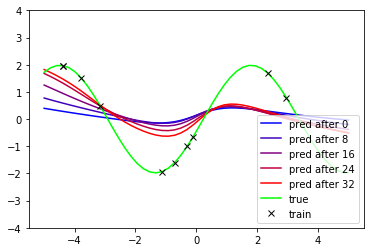

-----------------------------
iteration               1410
loss on plotted curve   0.911


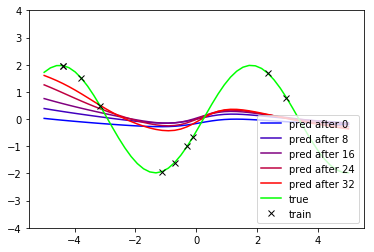

-----------------------------
iteration               1420
loss on plotted curve   1.149


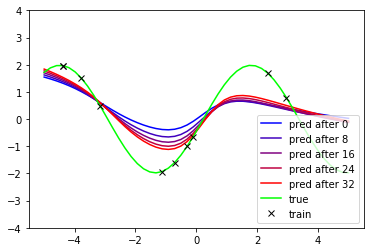

-----------------------------
iteration               1430
loss on plotted curve   0.748


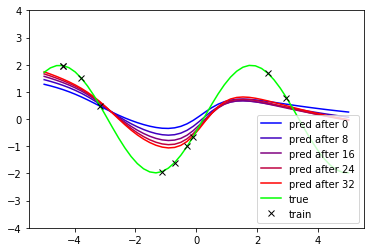

-----------------------------
iteration               1440
loss on plotted curve   0.811


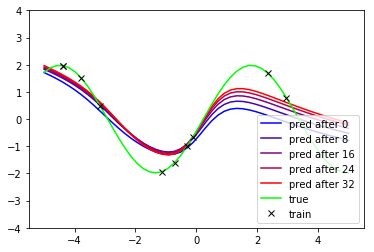

-----------------------------
iteration               1450
loss on plotted curve   0.614


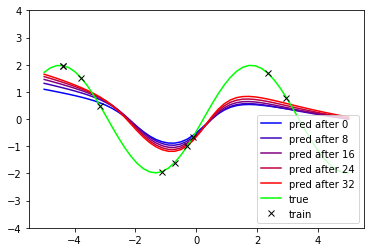

-----------------------------
iteration               1460
loss on plotted curve   0.900


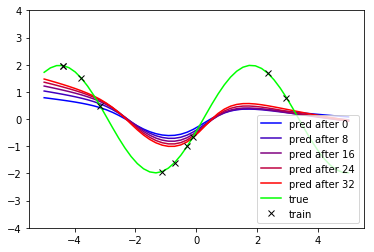

-----------------------------
iteration               1470
loss on plotted curve   0.982


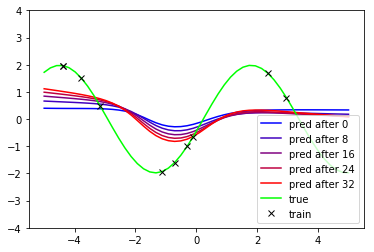

-----------------------------
iteration               1480
loss on plotted curve   1.343


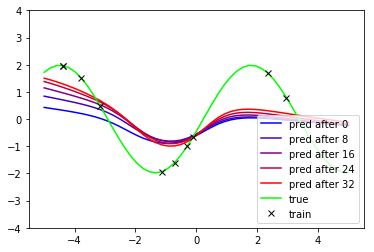

-----------------------------
iteration               1490
loss on plotted curve   1.047


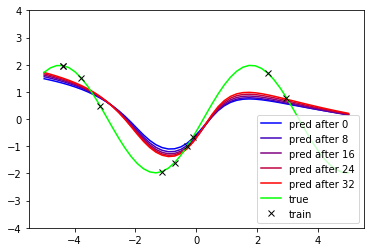

-----------------------------
iteration               1500
loss on plotted curve   0.874


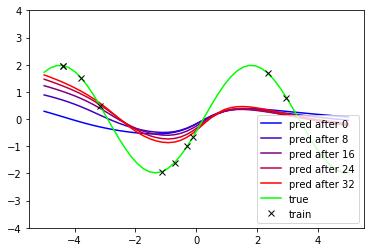

-----------------------------
iteration               1510
loss on plotted curve   0.935


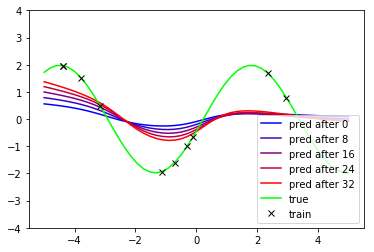

-----------------------------
iteration               1520
loss on plotted curve   1.133


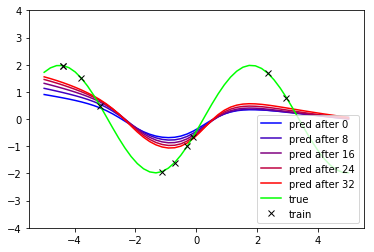

-----------------------------
iteration               1530
loss on plotted curve   0.993


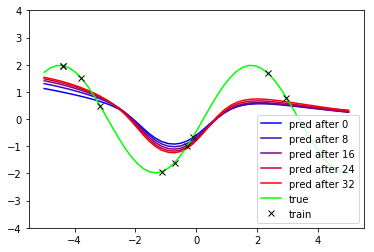

-----------------------------
iteration               1540
loss on plotted curve   1.100


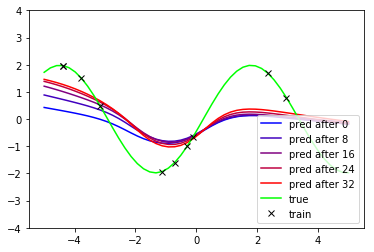

-----------------------------
iteration               1550
loss on plotted curve   1.055


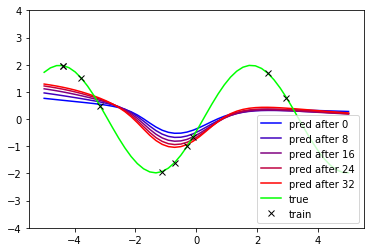

-----------------------------
iteration               1560
loss on plotted curve   1.289


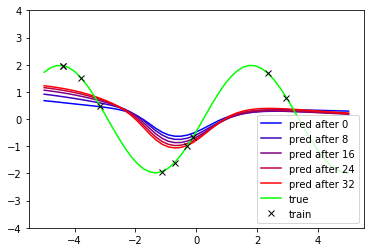

-----------------------------
iteration               1570
loss on plotted curve   1.346


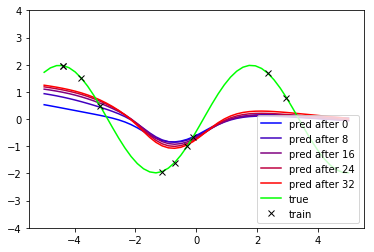

-----------------------------
iteration               1580
loss on plotted curve   1.228


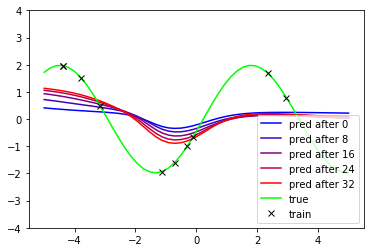

-----------------------------
iteration               1590
loss on plotted curve   1.380


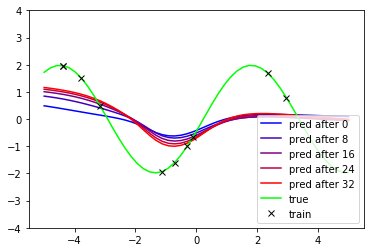

-----------------------------
iteration               1600
loss on plotted curve   1.292


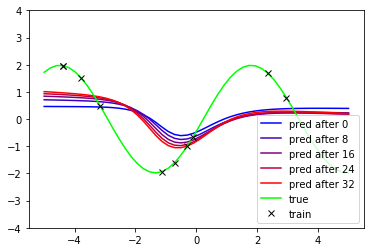

-----------------------------
iteration               1610
loss on plotted curve   1.546


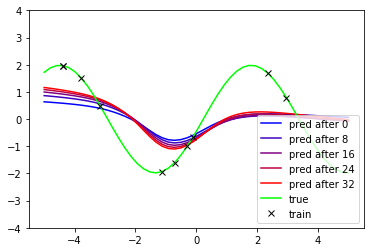

-----------------------------
iteration               1620
loss on plotted curve   1.255


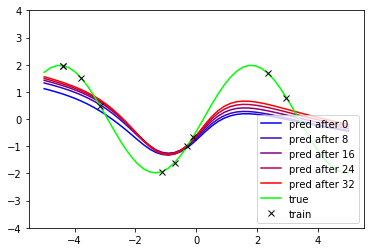

-----------------------------
iteration               1630
loss on plotted curve   0.800


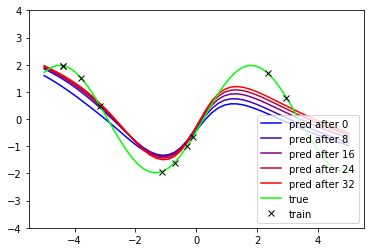

-----------------------------
iteration               1640
loss on plotted curve   0.447


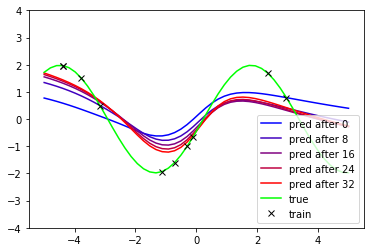

-----------------------------
iteration               1650
loss on plotted curve   0.716


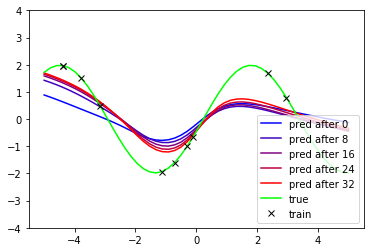

-----------------------------
iteration               1660
loss on plotted curve   0.704


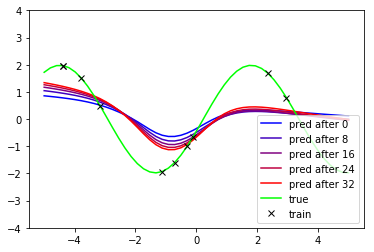

-----------------------------
iteration               1670
loss on plotted curve   1.080


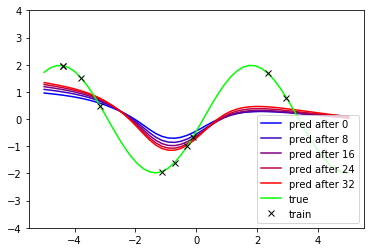

-----------------------------
iteration               1680
loss on plotted curve   1.121


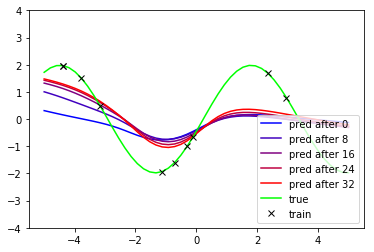

-----------------------------
iteration               1690
loss on plotted curve   0.982


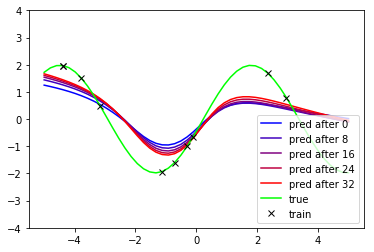

-----------------------------
iteration               1700
loss on plotted curve   0.784


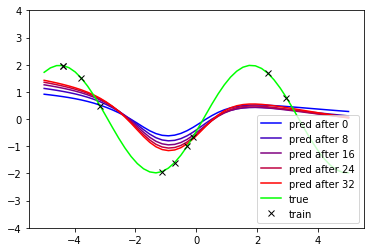

-----------------------------
iteration               1710
loss on plotted curve   1.019


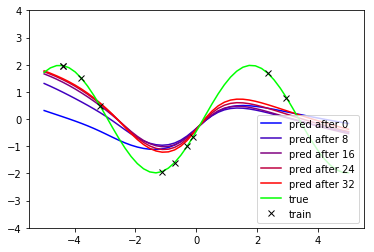

-----------------------------
iteration               1720
loss on plotted curve   0.664


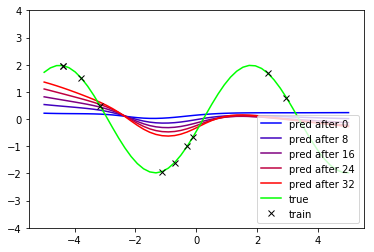

-----------------------------
iteration               1730
loss on plotted curve   1.236


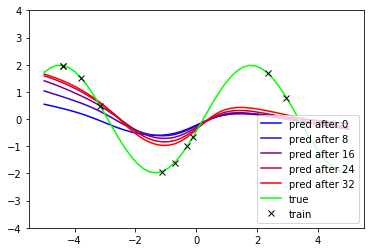

-----------------------------
iteration               1740
loss on plotted curve   0.882


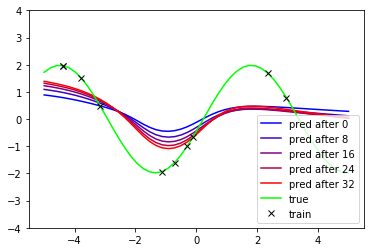

-----------------------------
iteration               1750
loss on plotted curve   1.047


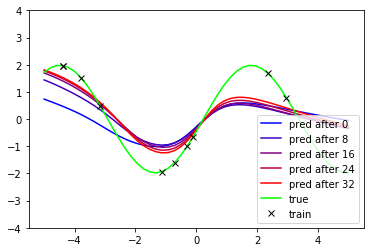

-----------------------------
iteration               1760
loss on plotted curve   0.667


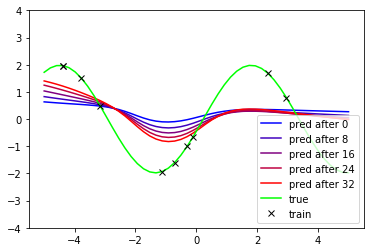

-----------------------------
iteration               1770
loss on plotted curve   1.145


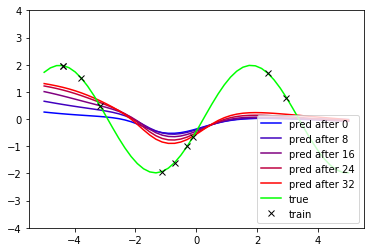

-----------------------------
iteration               1780
loss on plotted curve   1.239


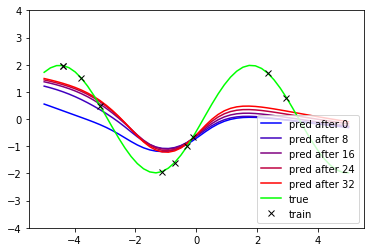

-----------------------------
iteration               1790
loss on plotted curve   0.907


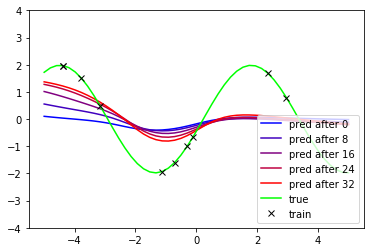

-----------------------------
iteration               1800
loss on plotted curve   1.166


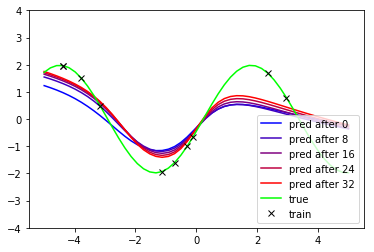

-----------------------------
iteration               1810
loss on plotted curve   0.629


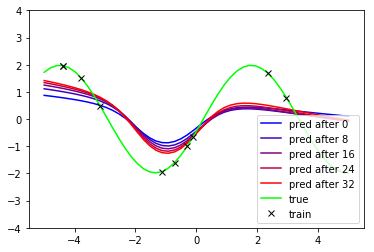

-----------------------------
iteration               1820
loss on plotted curve   0.929


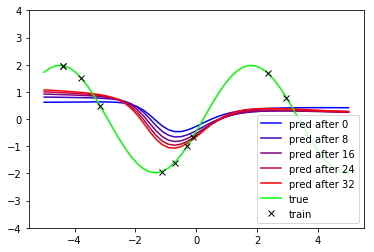

-----------------------------
iteration               1830
loss on plotted curve   1.444


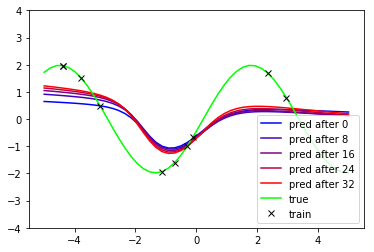

-----------------------------
iteration               1840
loss on plotted curve   1.206


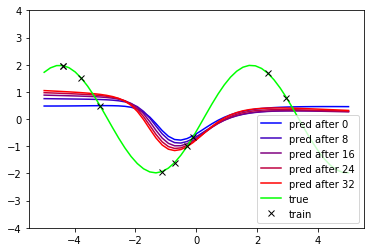

-----------------------------
iteration               1850
loss on plotted curve   1.531


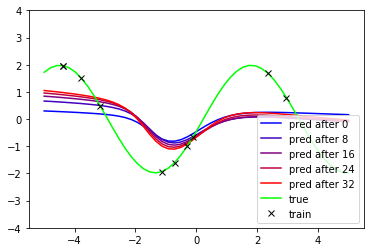

-----------------------------
iteration               1860
loss on plotted curve   1.316


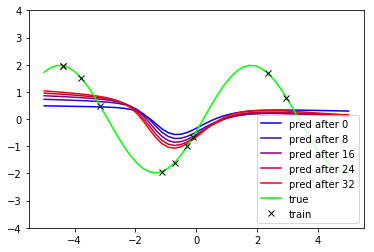

-----------------------------
iteration               1870
loss on plotted curve   1.438


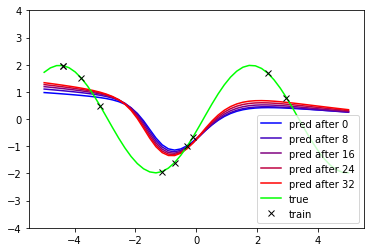

-----------------------------
iteration               1880
loss on plotted curve   1.261


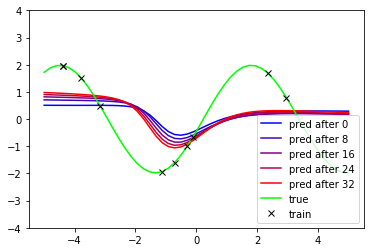

-----------------------------
iteration               1890
loss on plotted curve   1.558


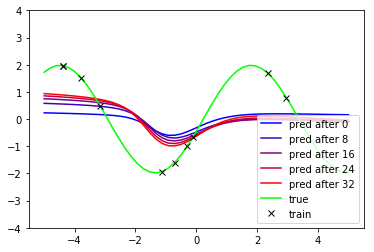

-----------------------------
iteration               1900
loss on plotted curve   1.441


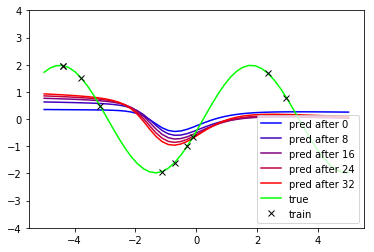

-----------------------------
iteration               1910
loss on plotted curve   1.524


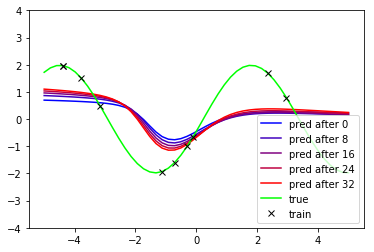

-----------------------------
iteration               1920
loss on plotted curve   1.372


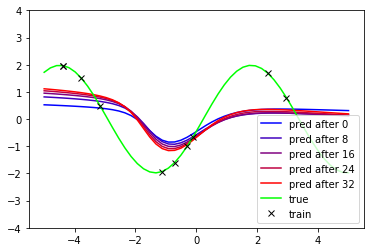

-----------------------------
iteration               1930
loss on plotted curve   1.340


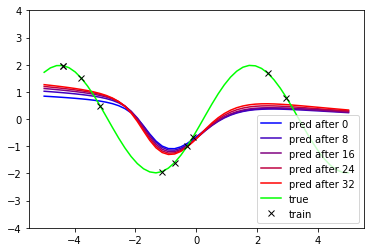

-----------------------------
iteration               1940
loss on plotted curve   1.276


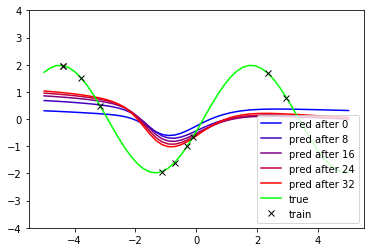

-----------------------------
iteration               1950
loss on plotted curve   1.393


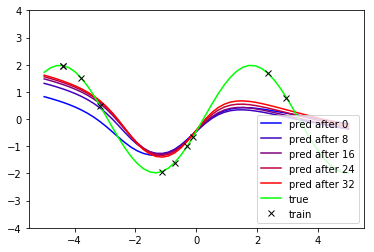

-----------------------------
iteration               1960
loss on plotted curve   0.706


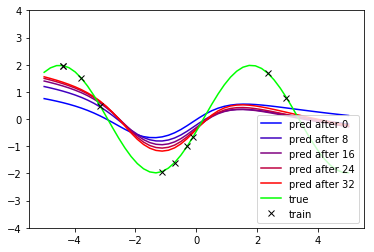

-----------------------------
iteration               1970
loss on plotted curve   0.813


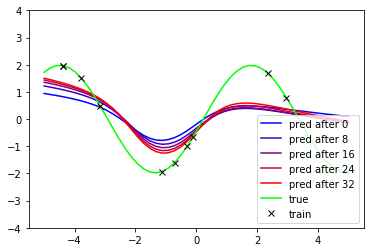

-----------------------------
iteration               1980
loss on plotted curve   0.860


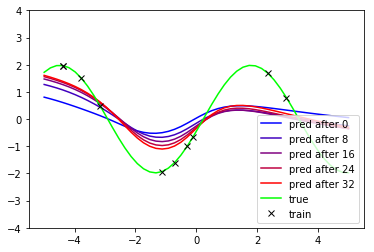

-----------------------------
iteration               1990
loss on plotted curve   0.812


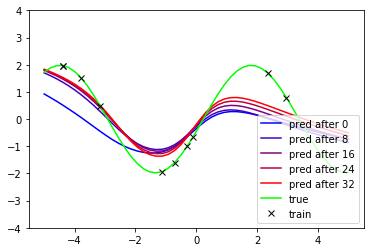

-----------------------------
iteration               2000
loss on plotted curve   0.556


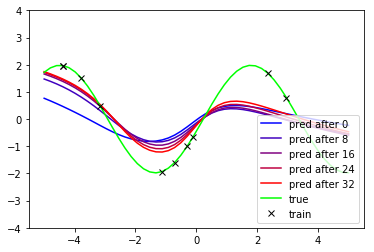

-----------------------------
iteration               2010
loss on plotted curve   0.654


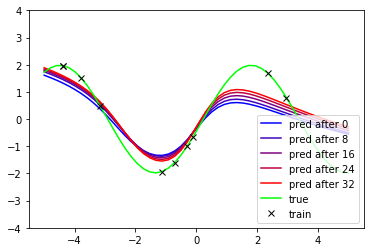

-----------------------------
iteration               2020
loss on plotted curve   0.517


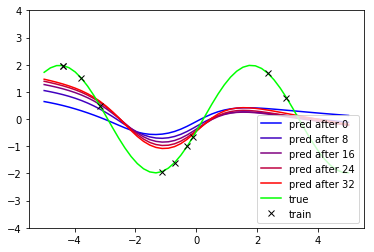

-----------------------------
iteration               2030
loss on plotted curve   0.911


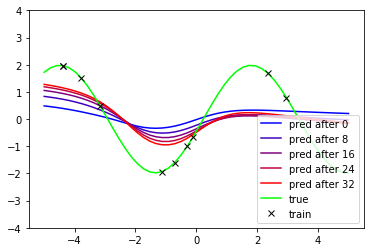

-----------------------------
iteration               2040
loss on plotted curve   1.099


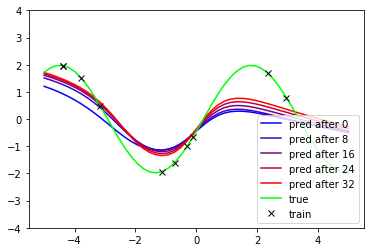

-----------------------------
iteration               2050
loss on plotted curve   0.649


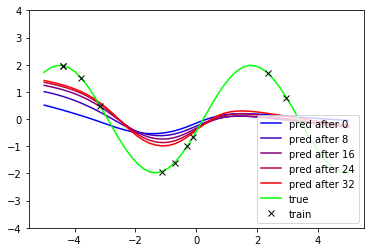

-----------------------------
iteration               2060
loss on plotted curve   0.977


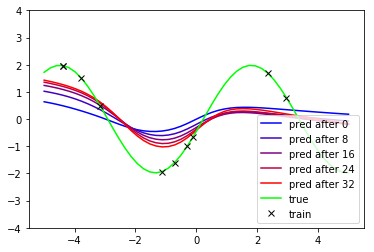

-----------------------------
iteration               2070
loss on plotted curve   0.949


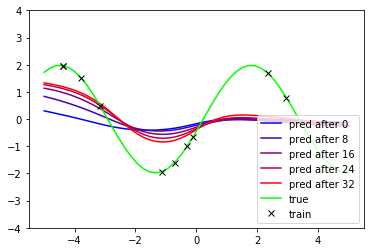

-----------------------------
iteration               2080
loss on plotted curve   1.117


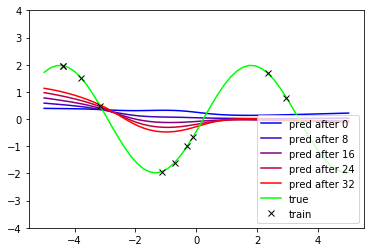

-----------------------------
iteration               2090
loss on plotted curve   1.425


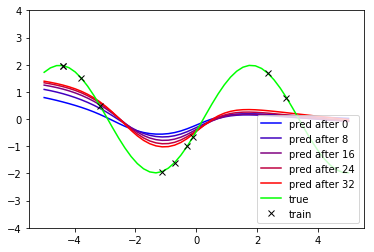

-----------------------------
iteration               2100
loss on plotted curve   1.024


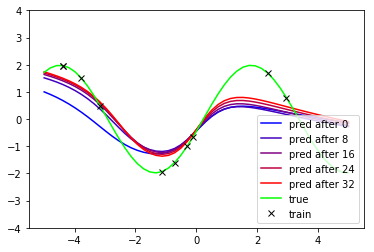

-----------------------------
iteration               2110
loss on plotted curve   0.690


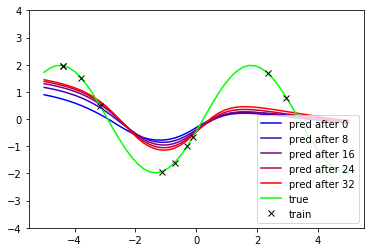

-----------------------------
iteration               2120
loss on plotted curve   0.919


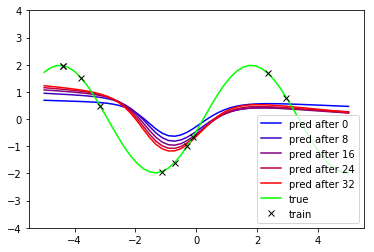

-----------------------------
iteration               2130
loss on plotted curve   1.249


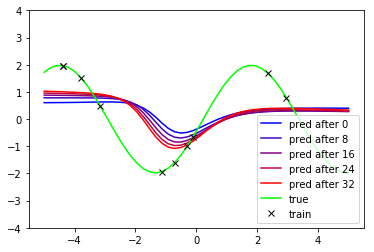

-----------------------------
iteration               2140
loss on plotted curve   1.547


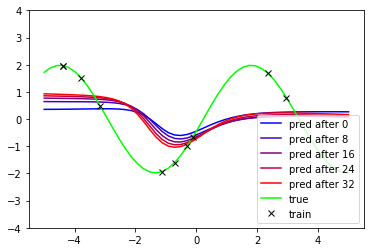

-----------------------------
iteration               2150
loss on plotted curve   1.552


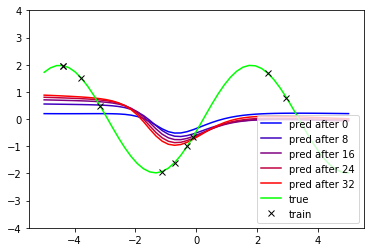

-----------------------------
iteration               2160
loss on plotted curve   1.545


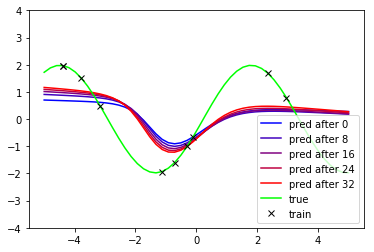

-----------------------------
iteration               2170
loss on plotted curve   1.337


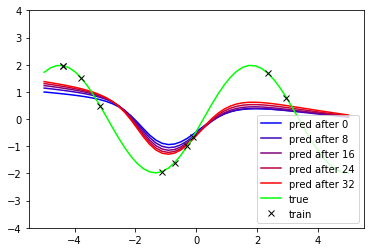

-----------------------------
iteration               2180
loss on plotted curve   1.048


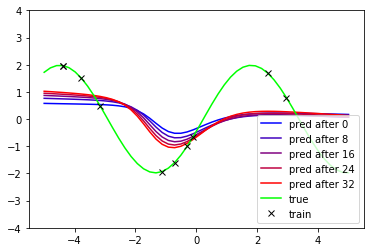

-----------------------------
iteration               2190
loss on plotted curve   1.432


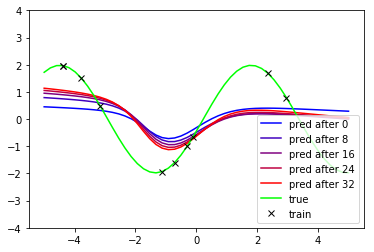

-----------------------------
iteration               2200
loss on plotted curve   1.240


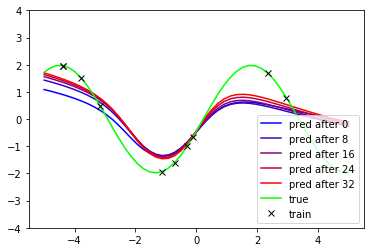

-----------------------------
iteration               2210
loss on plotted curve   0.672


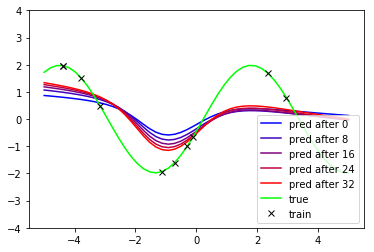

-----------------------------
iteration               2220
loss on plotted curve   1.045


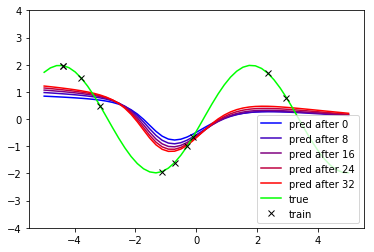

-----------------------------
iteration               2230
loss on plotted curve   1.262


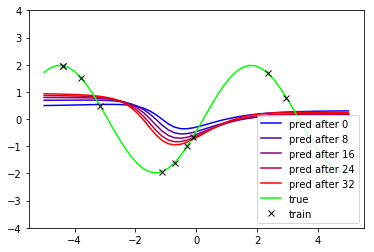

-----------------------------
iteration               2240
loss on plotted curve   1.627


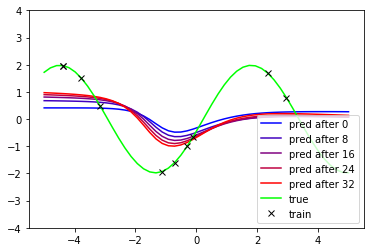

-----------------------------
iteration               2250
loss on plotted curve   1.497


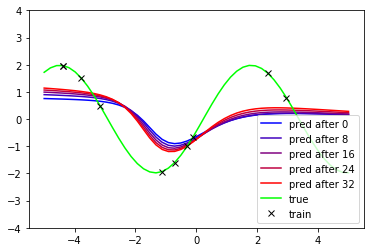

-----------------------------
iteration               2260
loss on plotted curve   1.369


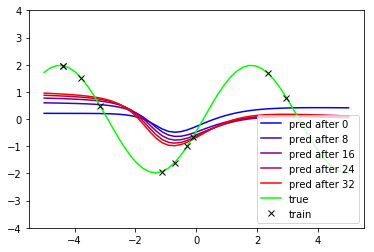

-----------------------------
iteration               2270
loss on plotted curve   1.515


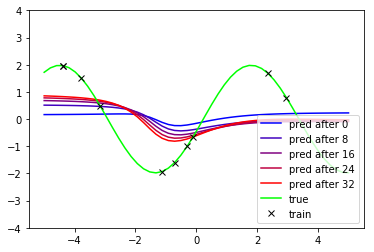

-----------------------------
iteration               2280
loss on plotted curve   1.623


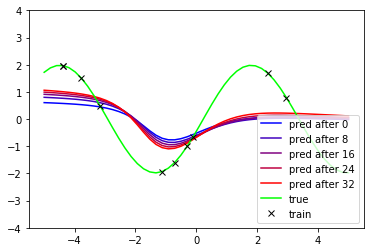

-----------------------------
iteration               2290
loss on plotted curve   1.348


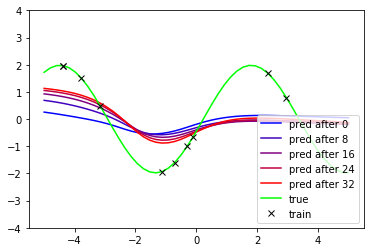

-----------------------------
iteration               2300
loss on plotted curve   1.265


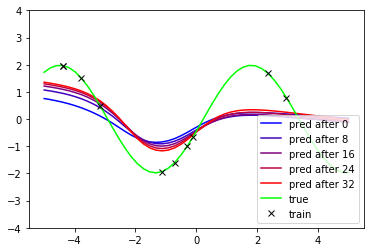

-----------------------------
iteration               2310
loss on plotted curve   1.001


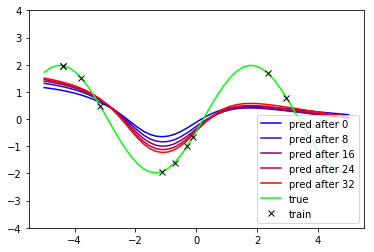

-----------------------------
iteration               2320
loss on plotted curve   0.924


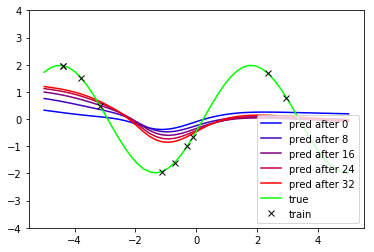

-----------------------------
iteration               2330
loss on plotted curve   1.276


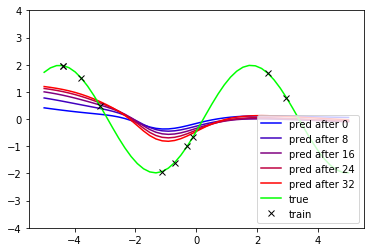

-----------------------------
iteration               2340
loss on plotted curve   1.310


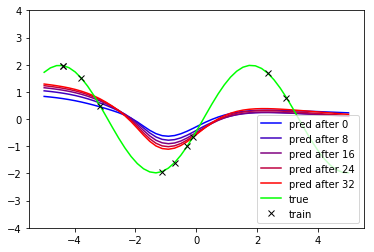

-----------------------------
iteration               2350
loss on plotted curve   1.181


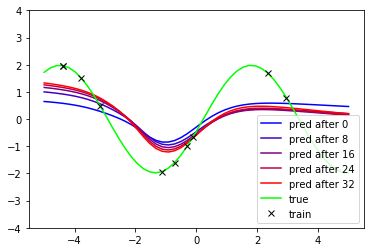

-----------------------------
iteration               2360
loss on plotted curve   1.120


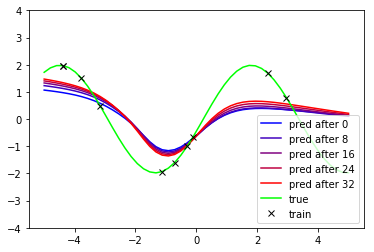

-----------------------------
iteration               2370
loss on plotted curve   1.014


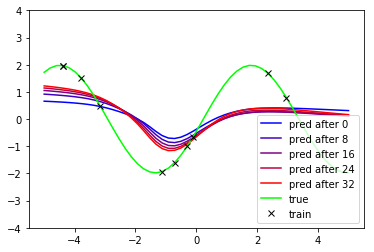

-----------------------------
iteration               2380
loss on plotted curve   1.235


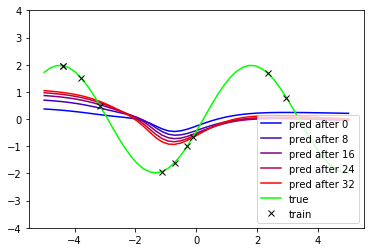

-----------------------------
iteration               2390
loss on plotted curve   1.409


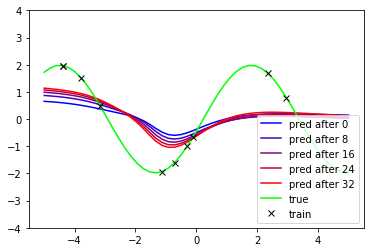

-----------------------------
iteration               2400
loss on plotted curve   1.331


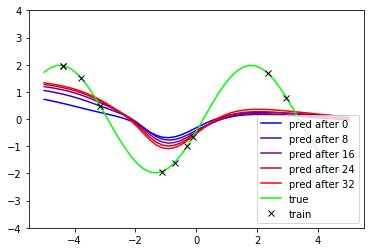

-----------------------------
iteration               2410
loss on plotted curve   1.147


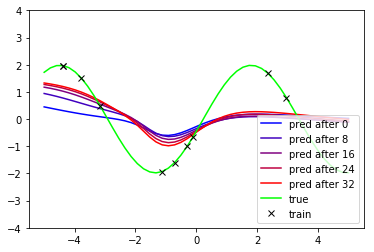

-----------------------------
iteration               2420
loss on plotted curve   1.184


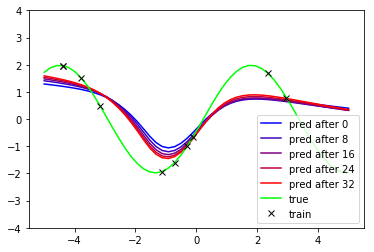

-----------------------------
iteration               2430
loss on plotted curve   1.005


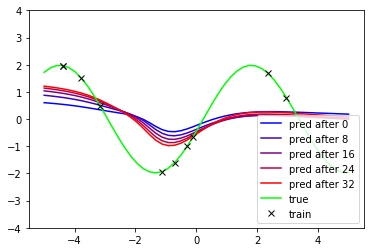

-----------------------------
iteration               2440
loss on plotted curve   1.291


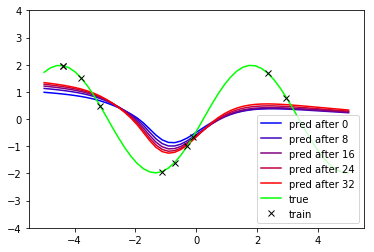

-----------------------------
iteration               2450
loss on plotted curve   1.212


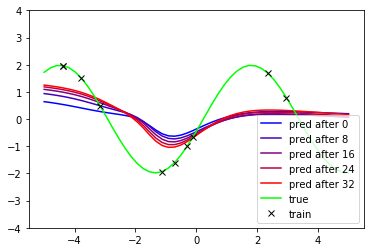

-----------------------------
iteration               2460
loss on plotted curve   1.297


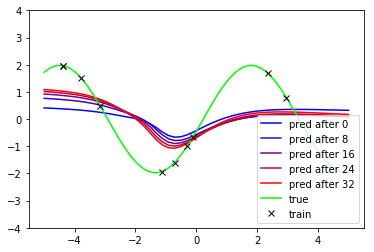

-----------------------------
iteration               2470
loss on plotted curve   1.414


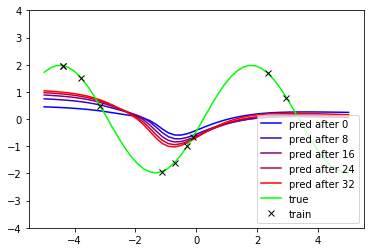

-----------------------------
iteration               2480
loss on plotted curve   1.473


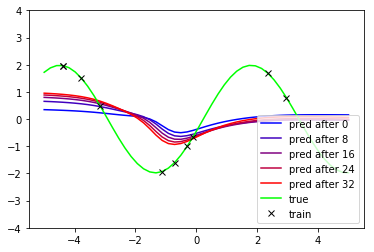

-----------------------------
iteration               2490
loss on plotted curve   1.561


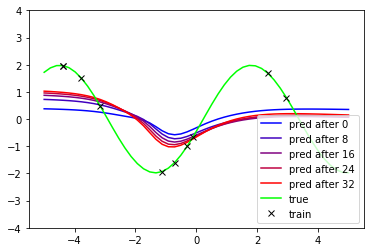

-----------------------------
iteration               2500
loss on plotted curve   1.463


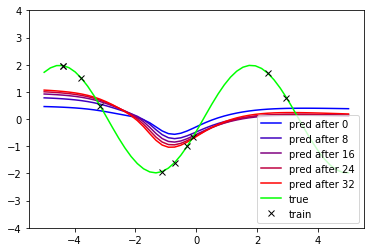

-----------------------------
iteration               2510
loss on plotted curve   1.435


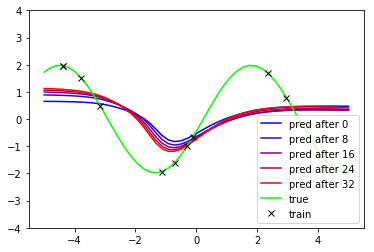

-----------------------------
iteration               2520
loss on plotted curve   1.466


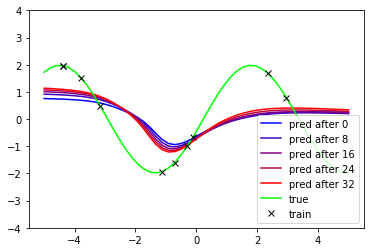

-----------------------------
iteration               2530
loss on plotted curve   1.406


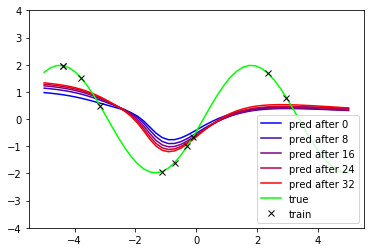

-----------------------------
iteration               2540
loss on plotted curve   1.313


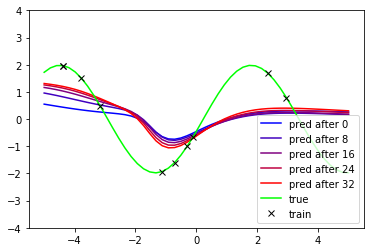

-----------------------------
iteration               2550
loss on plotted curve   1.388


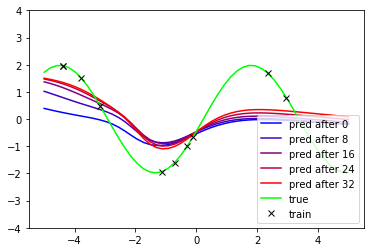

-----------------------------
iteration               2560
loss on plotted curve   1.097


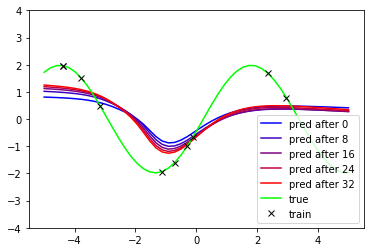

-----------------------------
iteration               2570
loss on plotted curve   1.274


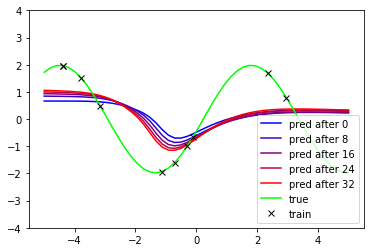

-----------------------------
iteration               2580
loss on plotted curve   1.502


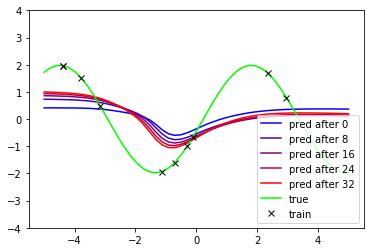

-----------------------------
iteration               2590
loss on plotted curve   1.514


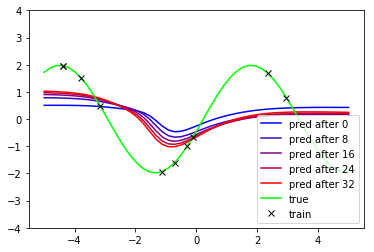

-----------------------------
iteration               2600
loss on plotted curve   1.529


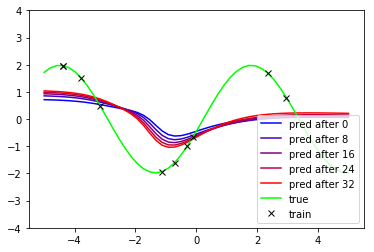

-----------------------------
iteration               2610
loss on plotted curve   1.503


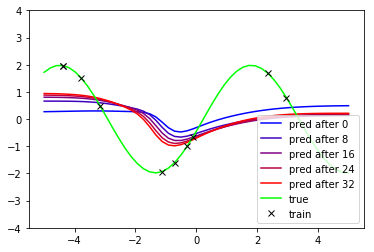

-----------------------------
iteration               2620
loss on plotted curve   1.668


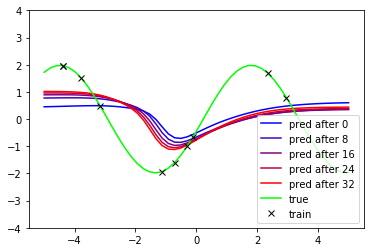

-----------------------------
iteration               2630
loss on plotted curve   1.677


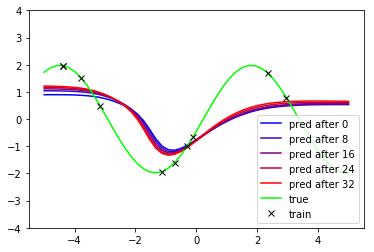

-----------------------------
iteration               2640
loss on plotted curve   1.526


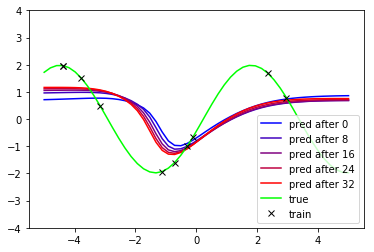

-----------------------------
iteration               2650
loss on plotted curve   1.751


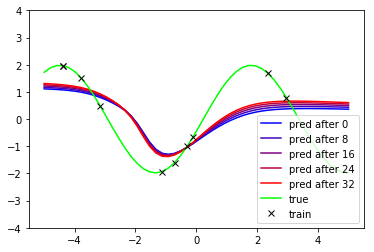

-----------------------------
iteration               2660
loss on plotted curve   1.364


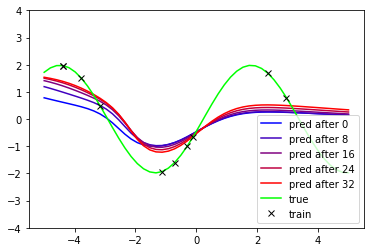

-----------------------------
iteration               2670
loss on plotted curve   1.082


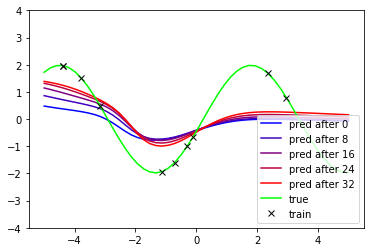

-----------------------------
iteration               2680
loss on plotted curve   1.199


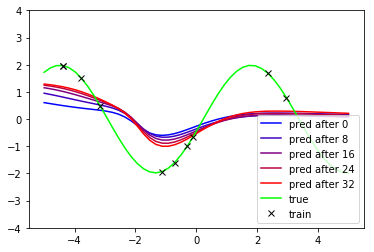

-----------------------------
iteration               2690
loss on plotted curve   1.293


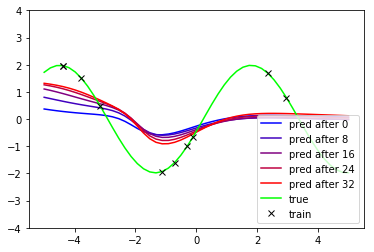

-----------------------------
iteration               2700
loss on plotted curve   1.299


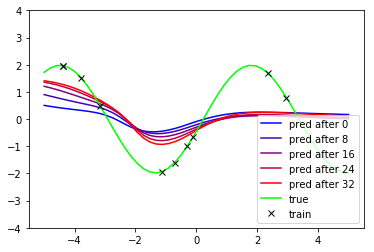

-----------------------------
iteration               2710
loss on plotted curve   1.188


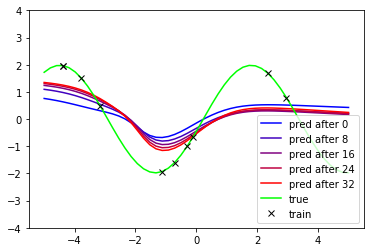

-----------------------------
iteration               2720
loss on plotted curve   1.167


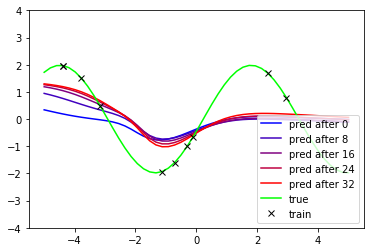

-----------------------------
iteration               2730
loss on plotted curve   1.224


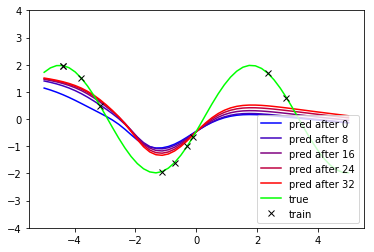

-----------------------------
iteration               2740
loss on plotted curve   0.935


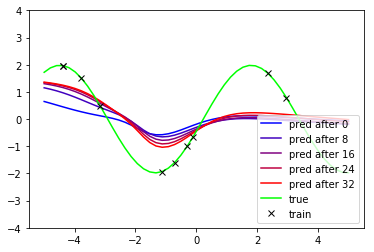

-----------------------------
iteration               2750
loss on plotted curve   1.128


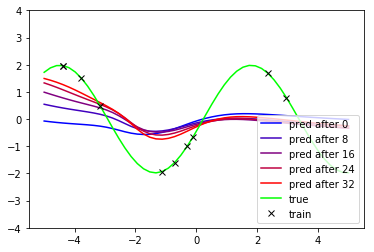

-----------------------------
iteration               2760
loss on plotted curve   1.200


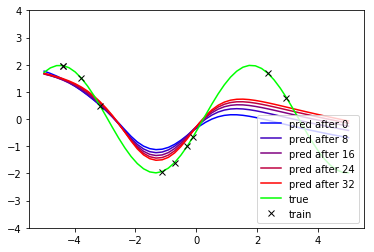

-----------------------------
iteration               2770
loss on plotted curve   0.695


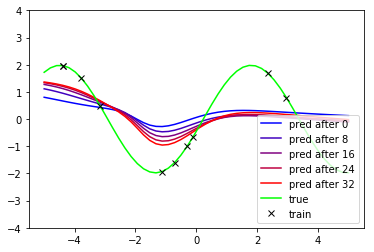

-----------------------------
iteration               2780
loss on plotted curve   1.160


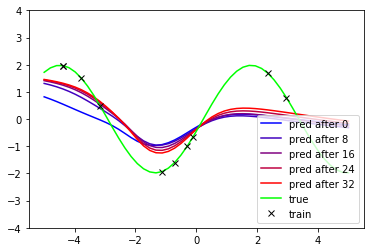

-----------------------------
iteration               2790
loss on plotted curve   0.914


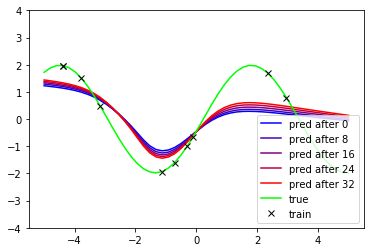

-----------------------------
iteration               2800
loss on plotted curve   0.918


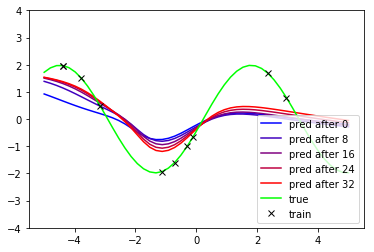

-----------------------------
iteration               2810
loss on plotted curve   0.926


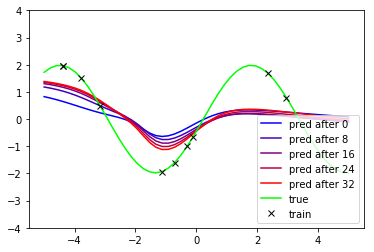

-----------------------------
iteration               2820
loss on plotted curve   1.065


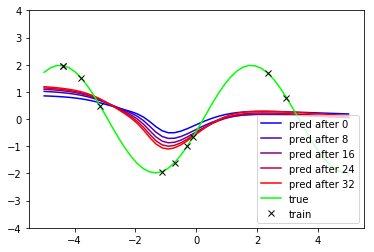

-----------------------------
iteration               2830
loss on plotted curve   1.254


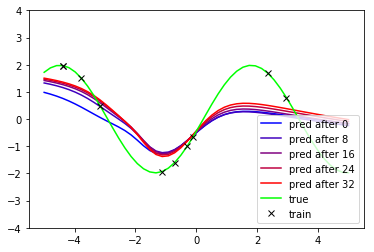

-----------------------------
iteration               2840
loss on plotted curve   0.871


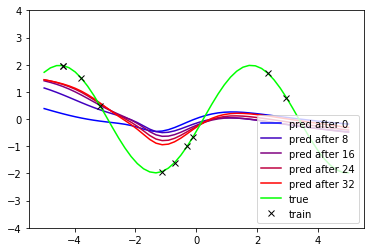

-----------------------------
iteration               2850
loss on plotted curve   1.059


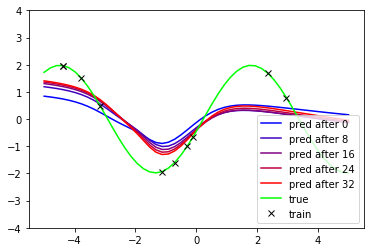

-----------------------------
iteration               2860
loss on plotted curve   0.924


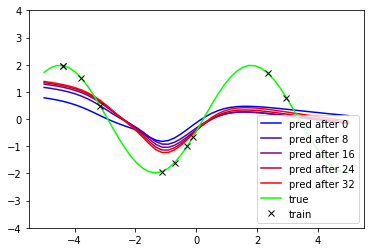

-----------------------------
iteration               2870
loss on plotted curve   0.966


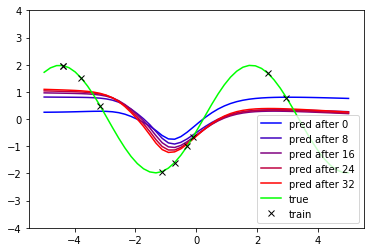

-----------------------------
iteration               2880
loss on plotted curve   1.363


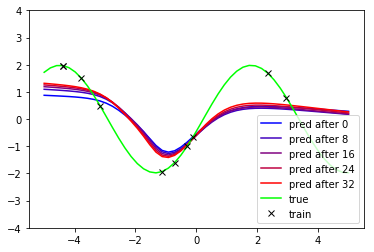

-----------------------------
iteration               2890
loss on plotted curve   1.098


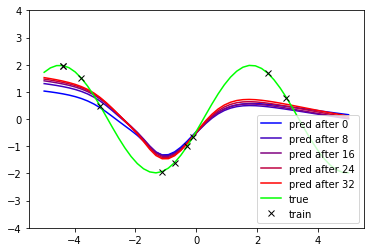

-----------------------------
iteration               2900
loss on plotted curve   0.878


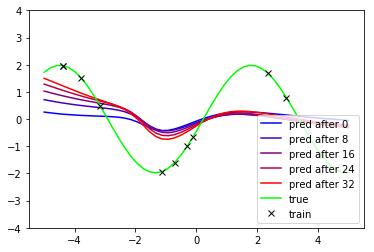

-----------------------------
iteration               2910
loss on plotted curve   1.192


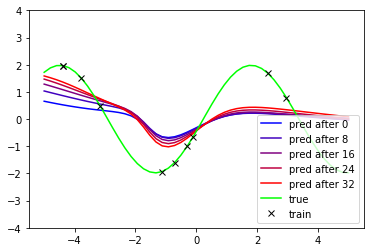

-----------------------------
iteration               2920
loss on plotted curve   1.174


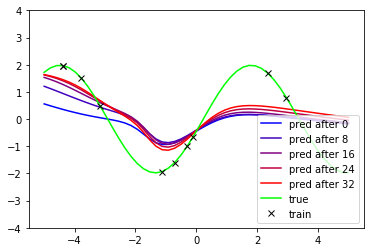

-----------------------------
iteration               2930
loss on plotted curve   1.033


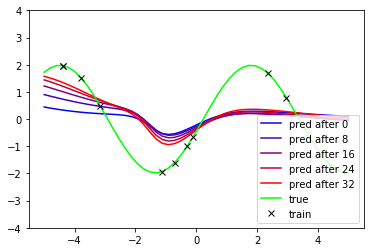

-----------------------------
iteration               2940
loss on plotted curve   1.221


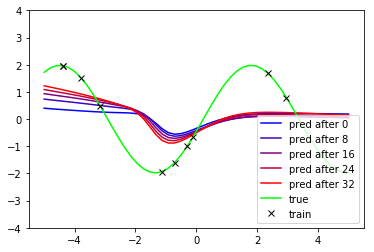

-----------------------------
iteration               2950
loss on plotted curve   1.466


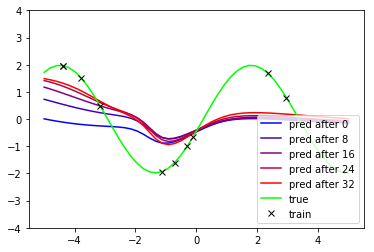

-----------------------------
iteration               2960
loss on plotted curve   1.244


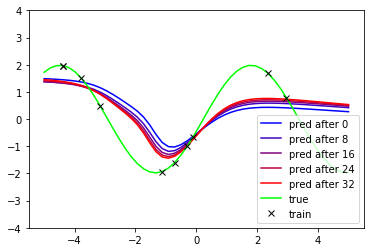

-----------------------------
iteration               2970
loss on plotted curve   1.205


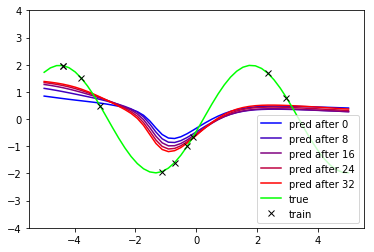

-----------------------------
iteration               2980
loss on plotted curve   1.309


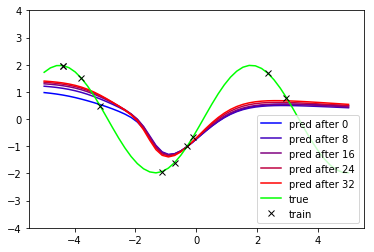

-----------------------------
iteration               2990
loss on plotted curve   1.305


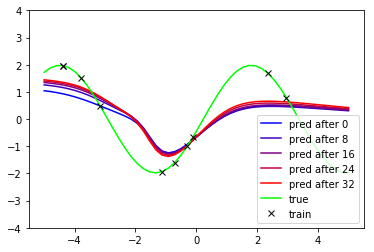

-----------------------------
iteration               3000
loss on plotted curve   1.205


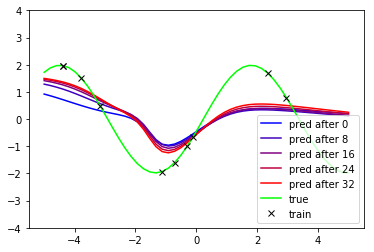

-----------------------------
iteration               3010
loss on plotted curve   1.156


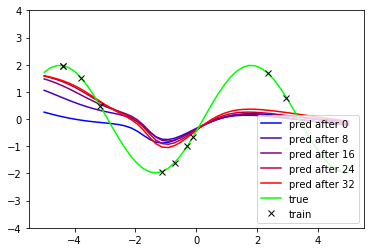

-----------------------------
iteration               3020
loss on plotted curve   1.070


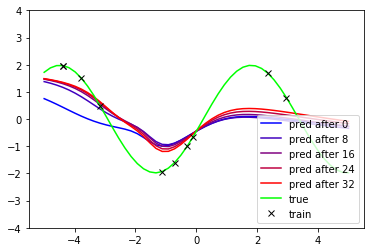

-----------------------------
iteration               3030
loss on plotted curve   0.974


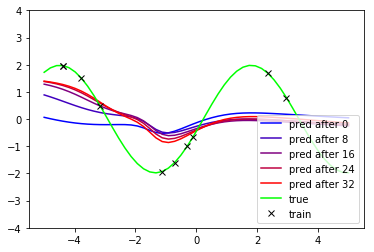

-----------------------------
iteration               3040
loss on plotted curve   1.268


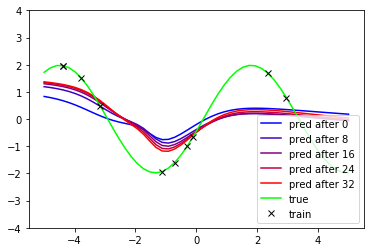

-----------------------------
iteration               3050
loss on plotted curve   1.079


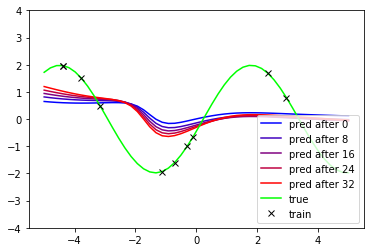

-----------------------------
iteration               3060
loss on plotted curve   1.503


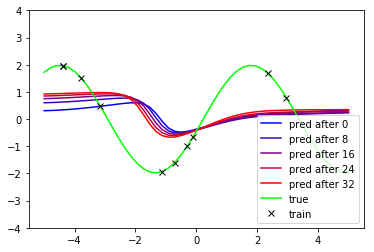

-----------------------------
iteration               3070
loss on plotted curve   1.758


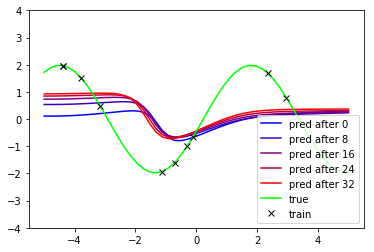

-----------------------------
iteration               3080
loss on plotted curve   1.763


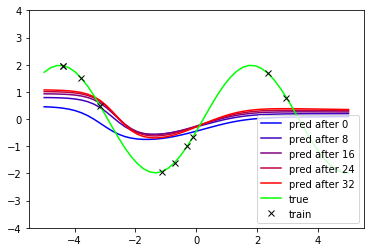

-----------------------------
iteration               3090
loss on plotted curve   1.319


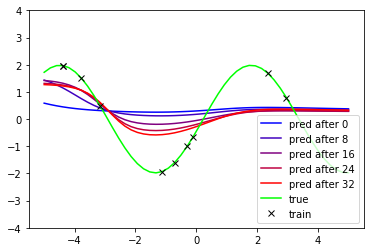

-----------------------------
iteration               3100
loss on plotted curve   1.316


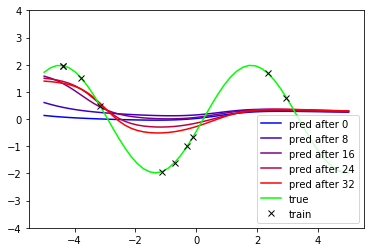

-----------------------------
iteration               3110
loss on plotted curve   1.318


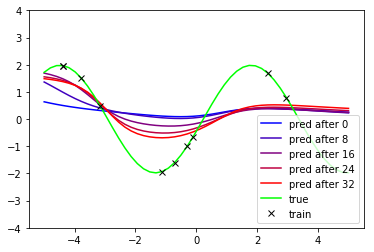

-----------------------------
iteration               3120
loss on plotted curve   1.237


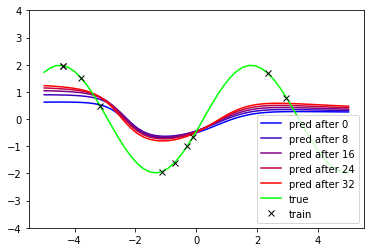

-----------------------------
iteration               3130
loss on plotted curve   1.298


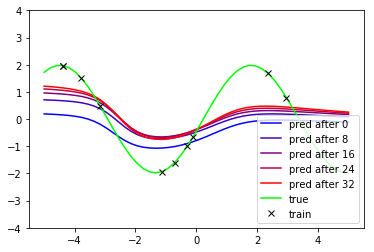

-----------------------------
iteration               3140
loss on plotted curve   1.206


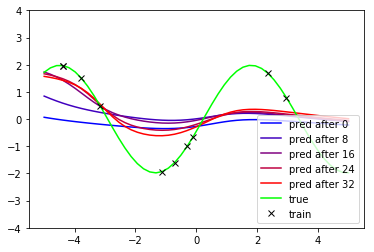

-----------------------------
iteration               3150
loss on plotted curve   1.114


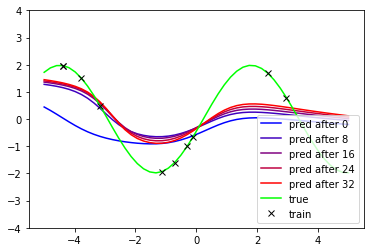

-----------------------------
iteration               3160
loss on plotted curve   0.985


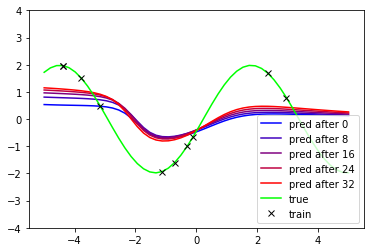

-----------------------------
iteration               3170
loss on plotted curve   1.299


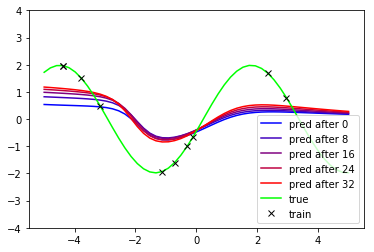

-----------------------------
iteration               3180
loss on plotted curve   1.277


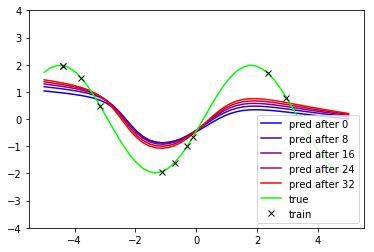

-----------------------------
iteration               3190
loss on plotted curve   0.959


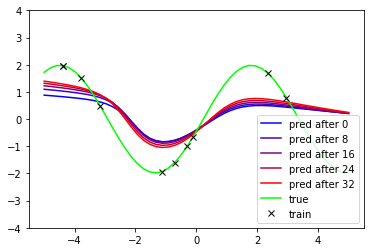

-----------------------------
iteration               3200
loss on plotted curve   1.031


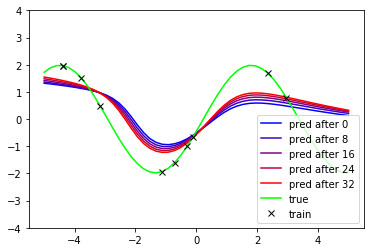

-----------------------------
iteration               3210
loss on plotted curve   0.980


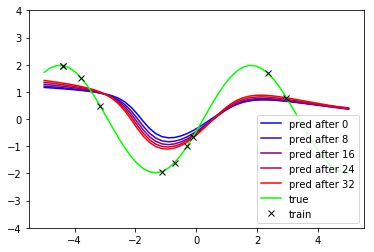

-----------------------------
iteration               3220
loss on plotted curve   1.158


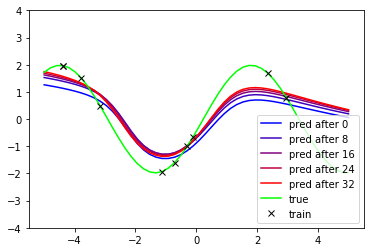

-----------------------------
iteration               3230
loss on plotted curve   0.874


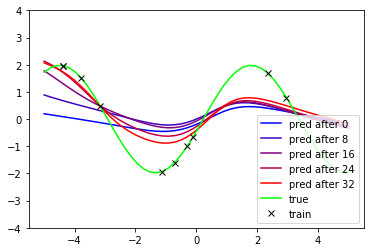

-----------------------------
iteration               3240
loss on plotted curve   0.784


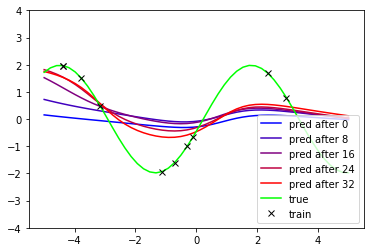

-----------------------------
iteration               3250
loss on plotted curve   1.111


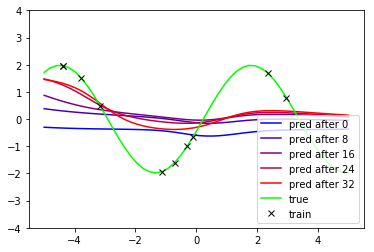

-----------------------------
iteration               3260
loss on plotted curve   1.383


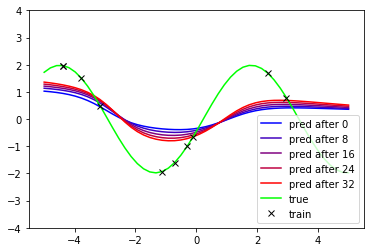

-----------------------------
iteration               3270
loss on plotted curve   1.335


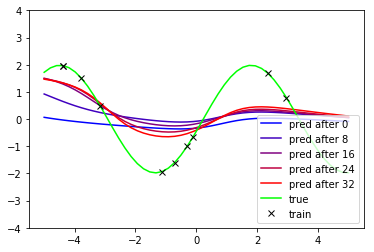

-----------------------------
iteration               3280
loss on plotted curve   1.156


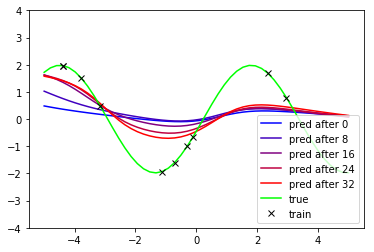

-----------------------------
iteration               3290
loss on plotted curve   1.111


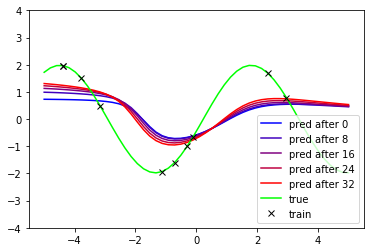

-----------------------------
iteration               3300
loss on plotted curve   1.453


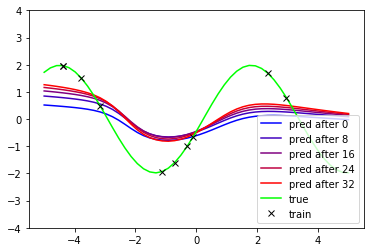

-----------------------------
iteration               3310
loss on plotted curve   1.195


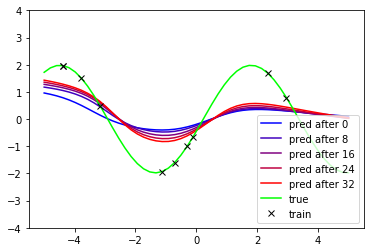

-----------------------------
iteration               3320
loss on plotted curve   1.012


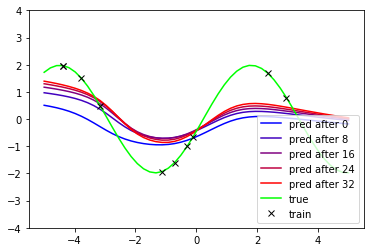

-----------------------------
iteration               3330
loss on plotted curve   1.013


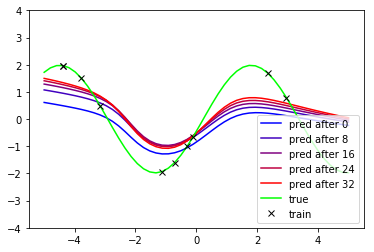

-----------------------------
iteration               3340
loss on plotted curve   0.920


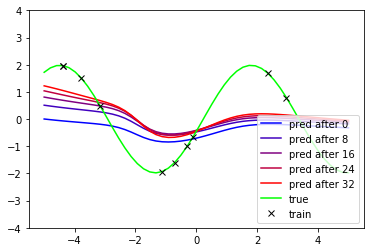

-----------------------------
iteration               3350
loss on plotted curve   1.381


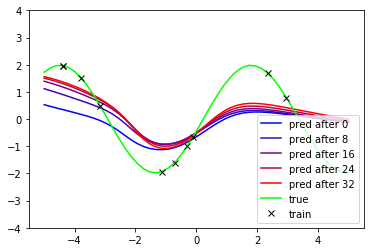

-----------------------------
iteration               3360
loss on plotted curve   0.962


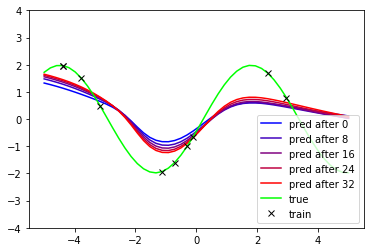

-----------------------------
iteration               3370
loss on plotted curve   0.904


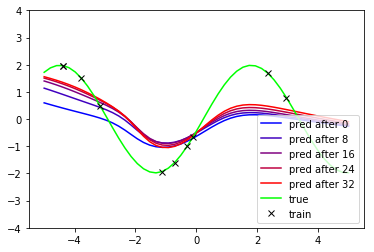

-----------------------------
iteration               3380
loss on plotted curve   0.973


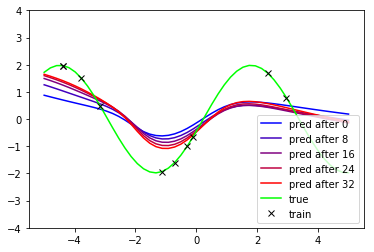

-----------------------------
iteration               3390
loss on plotted curve   0.895


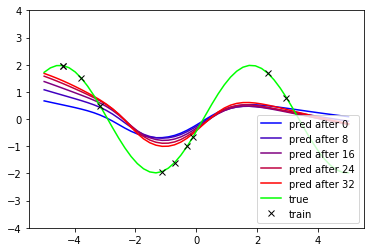

-----------------------------
iteration               3400
loss on plotted curve   0.873


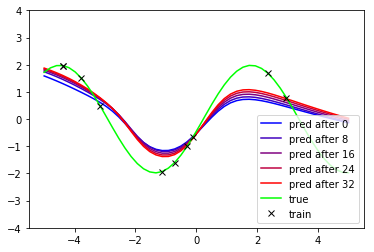

-----------------------------
iteration               3410
loss on plotted curve   0.728


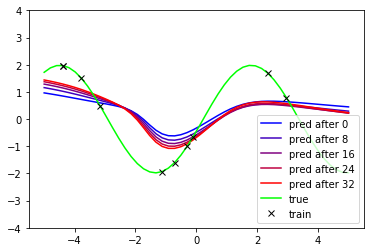

-----------------------------
iteration               3420
loss on plotted curve   1.231


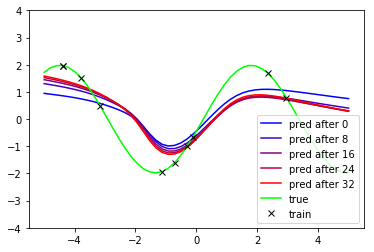

-----------------------------
iteration               3430
loss on plotted curve   1.109


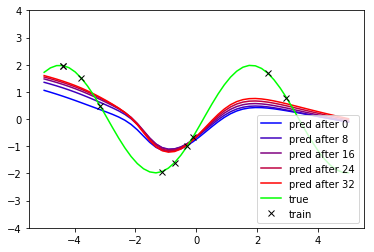

-----------------------------
iteration               3440
loss on plotted curve   0.975


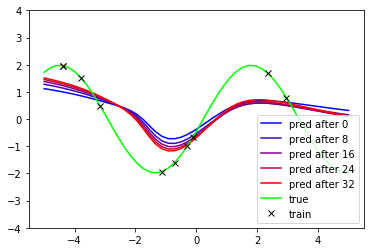

-----------------------------
iteration               3450
loss on plotted curve   1.103


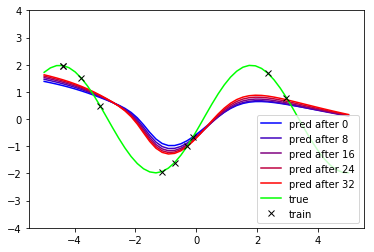

-----------------------------
iteration               3460
loss on plotted curve   1.026


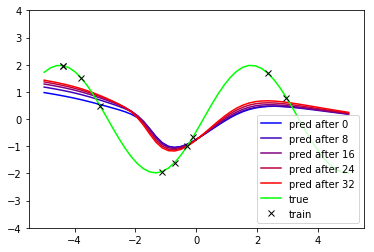

-----------------------------
iteration               3470
loss on plotted curve   1.274


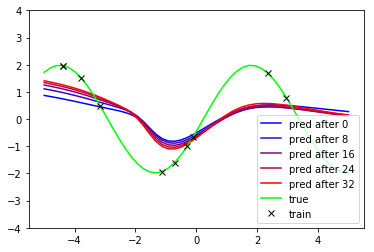

-----------------------------
iteration               3480
loss on plotted curve   1.233


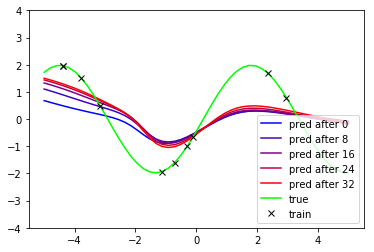

-----------------------------
iteration               3490
loss on plotted curve   1.047


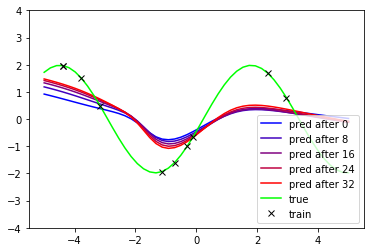

-----------------------------
iteration               3500
loss on plotted curve   1.064


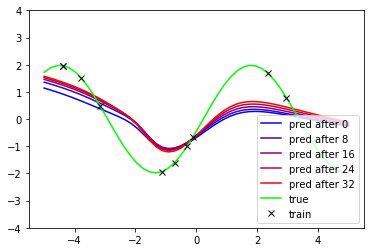

-----------------------------
iteration               3510
loss on plotted curve   0.950


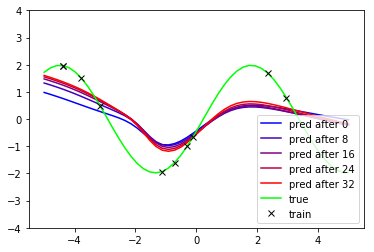

-----------------------------
iteration               3520
loss on plotted curve   0.914


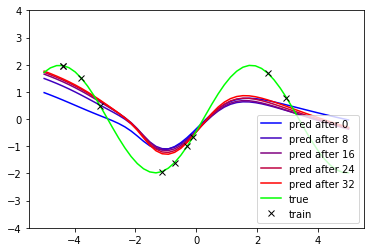

-----------------------------
iteration               3530
loss on plotted curve   0.716


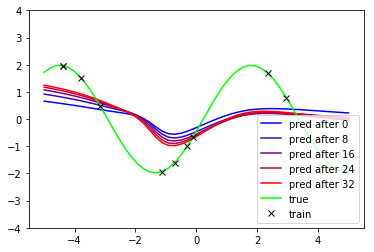

-----------------------------
iteration               3540
loss on plotted curve   1.326


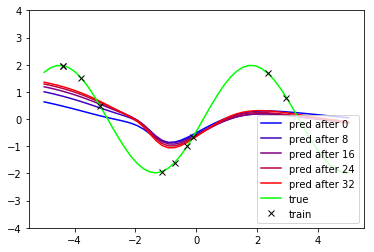

-----------------------------
iteration               3550
loss on plotted curve   1.194


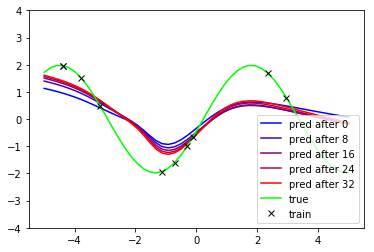

-----------------------------
iteration               3560
loss on plotted curve   0.869


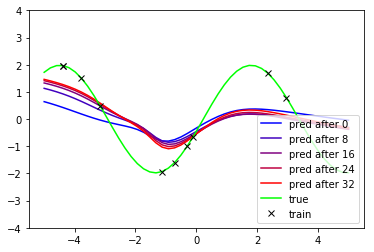

-----------------------------
iteration               3570
loss on plotted curve   1.008


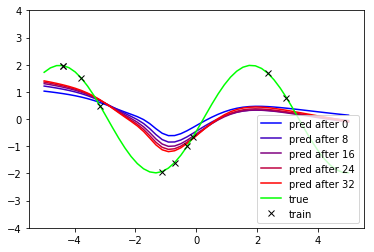

-----------------------------
iteration               3580
loss on plotted curve   1.051


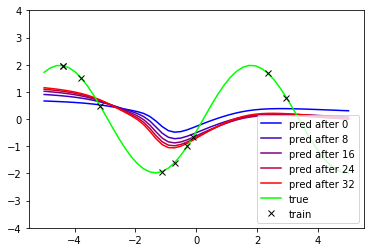

-----------------------------
iteration               3590
loss on plotted curve   1.385


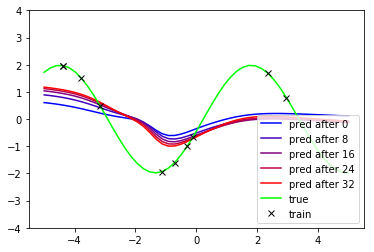

-----------------------------
iteration               3600
loss on plotted curve   1.358


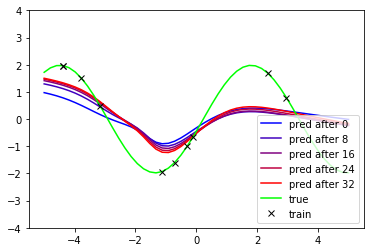

-----------------------------
iteration               3610
loss on plotted curve   0.928


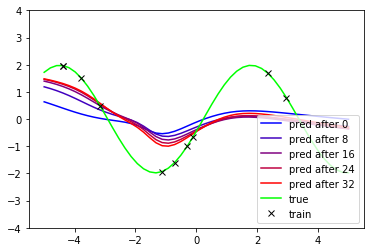

-----------------------------
iteration               3620
loss on plotted curve   1.069


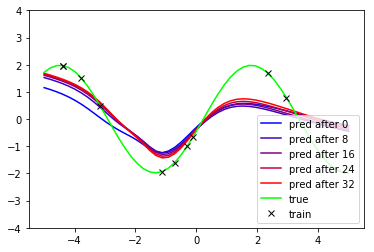

-----------------------------
iteration               3630
loss on plotted curve   0.663


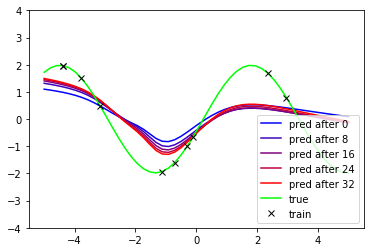

-----------------------------
iteration               3640
loss on plotted curve   0.903


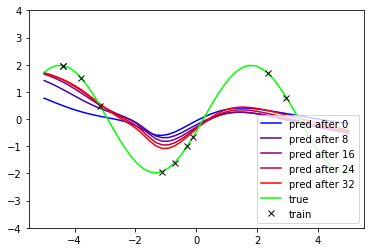

-----------------------------
iteration               3650
loss on plotted curve   0.866


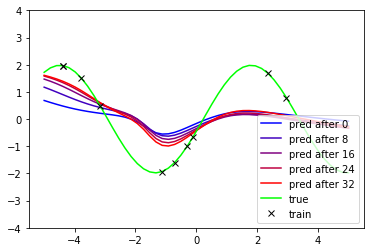

-----------------------------
iteration               3660
loss on plotted curve   1.047


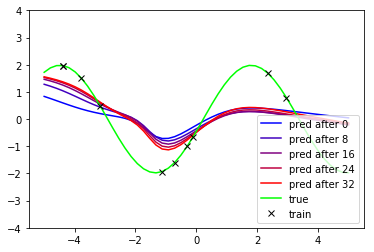

-----------------------------
iteration               3670
loss on plotted curve   1.006


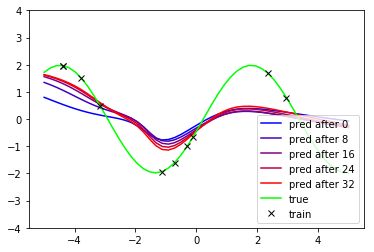

-----------------------------
iteration               3680
loss on plotted curve   0.936


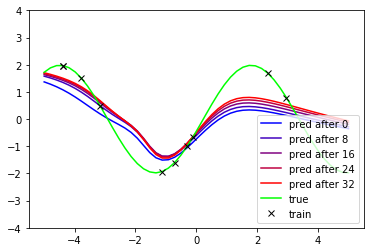

-----------------------------
iteration               3690
loss on plotted curve   0.785


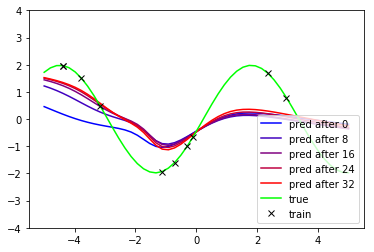

-----------------------------
iteration               3700
loss on plotted curve   0.981


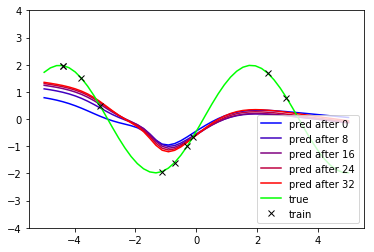

-----------------------------
iteration               3710
loss on plotted curve   1.083


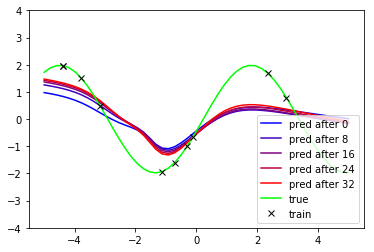

-----------------------------
iteration               3720
loss on plotted curve   0.928


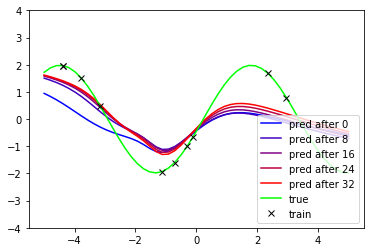

-----------------------------
iteration               3730
loss on plotted curve   0.713


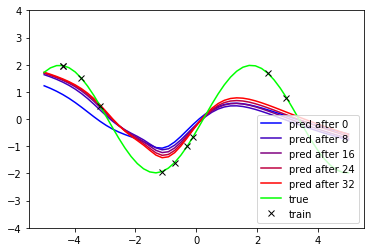

-----------------------------
iteration               3740
loss on plotted curve   0.568


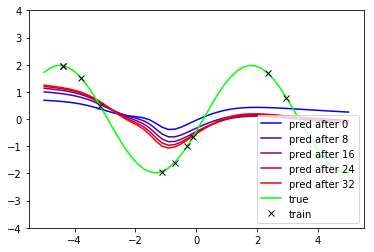

-----------------------------
iteration               3750
loss on plotted curve   1.183


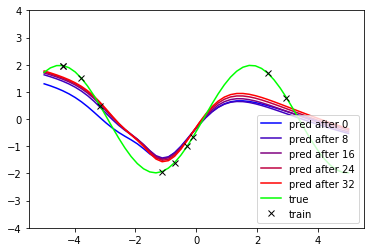

-----------------------------
iteration               3760
loss on plotted curve   0.558


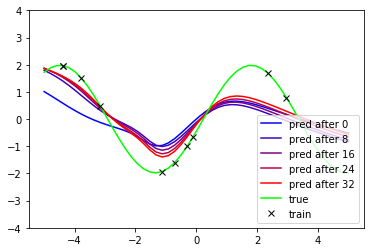

-----------------------------
iteration               3770
loss on plotted curve   0.556


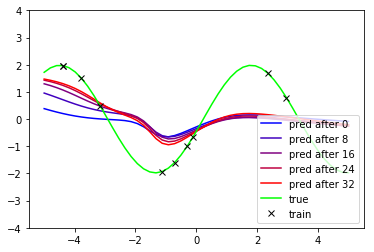

-----------------------------
iteration               3780
loss on plotted curve   1.180


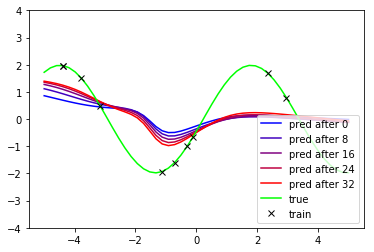

-----------------------------
iteration               3790
loss on plotted curve   1.257


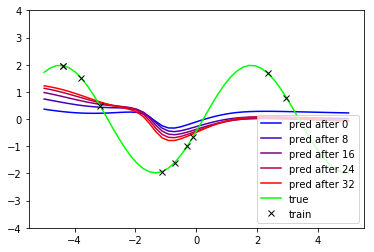

-----------------------------
iteration               3800
loss on plotted curve   1.503


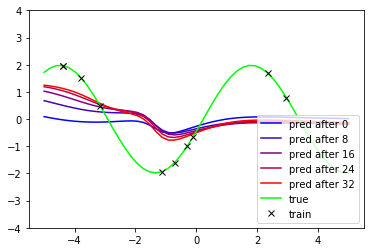

-----------------------------
iteration               3810
loss on plotted curve   1.498


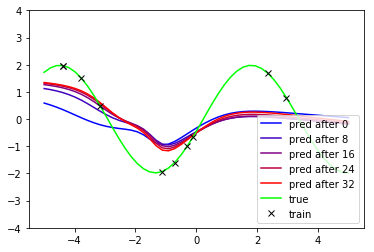

-----------------------------
iteration               3820
loss on plotted curve   1.090


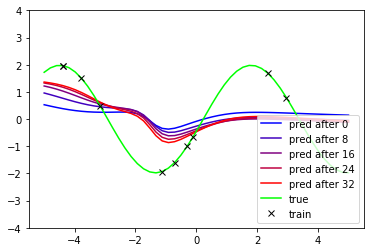

-----------------------------
iteration               3830
loss on plotted curve   1.376


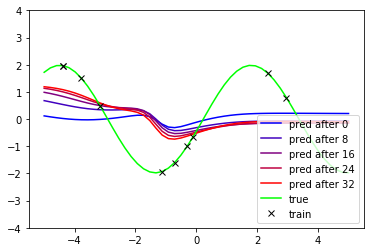

-----------------------------
iteration               3840
loss on plotted curve   1.623


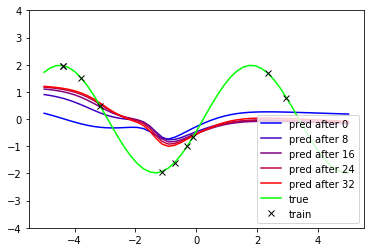

-----------------------------
iteration               3850
loss on plotted curve   1.343


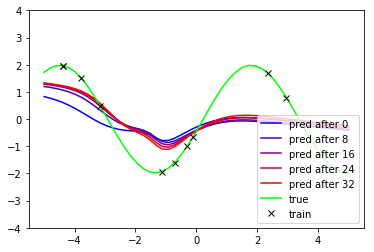

-----------------------------
iteration               3860
loss on plotted curve   1.068


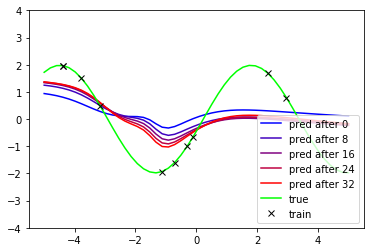

-----------------------------
iteration               3870
loss on plotted curve   1.150


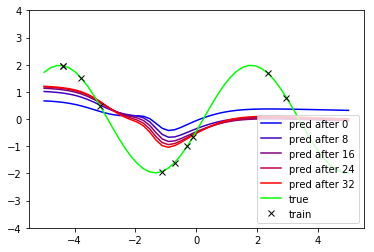

-----------------------------
iteration               3880
loss on plotted curve   1.323


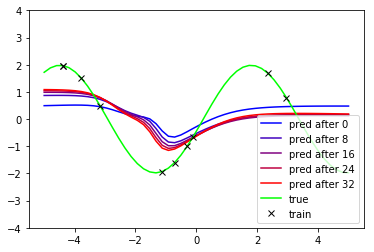

-----------------------------
iteration               3890
loss on plotted curve   1.413


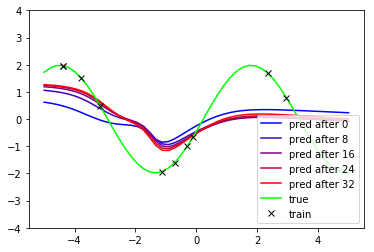

-----------------------------
iteration               3900
loss on plotted curve   1.201


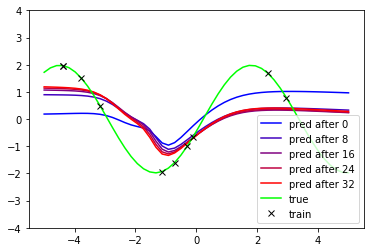

-----------------------------
iteration               3910
loss on plotted curve   1.266


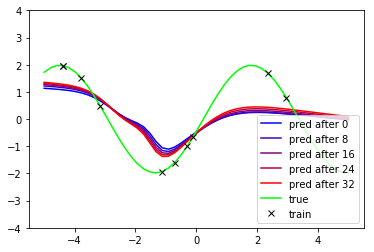

-----------------------------
iteration               3920
loss on plotted curve   1.043


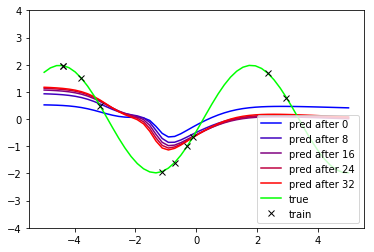

-----------------------------
iteration               3930
loss on plotted curve   1.350


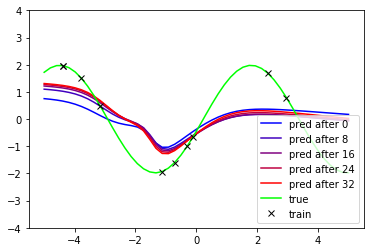

-----------------------------
iteration               3940
loss on plotted curve   1.123


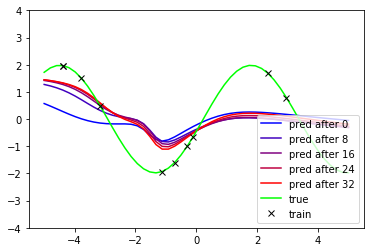

-----------------------------
iteration               3950
loss on plotted curve   1.099


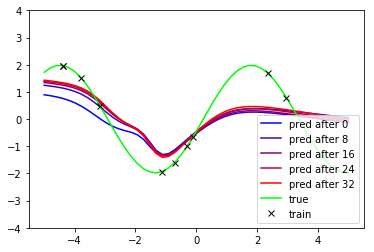

-----------------------------
iteration               3960
loss on plotted curve   0.957


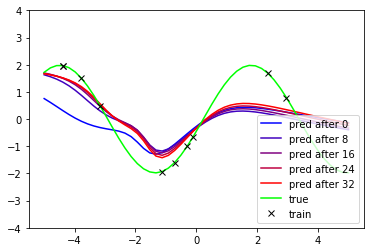

-----------------------------
iteration               3970
loss on plotted curve   0.797


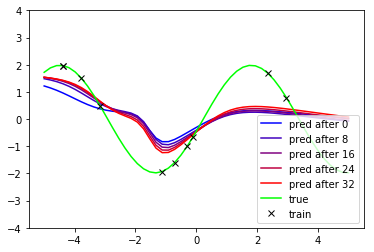

-----------------------------
iteration               3980
loss on plotted curve   1.074


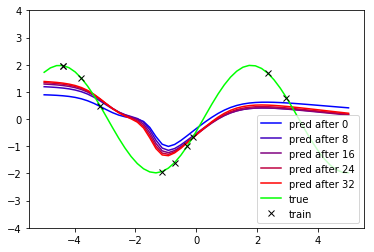

-----------------------------
iteration               3990
loss on plotted curve   1.137


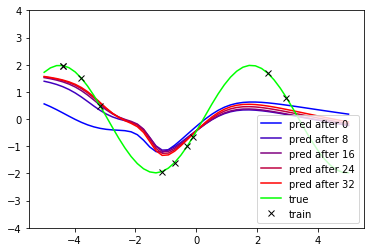

-----------------------------
iteration               4000
loss on plotted curve   0.903


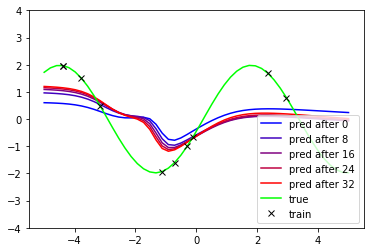

-----------------------------
iteration               4010
loss on plotted curve   1.298


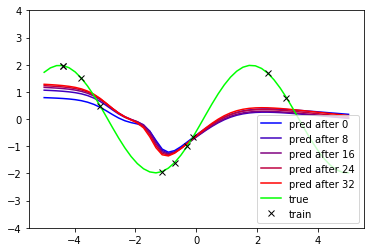

-----------------------------
iteration               4020
loss on plotted curve   1.156


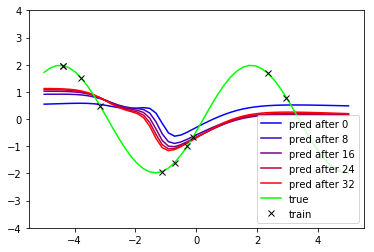

-----------------------------
iteration               4030
loss on plotted curve   1.487


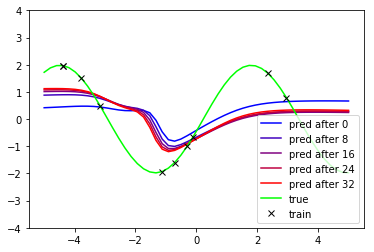

-----------------------------
iteration               4040
loss on plotted curve   1.550


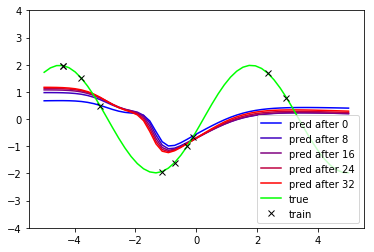

-----------------------------
iteration               4050
loss on plotted curve   1.452


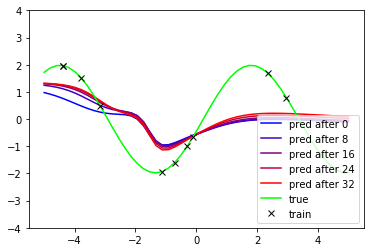

-----------------------------
iteration               4060
loss on plotted curve   1.307


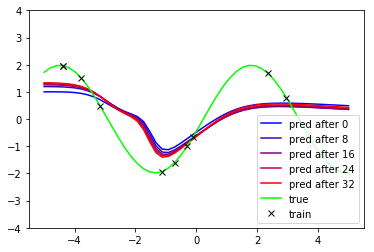

-----------------------------
iteration               4070
loss on plotted curve   1.262


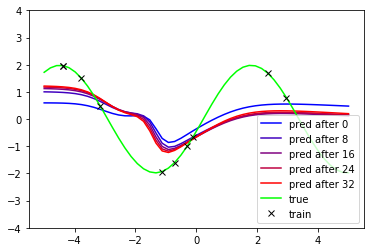

-----------------------------
iteration               4080
loss on plotted curve   1.375


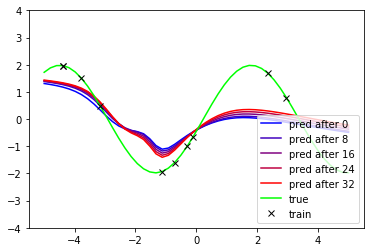

-----------------------------
iteration               4090
loss on plotted curve   0.885


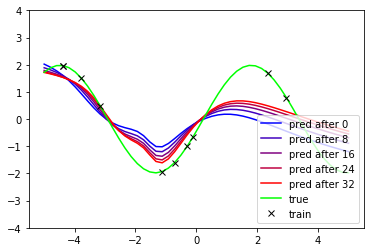

-----------------------------
iteration               4100
loss on plotted curve   0.597


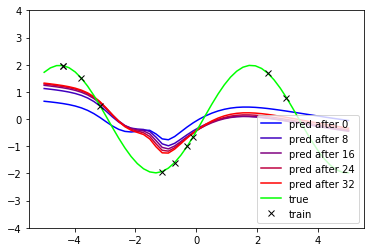

-----------------------------
iteration               4110
loss on plotted curve   0.981


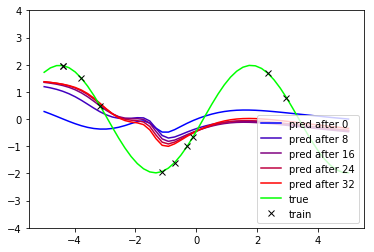

-----------------------------
iteration               4120
loss on plotted curve   1.222


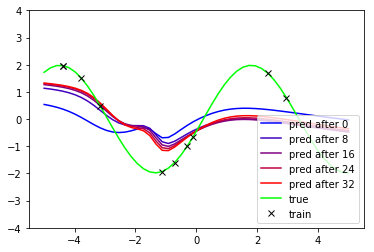

-----------------------------
iteration               4130
loss on plotted curve   1.075


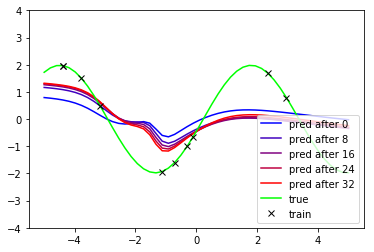

-----------------------------
iteration               4140
loss on plotted curve   1.107


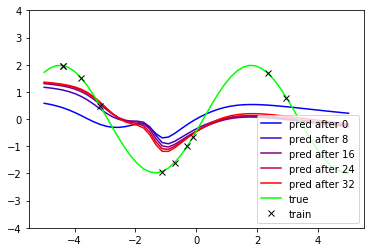

-----------------------------
iteration               4150
loss on plotted curve   1.105


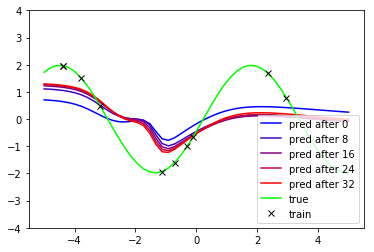

-----------------------------
iteration               4160
loss on plotted curve   1.190


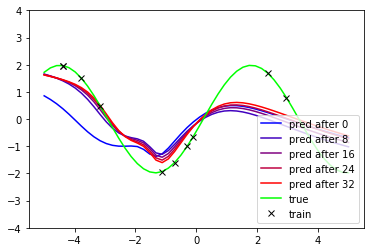

-----------------------------
iteration               4170
loss on plotted curve   0.596


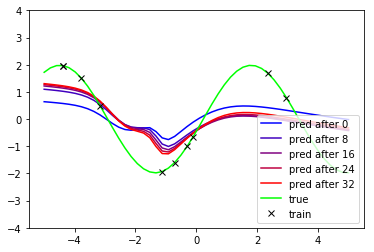

-----------------------------
iteration               4180
loss on plotted curve   0.990


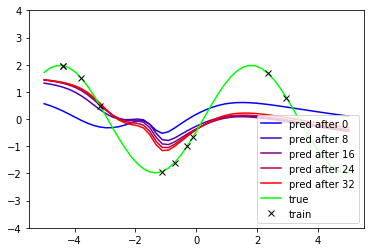

-----------------------------
iteration               4190
loss on plotted curve   1.035


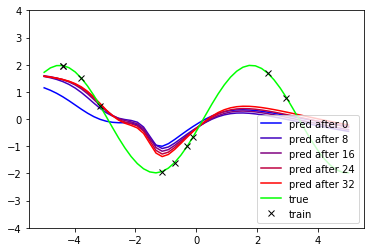

-----------------------------
iteration               4200
loss on plotted curve   0.868


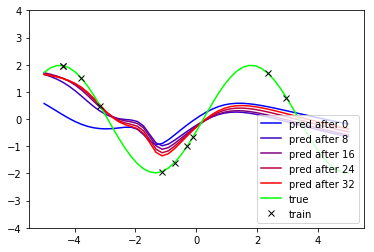

-----------------------------
iteration               4210
loss on plotted curve   0.805


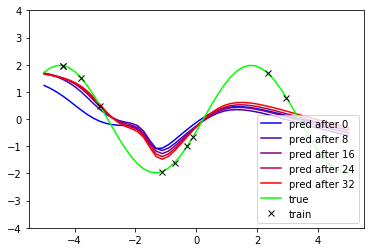

-----------------------------
iteration               4220
loss on plotted curve   0.734


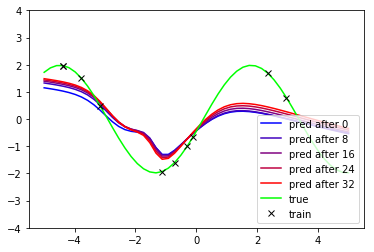

-----------------------------
iteration               4230
loss on plotted curve   0.762


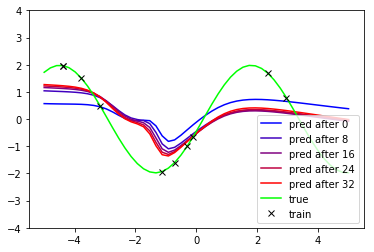

-----------------------------
iteration               4240
loss on plotted curve   1.086


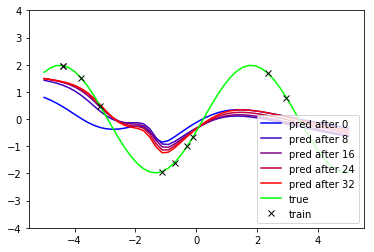

-----------------------------
iteration               4250
loss on plotted curve   0.905


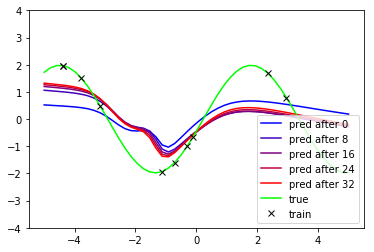

-----------------------------
iteration               4260
loss on plotted curve   0.942


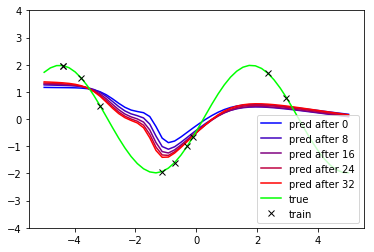

-----------------------------
iteration               4270
loss on plotted curve   1.072


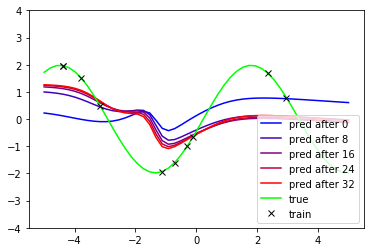

-----------------------------
iteration               4280
loss on plotted curve   1.366


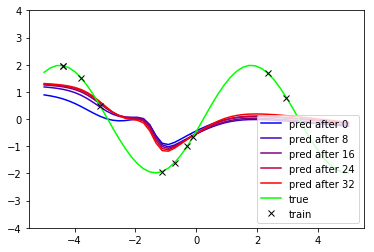

-----------------------------
iteration               4290
loss on plotted curve   1.198


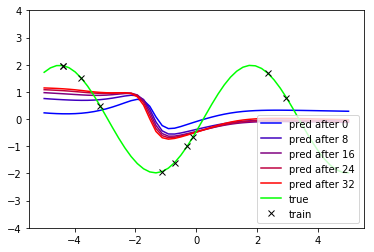

-----------------------------
iteration               4300
loss on plotted curve   1.809


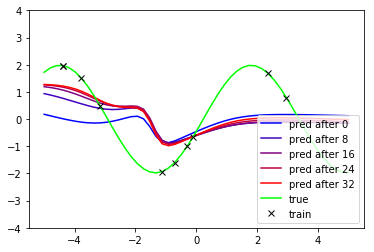

-----------------------------
iteration               4310
loss on plotted curve   1.549


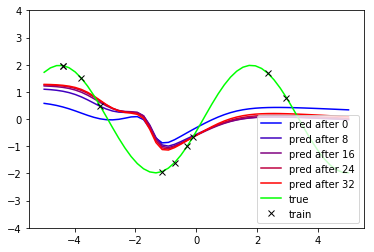

-----------------------------
iteration               4320
loss on plotted curve   1.365


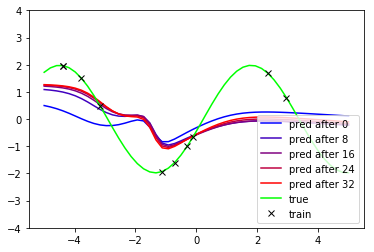

-----------------------------
iteration               4330
loss on plotted curve   1.338


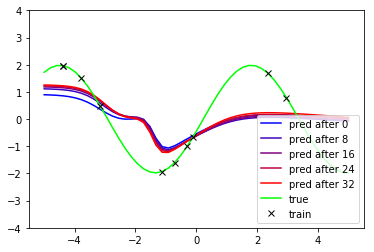

-----------------------------
iteration               4340
loss on plotted curve   1.273


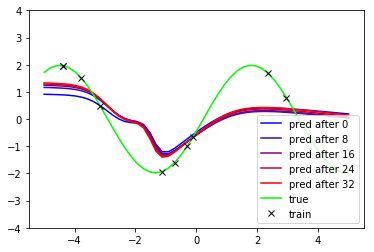

-----------------------------
iteration               4350
loss on plotted curve   1.124


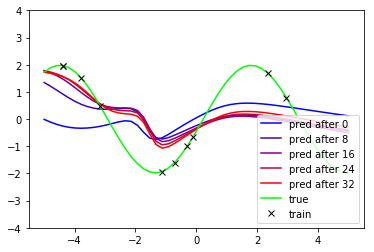

-----------------------------
iteration               4360
loss on plotted curve   1.089


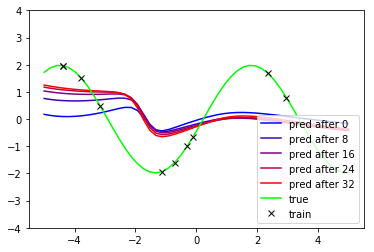

-----------------------------
iteration               4370
loss on plotted curve   1.493


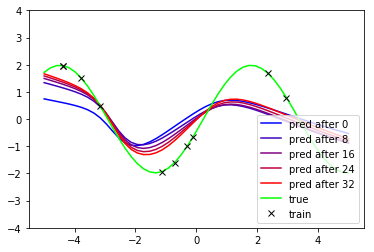

-----------------------------
iteration               4380
loss on plotted curve   0.561


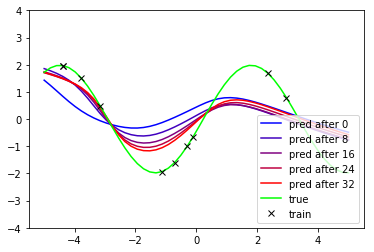

-----------------------------
iteration               4390
loss on plotted curve   0.608


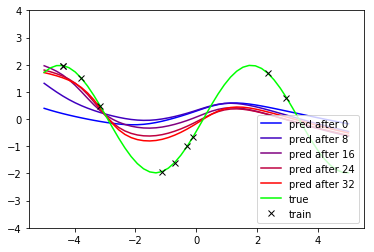

-----------------------------
iteration               4400
loss on plotted curve   0.827


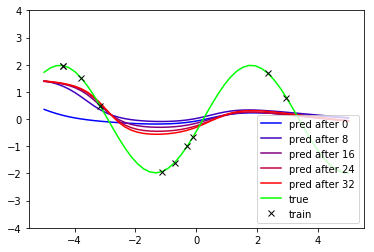

-----------------------------
iteration               4410
loss on plotted curve   1.139


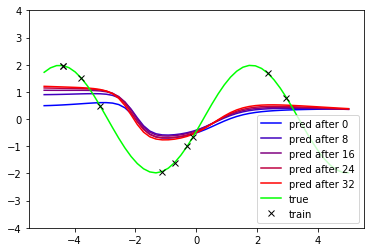

-----------------------------
iteration               4420
loss on plotted curve   1.415


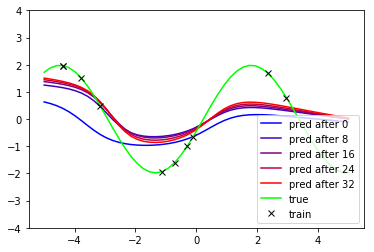

-----------------------------
iteration               4430
loss on plotted curve   0.924


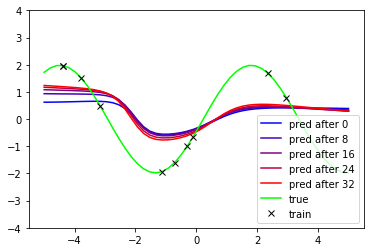

-----------------------------
iteration               4440
loss on plotted curve   1.306


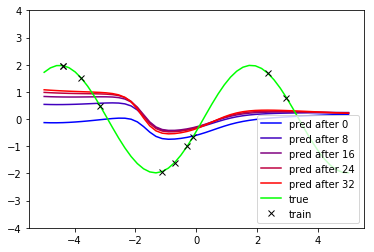

-----------------------------
iteration               4450
loss on plotted curve   1.626


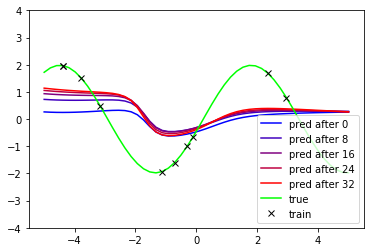

-----------------------------
iteration               4460
loss on plotted curve   1.618


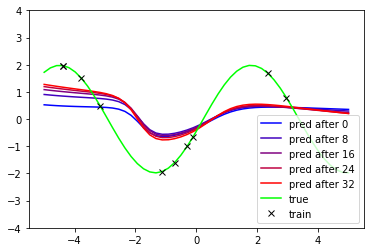

-----------------------------
iteration               4470
loss on plotted curve   1.323


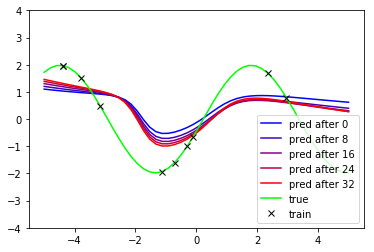

-----------------------------
iteration               4480
loss on plotted curve   1.221


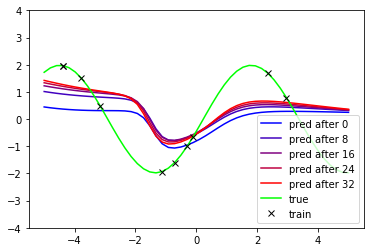

-----------------------------
iteration               4490
loss on plotted curve   1.519


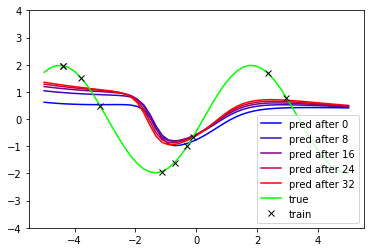

-----------------------------
iteration               4500
loss on plotted curve   1.636


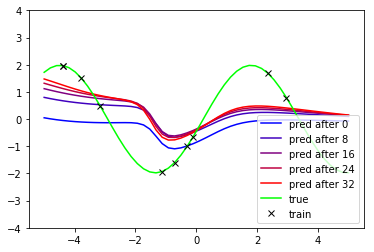

-----------------------------
iteration               4510
loss on plotted curve   1.480


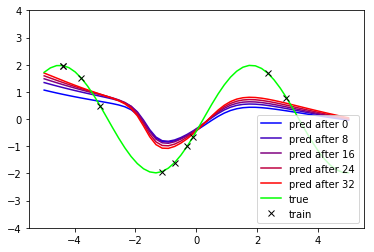

-----------------------------
iteration               4520
loss on plotted curve   1.080


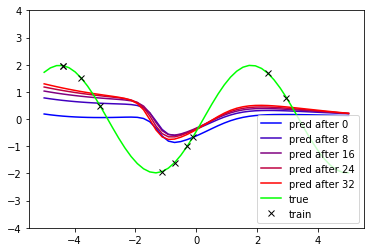

-----------------------------
iteration               4530
loss on plotted curve   1.543


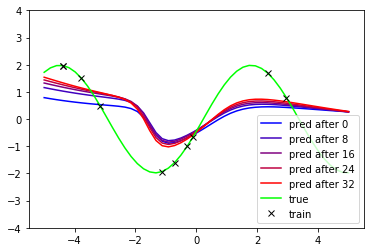

-----------------------------
iteration               4540
loss on plotted curve   1.339


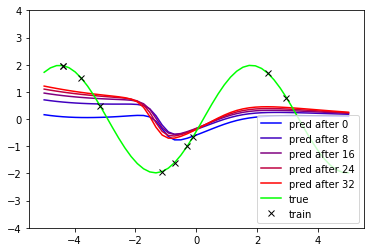

-----------------------------
iteration               4550
loss on plotted curve   1.646


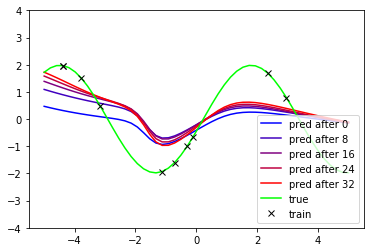

-----------------------------
iteration               4560
loss on plotted curve   1.063


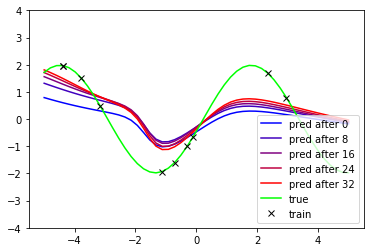

-----------------------------
iteration               4570
loss on plotted curve   0.995


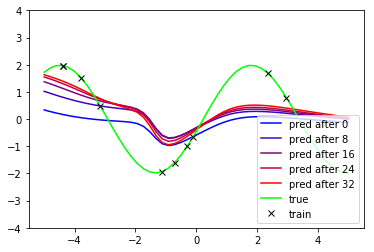

-----------------------------
iteration               4580
loss on plotted curve   1.245


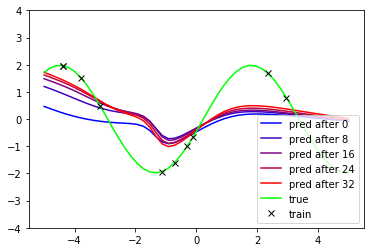

-----------------------------
iteration               4590
loss on plotted curve   1.153


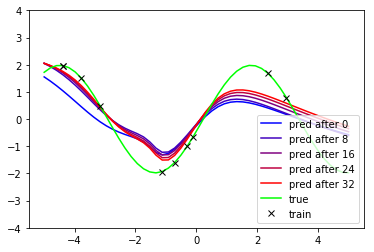

-----------------------------
iteration               4600
loss on plotted curve   0.564


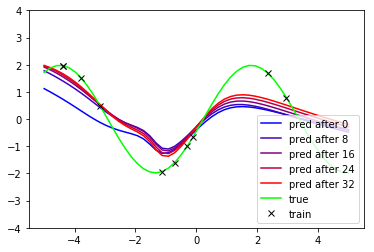

-----------------------------
iteration               4610
loss on plotted curve   0.698


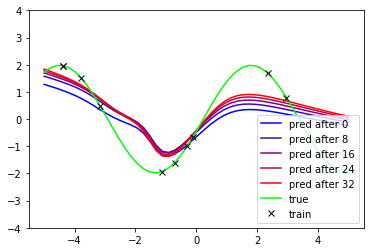

-----------------------------
iteration               4620
loss on plotted curve   0.895


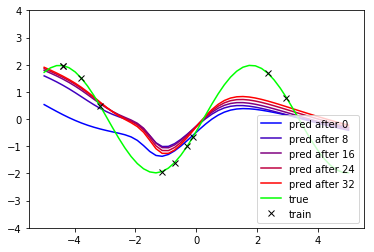

-----------------------------
iteration               4630
loss on plotted curve   0.766


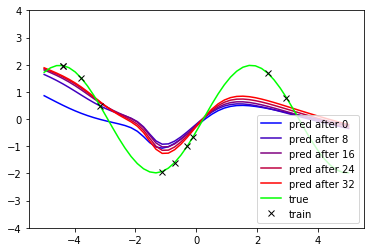

-----------------------------
iteration               4640
loss on plotted curve   0.773


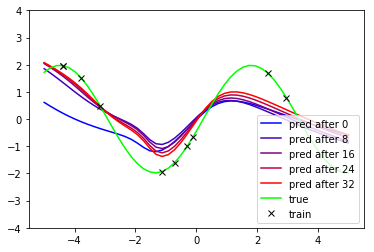

-----------------------------
iteration               4650
loss on plotted curve   0.544


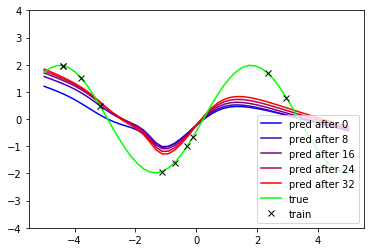

-----------------------------
iteration               4660
loss on plotted curve   0.727


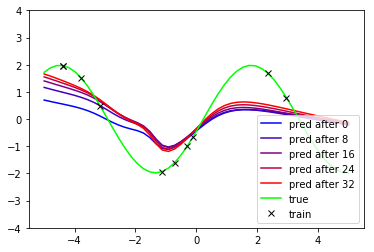

-----------------------------
iteration               4670
loss on plotted curve   0.925


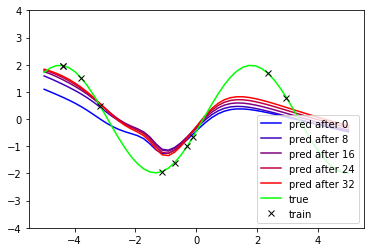

-----------------------------
iteration               4680
loss on plotted curve   0.707


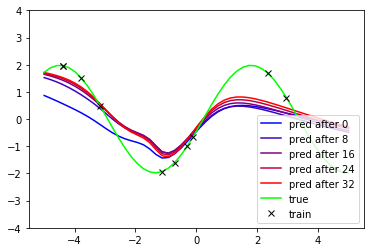

-----------------------------
iteration               4690
loss on plotted curve   0.674


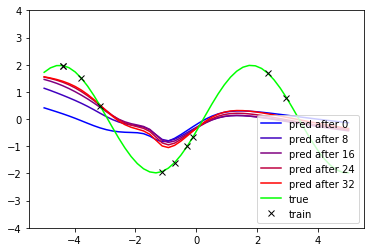

-----------------------------
iteration               4700
loss on plotted curve   0.971


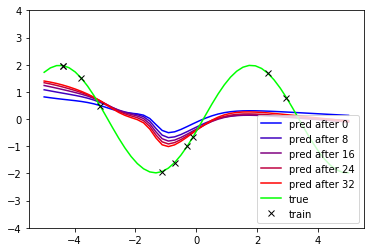

-----------------------------
iteration               4710
loss on plotted curve   1.206


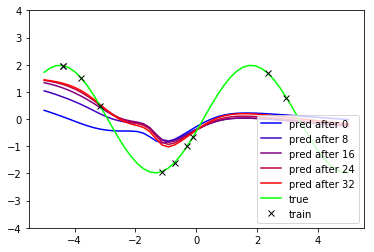

-----------------------------
iteration               4720
loss on plotted curve   1.125


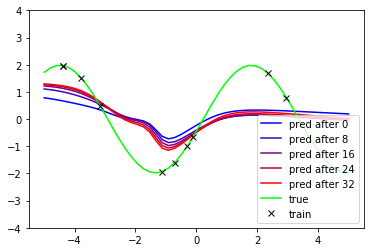

-----------------------------
iteration               4730
loss on plotted curve   1.175


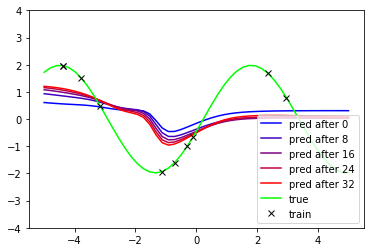

-----------------------------
iteration               4740
loss on plotted curve   1.450


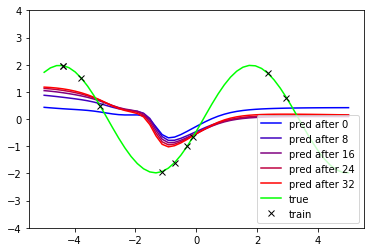

-----------------------------
iteration               4750
loss on plotted curve   1.469


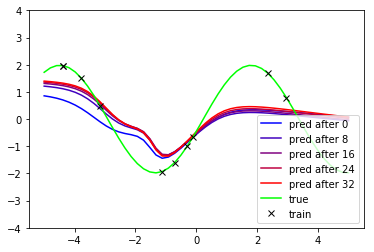

-----------------------------
iteration               4760
loss on plotted curve   0.998


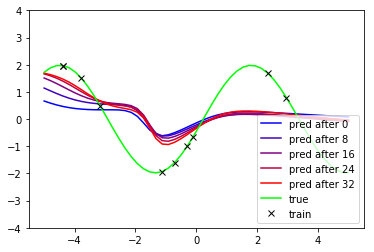

-----------------------------
iteration               4770
loss on plotted curve   1.255


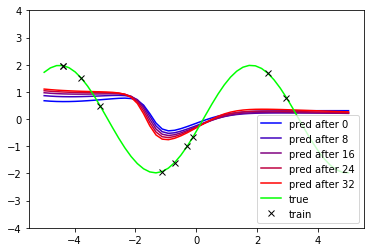

-----------------------------
iteration               4780
loss on plotted curve   1.628


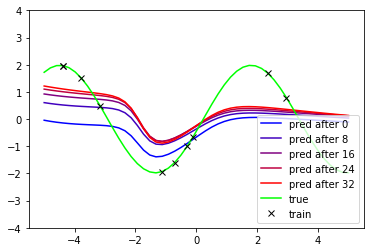

-----------------------------
iteration               4790
loss on plotted curve   1.302


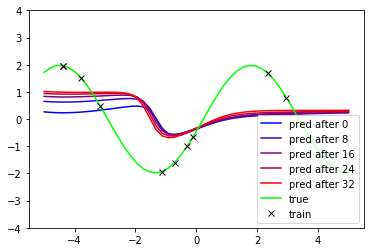

-----------------------------
iteration               4800
loss on plotted curve   1.800


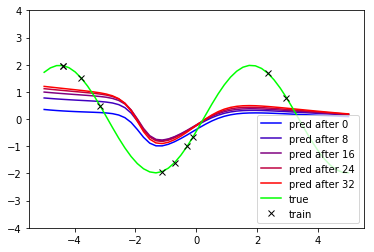

-----------------------------
iteration               4810
loss on plotted curve   1.277


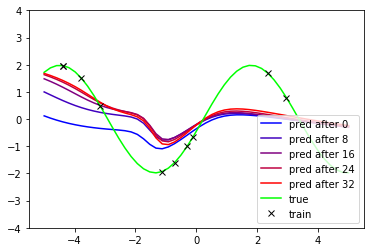

-----------------------------
iteration               4820
loss on plotted curve   1.113


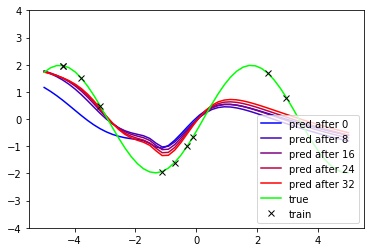

-----------------------------
iteration               4830
loss on plotted curve   0.634


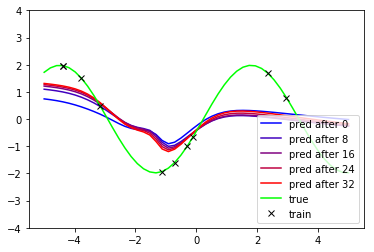

-----------------------------
iteration               4840
loss on plotted curve   1.033


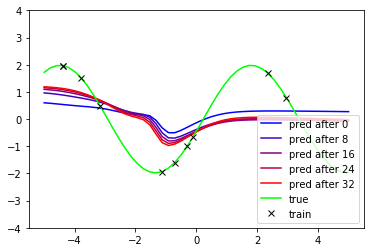

-----------------------------
iteration               4850
loss on plotted curve   1.407


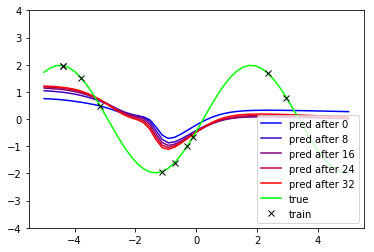

-----------------------------
iteration               4860
loss on plotted curve   1.309


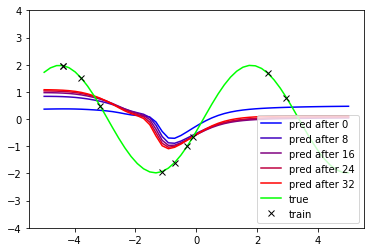

-----------------------------
iteration               4870
loss on plotted curve   1.489


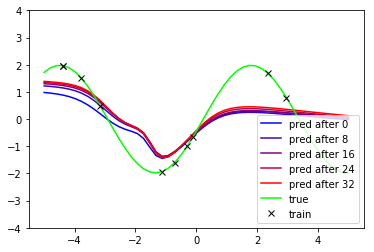

-----------------------------
iteration               4880
loss on plotted curve   1.009


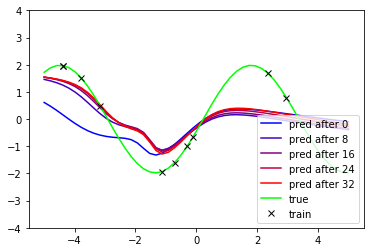

-----------------------------
iteration               4890
loss on plotted curve   0.900


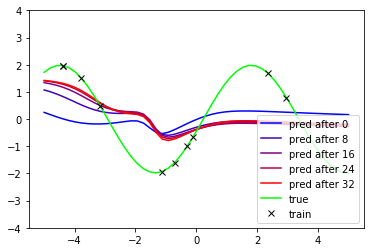

-----------------------------
iteration               4900
loss on plotted curve   1.441


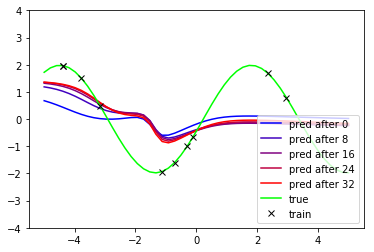

-----------------------------
iteration               4910
loss on plotted curve   1.413


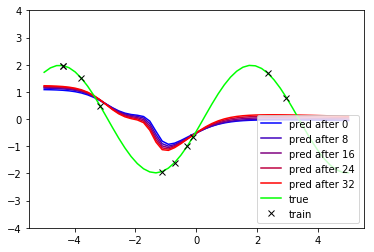

-----------------------------
iteration               4920
loss on plotted curve   1.315


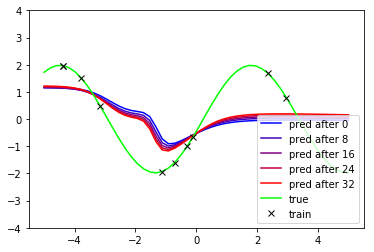

-----------------------------
iteration               4930
loss on plotted curve   1.347


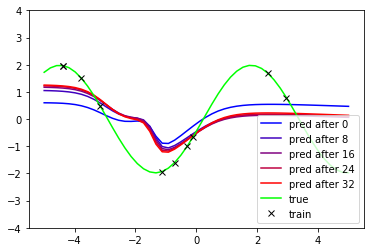

-----------------------------
iteration               4940
loss on plotted curve   1.277


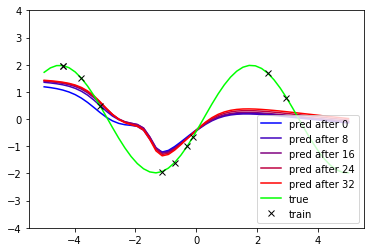

-----------------------------
iteration               4950
loss on plotted curve   1.024


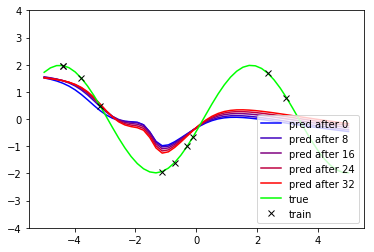

-----------------------------
iteration               4960
loss on plotted curve   0.970


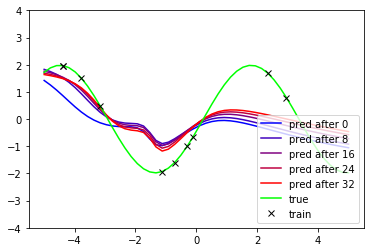

-----------------------------
iteration               4970
loss on plotted curve   0.885


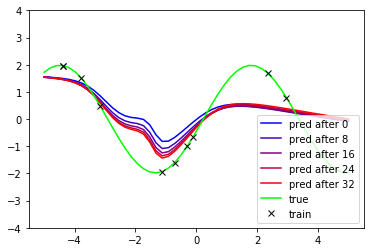

-----------------------------
iteration               4980
loss on plotted curve   0.877


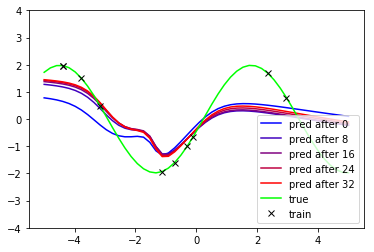

-----------------------------
iteration               4990
loss on plotted curve   0.899


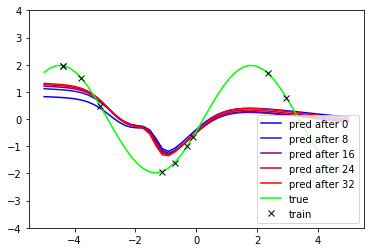

-----------------------------
iteration               5000
loss on plotted curve   1.041


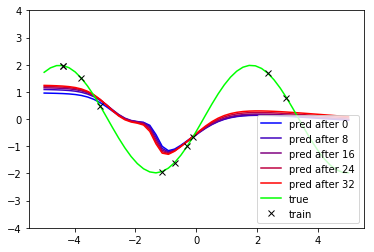

-----------------------------
iteration               5010
loss on plotted curve   1.184


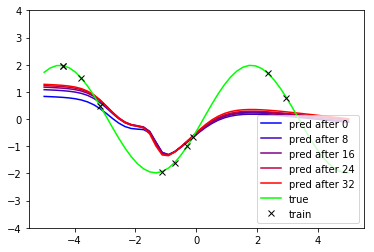

-----------------------------
iteration               5020
loss on plotted curve   1.078


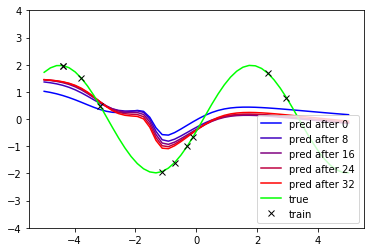

-----------------------------
iteration               5030
loss on plotted curve   1.207


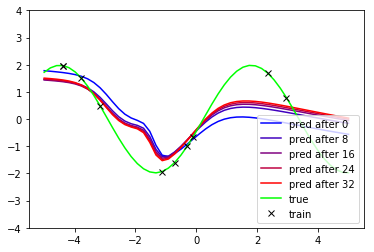

-----------------------------
iteration               5040
loss on plotted curve   0.870


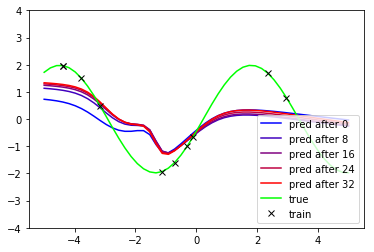

-----------------------------
iteration               5050
loss on plotted curve   1.048


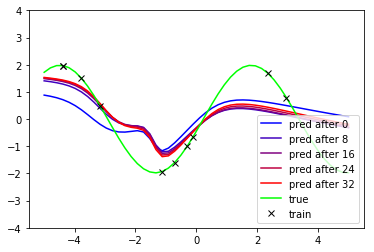

-----------------------------
iteration               5060
loss on plotted curve   0.850


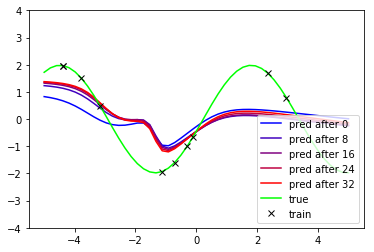

-----------------------------
iteration               5070
loss on plotted curve   1.110


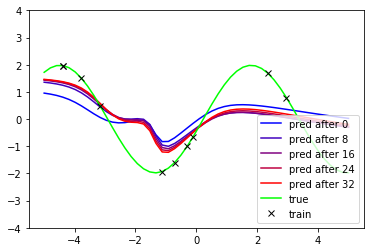

-----------------------------
iteration               5080
loss on plotted curve   1.015


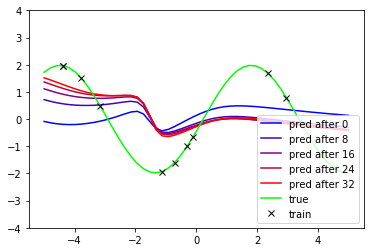

-----------------------------
iteration               5090
loss on plotted curve   1.625


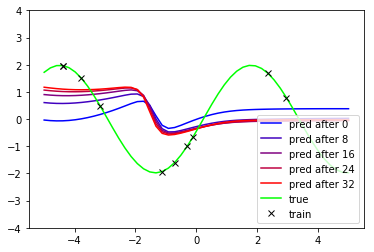

-----------------------------
iteration               5100
loss on plotted curve   2.002


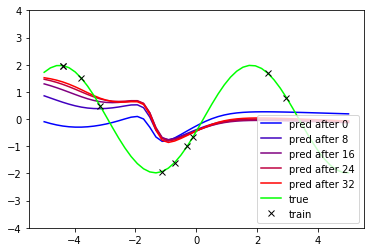

-----------------------------
iteration               5110
loss on plotted curve   1.604


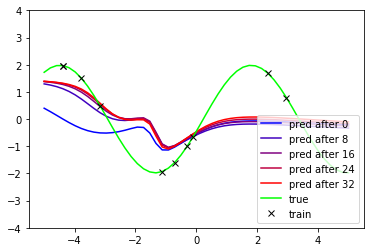

-----------------------------
iteration               5120
loss on plotted curve   1.283


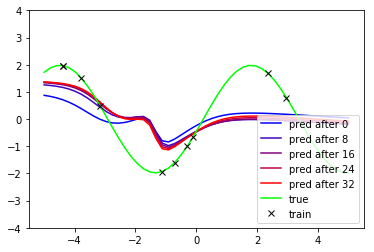

-----------------------------
iteration               5130
loss on plotted curve   1.268


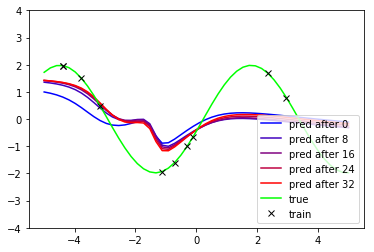

-----------------------------
iteration               5140
loss on plotted curve   1.143


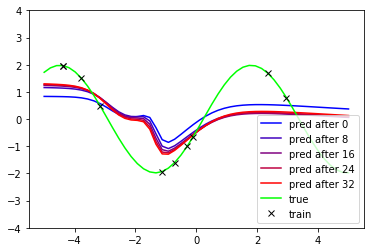

-----------------------------
iteration               5150
loss on plotted curve   1.229


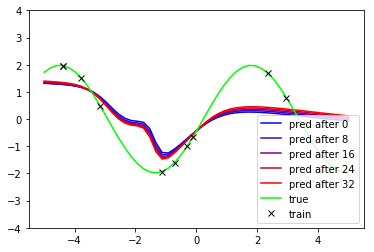

-----------------------------
iteration               5160
loss on plotted curve   1.035


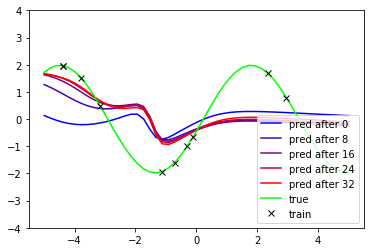

-----------------------------
iteration               5170
loss on plotted curve   1.429


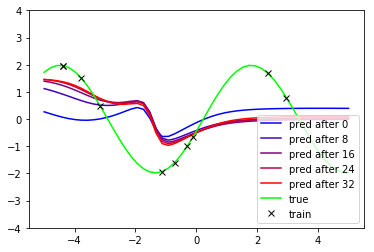

-----------------------------
iteration               5180
loss on plotted curve   1.617


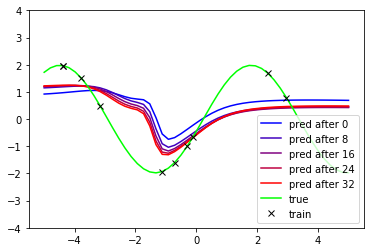

-----------------------------
iteration               5190
loss on plotted curve   1.514


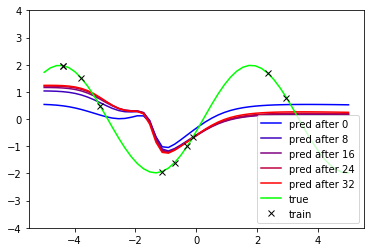

-----------------------------
iteration               5200
loss on plotted curve   1.448


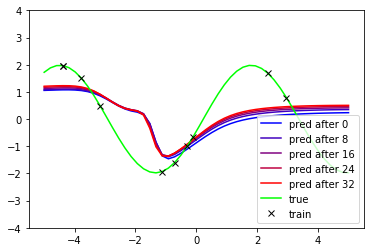

-----------------------------
iteration               5210
loss on plotted curve   1.509


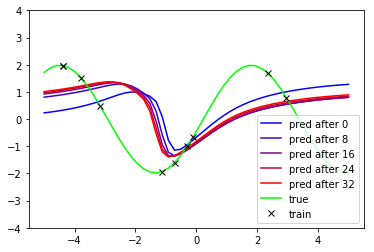

-----------------------------
iteration               5220
loss on plotted curve   2.222


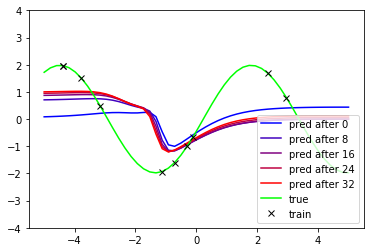

-----------------------------
iteration               5230
loss on plotted curve   1.704


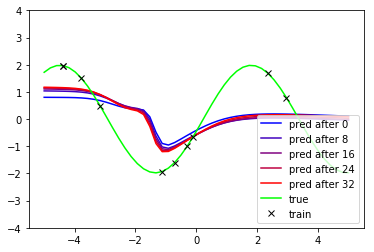

-----------------------------
iteration               5240
loss on plotted curve   1.458


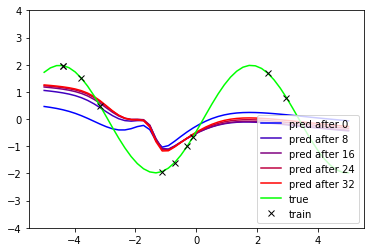

-----------------------------
iteration               5250
loss on plotted curve   1.256


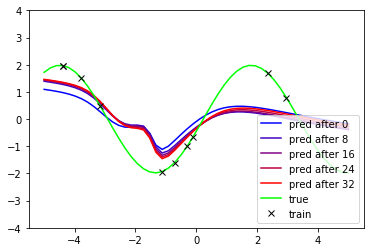

-----------------------------
iteration               5260
loss on plotted curve   0.909


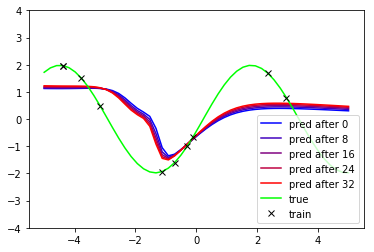

-----------------------------
iteration               5270
loss on plotted curve   1.445


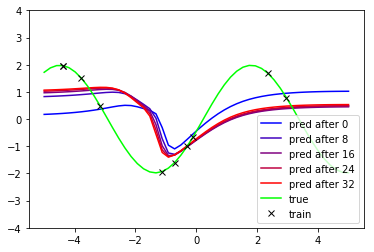

-----------------------------
iteration               5280
loss on plotted curve   1.830


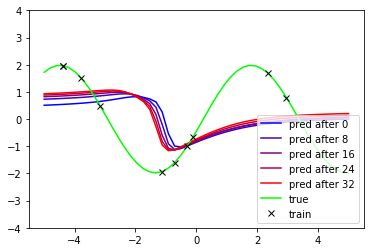

-----------------------------
iteration               5290
loss on plotted curve   2.005


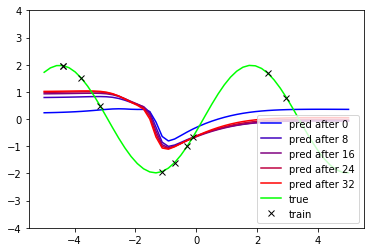

-----------------------------
iteration               5300
loss on plotted curve   1.739


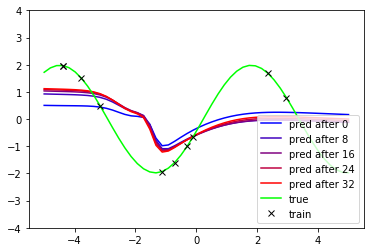

-----------------------------
iteration               5310
loss on plotted curve   1.457


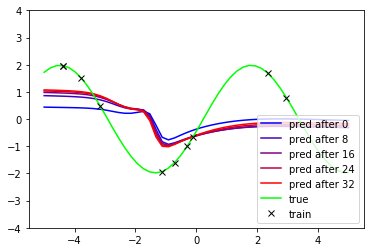

-----------------------------
iteration               5320
loss on plotted curve   1.643


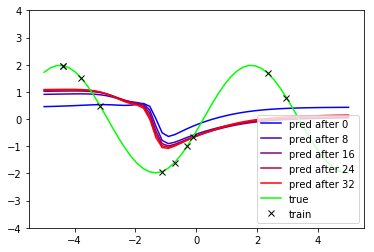

-----------------------------
iteration               5330
loss on plotted curve   1.745


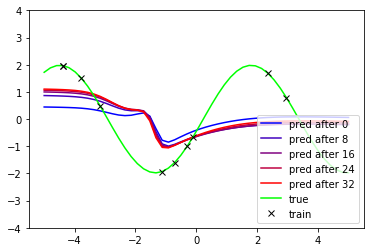

-----------------------------
iteration               5340
loss on plotted curve   1.632


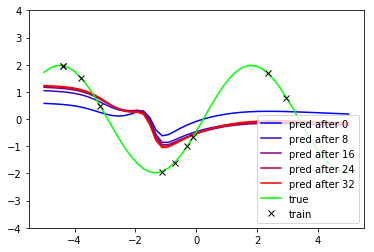

-----------------------------
iteration               5350
loss on plotted curve   1.500


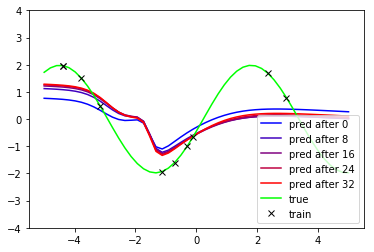

-----------------------------
iteration               5360
loss on plotted curve   1.296


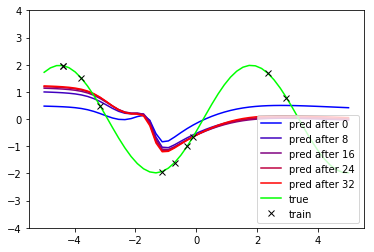

-----------------------------
iteration               5370
loss on plotted curve   1.435


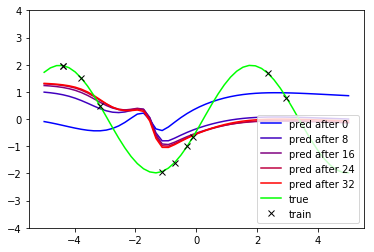

-----------------------------
iteration               5380
loss on plotted curve   1.510


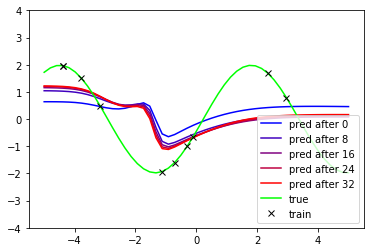

-----------------------------
iteration               5390
loss on plotted curve   1.636


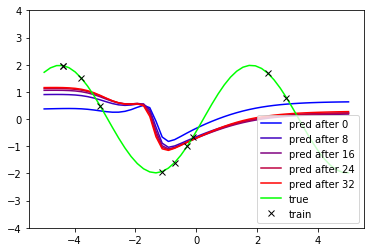

-----------------------------
iteration               5400
loss on plotted curve   1.747


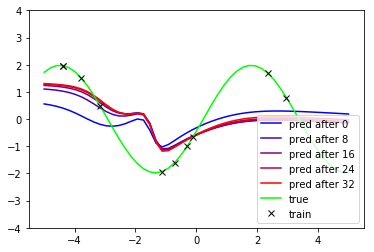

-----------------------------
iteration               5410
loss on plotted curve   1.405


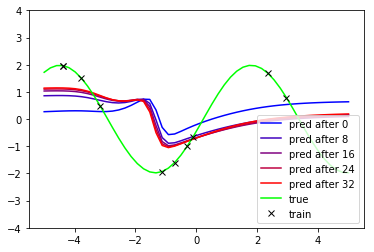

-----------------------------
iteration               5420
loss on plotted curve   1.874


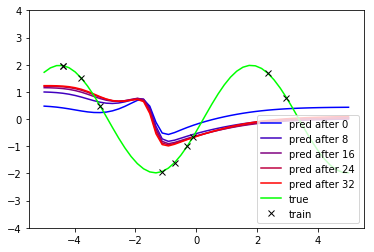

-----------------------------
iteration               5430
loss on plotted curve   1.830


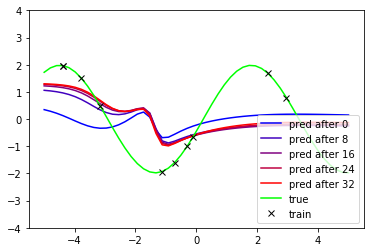

-----------------------------
iteration               5440
loss on plotted curve   1.626


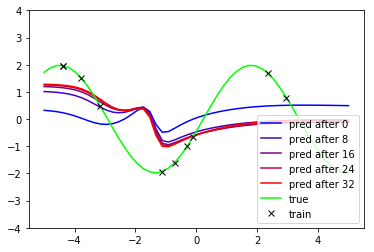

-----------------------------
iteration               5450
loss on plotted curve   1.629


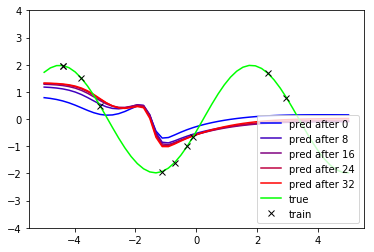

-----------------------------
iteration               5460
loss on plotted curve   1.642


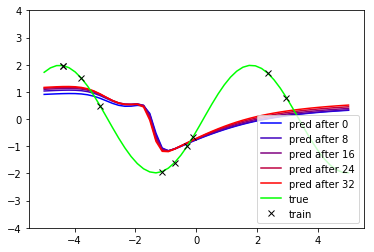

-----------------------------
iteration               5470
loss on plotted curve   1.804


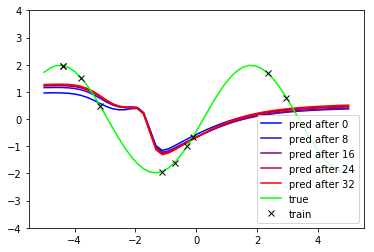

-----------------------------
iteration               5480
loss on plotted curve   1.607


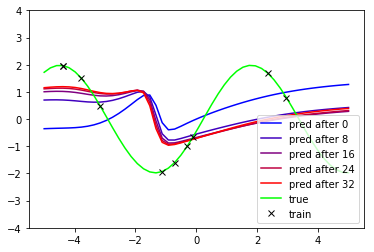

-----------------------------
iteration               5490
loss on plotted curve   2.178


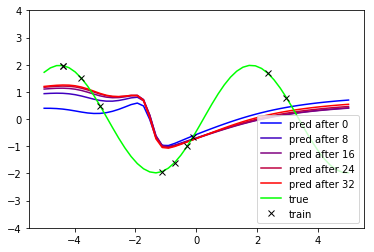

-----------------------------
iteration               5500
loss on plotted curve   1.991


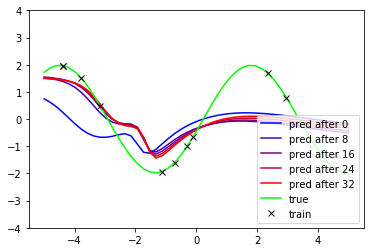

-----------------------------
iteration               5510
loss on plotted curve   1.033


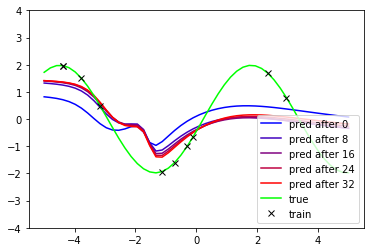

-----------------------------
iteration               5520
loss on plotted curve   1.046


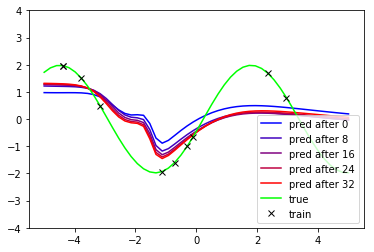

-----------------------------
iteration               5530
loss on plotted curve   1.132


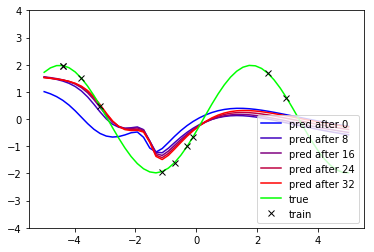

-----------------------------
iteration               5540
loss on plotted curve   0.890


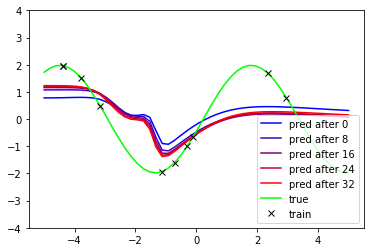

-----------------------------
iteration               5550
loss on plotted curve   1.287


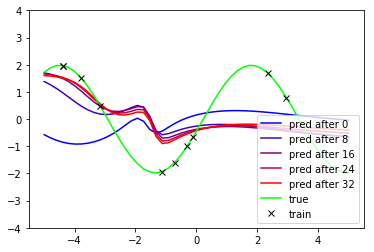

-----------------------------
iteration               5560
loss on plotted curve   1.458


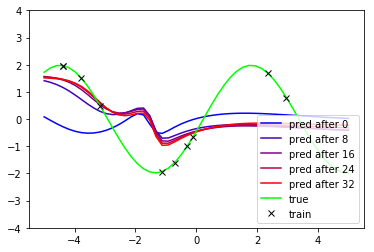

-----------------------------
iteration               5570
loss on plotted curve   1.467


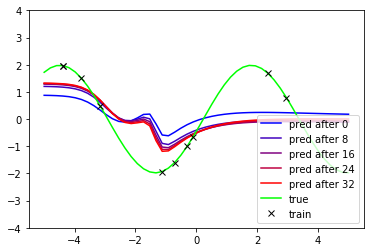

-----------------------------
iteration               5580
loss on plotted curve   1.364


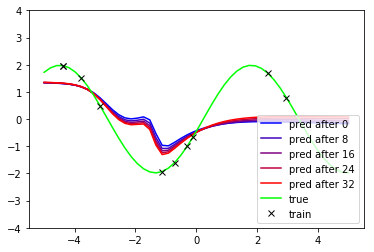

-----------------------------
iteration               5590
loss on plotted curve   1.284


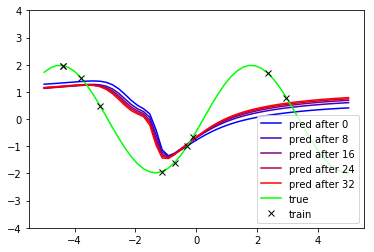

-----------------------------
iteration               5600
loss on plotted curve   1.715


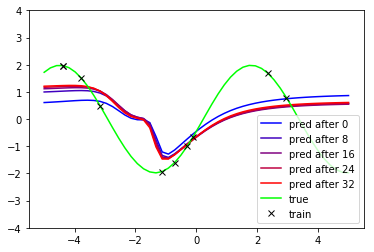

-----------------------------
iteration               5610
loss on plotted curve   1.504


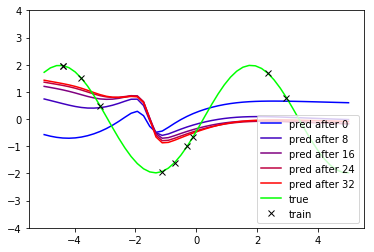

-----------------------------
iteration               5620
loss on plotted curve   1.714


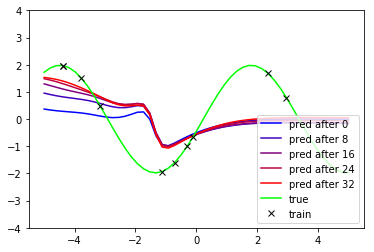

-----------------------------
iteration               5630
loss on plotted curve   1.606


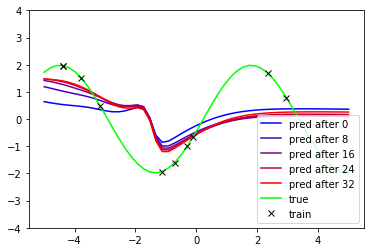

-----------------------------
iteration               5640
loss on plotted curve   1.511


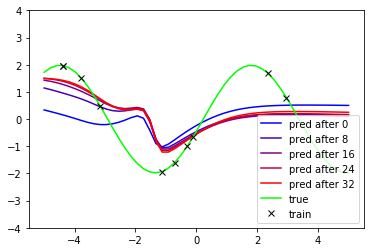

-----------------------------
iteration               5650
loss on plotted curve   1.454


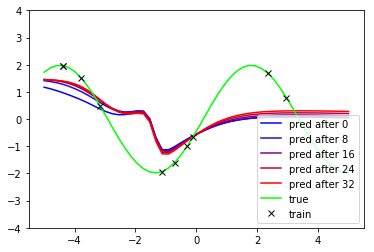

-----------------------------
iteration               5660
loss on plotted curve   1.404


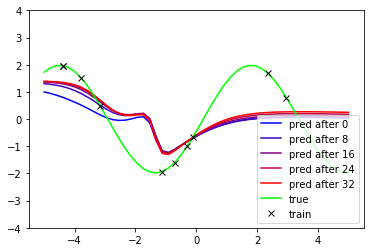

-----------------------------
iteration               5670
loss on plotted curve   1.404


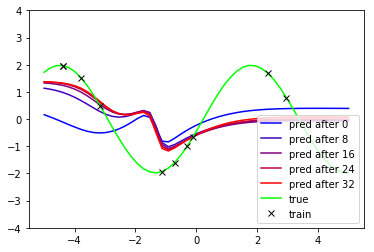

-----------------------------
iteration               5680
loss on plotted curve   1.497


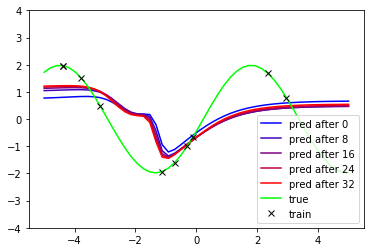

-----------------------------
iteration               5690
loss on plotted curve   1.524


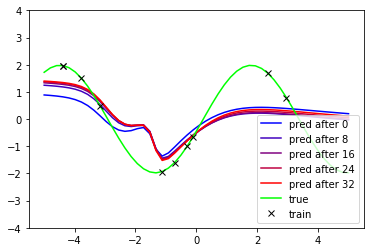

-----------------------------
iteration               5700
loss on plotted curve   1.102


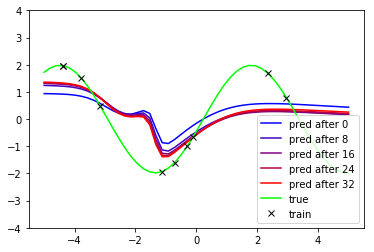

-----------------------------
iteration               5710
loss on plotted curve   1.309


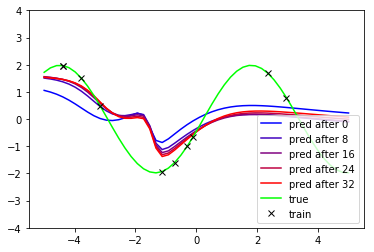

-----------------------------
iteration               5720
loss on plotted curve   1.180


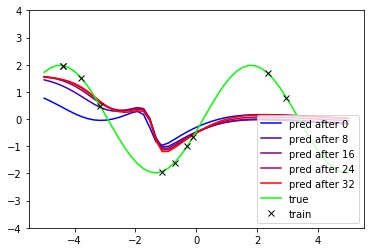

-----------------------------
iteration               5730
loss on plotted curve   1.369


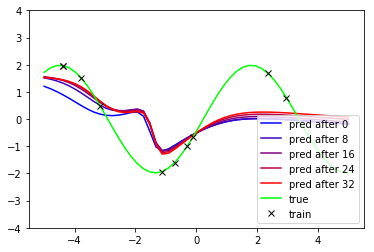

-----------------------------
iteration               5740
loss on plotted curve   1.297


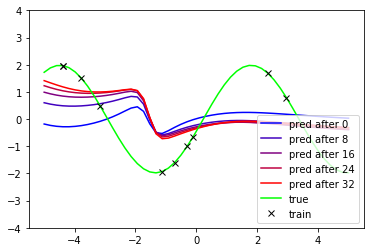

-----------------------------
iteration               5750
loss on plotted curve   1.825


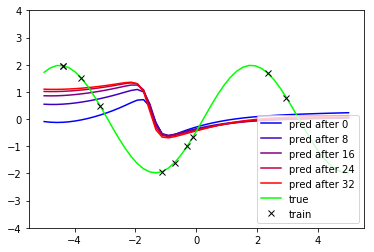

-----------------------------
iteration               5760
loss on plotted curve   2.150


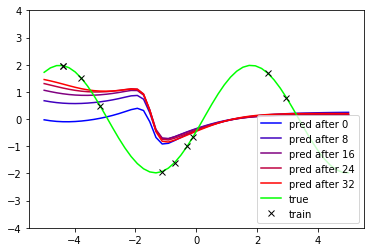

-----------------------------
iteration               5770
loss on plotted curve   1.910


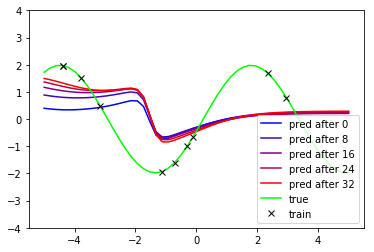

-----------------------------
iteration               5780
loss on plotted curve   1.894


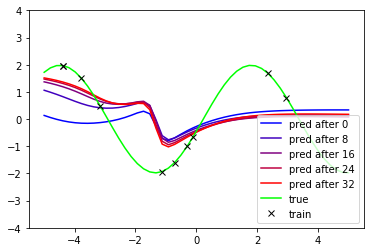

-----------------------------
iteration               5790
loss on plotted curve   1.644


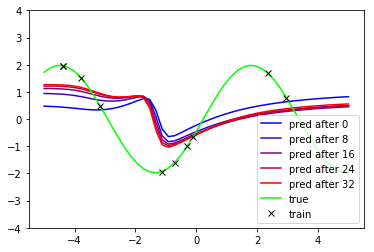

-----------------------------
iteration               5800
loss on plotted curve   1.936


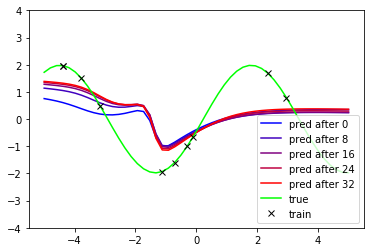

-----------------------------
iteration               5810
loss on plotted curve   1.575


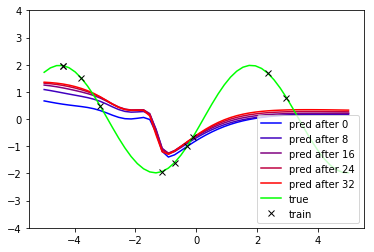

-----------------------------
iteration               5820
loss on plotted curve   1.523


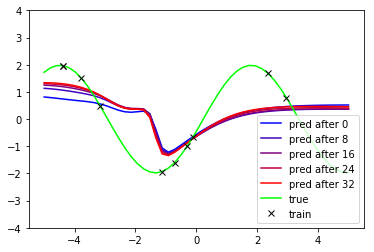

-----------------------------
iteration               5830
loss on plotted curve   1.546


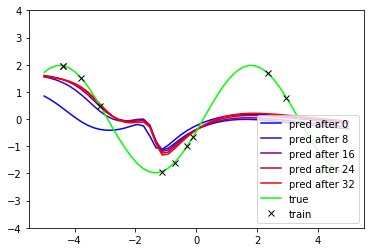

-----------------------------
iteration               5840
loss on plotted curve   1.135


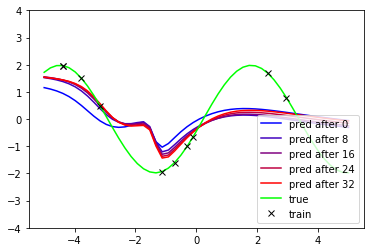

-----------------------------
iteration               5850
loss on plotted curve   1.033


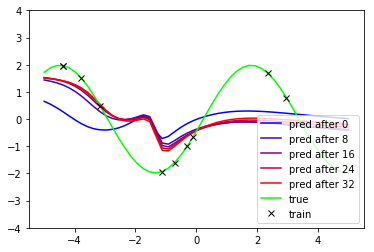

-----------------------------
iteration               5860
loss on plotted curve   1.262


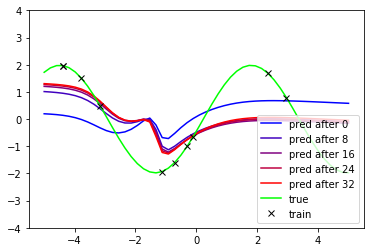

-----------------------------
iteration               5870
loss on plotted curve   1.331


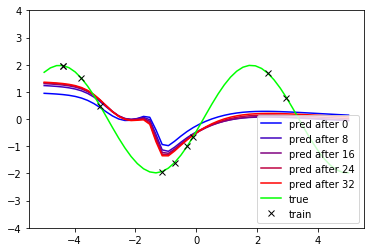

-----------------------------
iteration               5880
loss on plotted curve   1.265


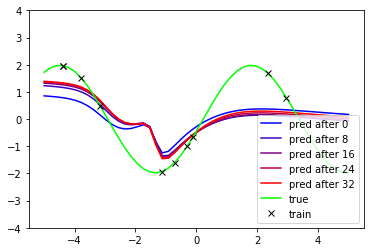

-----------------------------
iteration               5890
loss on plotted curve   1.149


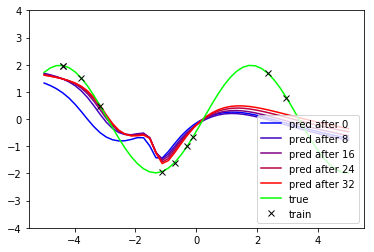

-----------------------------
iteration               5900
loss on plotted curve   0.760


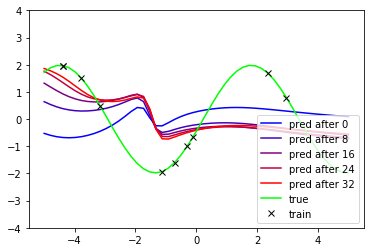

-----------------------------
iteration               5910
loss on plotted curve   1.757


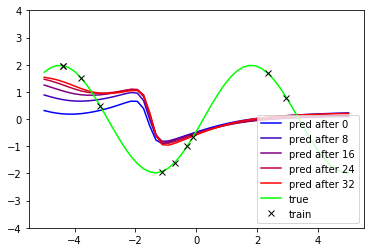

-----------------------------
iteration               5920
loss on plotted curve   1.920


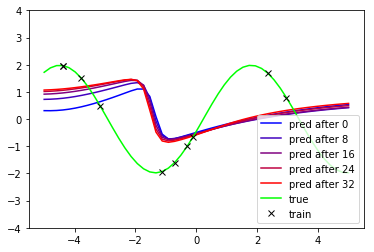

-----------------------------
iteration               5930
loss on plotted curve   2.358


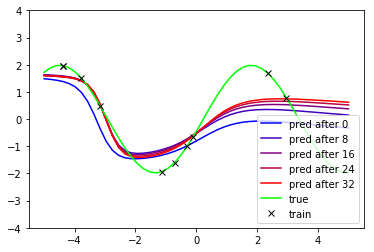

-----------------------------
iteration               5940
loss on plotted curve   1.064


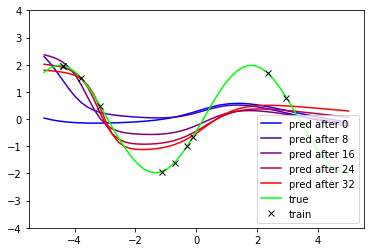

-----------------------------
iteration               5950
loss on plotted curve   0.993


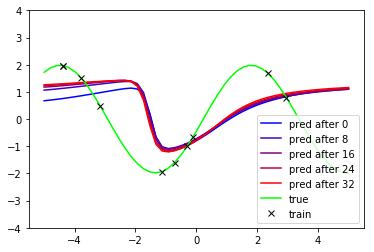

-----------------------------
iteration               5960
loss on plotted curve   2.341


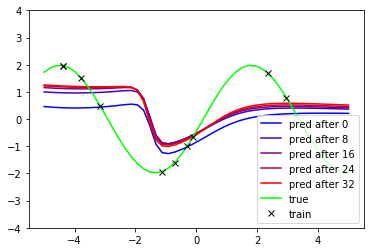

-----------------------------
iteration               5970
loss on plotted curve   1.856


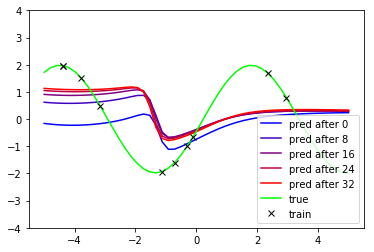

-----------------------------
iteration               5980
loss on plotted curve   2.015


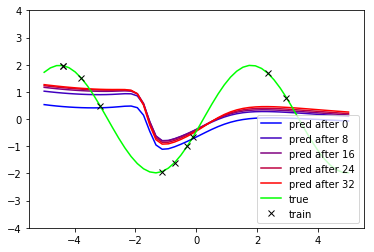

-----------------------------
iteration               5990
loss on plotted curve   1.671


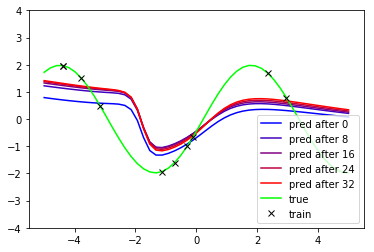

-----------------------------
iteration               6000
loss on plotted curve   1.360


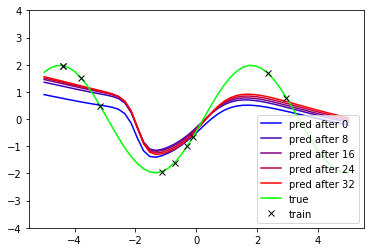

-----------------------------
iteration               6010
loss on plotted curve   0.963


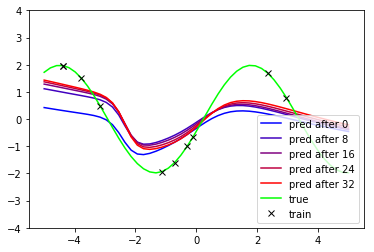

-----------------------------
iteration               6020
loss on plotted curve   0.807


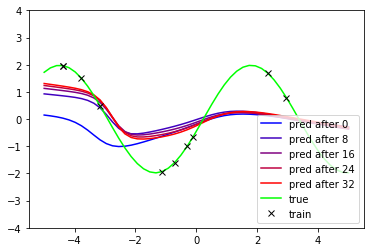

-----------------------------
iteration               6030
loss on plotted curve   1.022


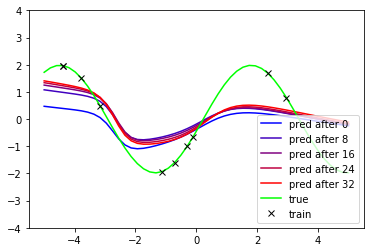

-----------------------------
iteration               6040
loss on plotted curve   0.899


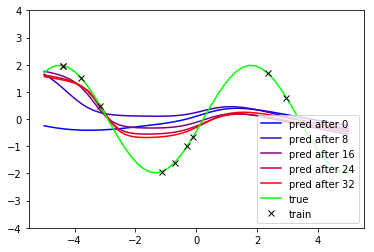

-----------------------------
iteration               6050
loss on plotted curve   0.990


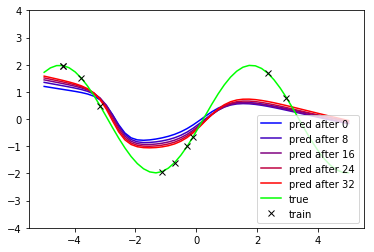

-----------------------------
iteration               6060
loss on plotted curve   0.768


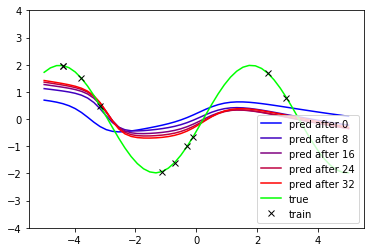

-----------------------------
iteration               6070
loss on plotted curve   0.948


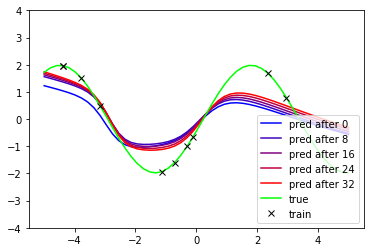

-----------------------------
iteration               6080
loss on plotted curve   0.576


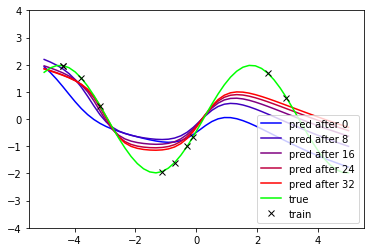

-----------------------------
iteration               6090
loss on plotted curve   0.559


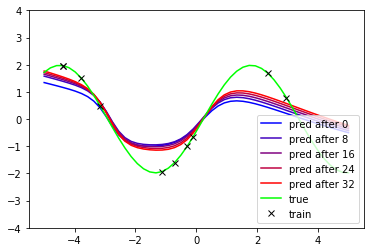

-----------------------------
iteration               6100
loss on plotted curve   0.579


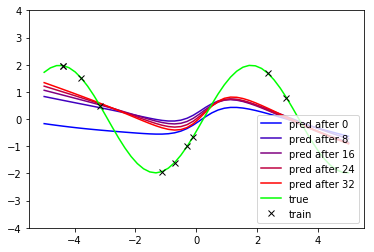

-----------------------------
iteration               6110
loss on plotted curve   0.975


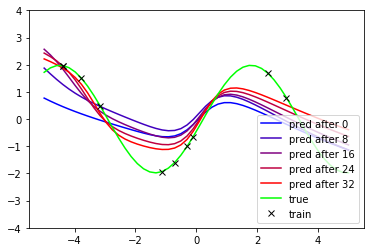

-----------------------------
iteration               6120
loss on plotted curve   0.524


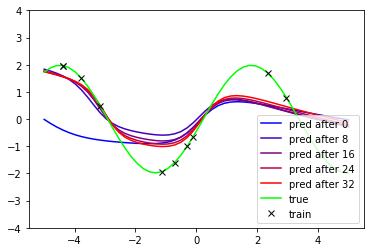

-----------------------------
iteration               6130
loss on plotted curve   0.697


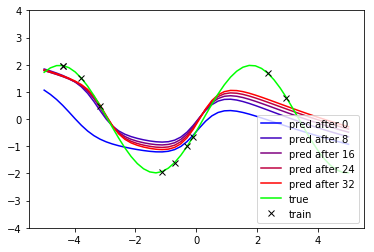

-----------------------------
iteration               6140
loss on plotted curve   0.575


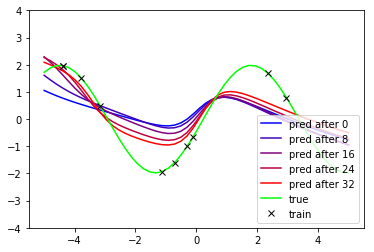

-----------------------------
iteration               6150
loss on plotted curve   0.593


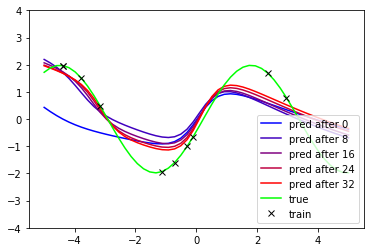

-----------------------------
iteration               6160
loss on plotted curve   0.530


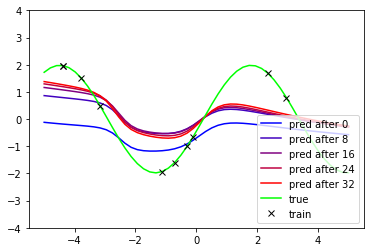

-----------------------------
iteration               6170
loss on plotted curve   0.953


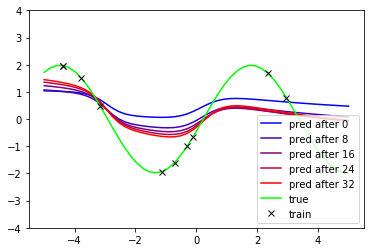

-----------------------------
iteration               6180
loss on plotted curve   1.018


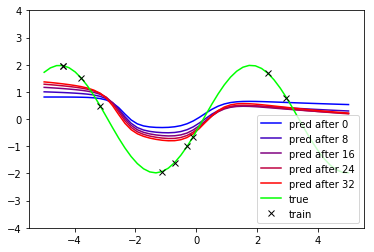

-----------------------------
iteration               6190
loss on plotted curve   1.087


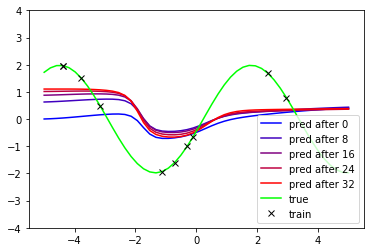

-----------------------------
iteration               6200
loss on plotted curve   1.625


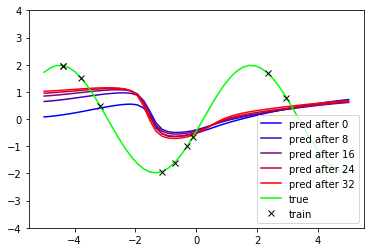

-----------------------------
iteration               6210
loss on plotted curve   2.028


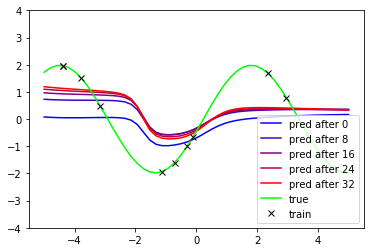

-----------------------------
iteration               6220
loss on plotted curve   1.572


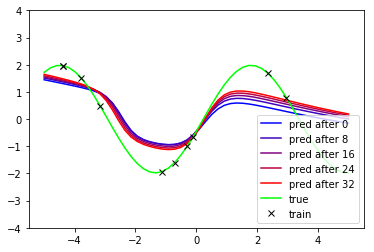

-----------------------------
iteration               6230
loss on plotted curve   0.810


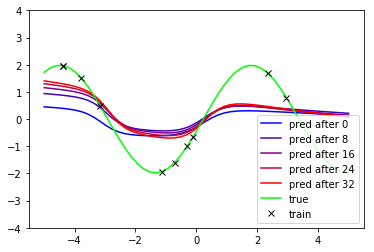

-----------------------------
iteration               6240
loss on plotted curve   1.027


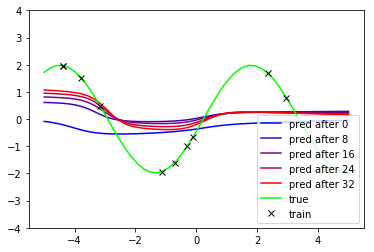

-----------------------------
iteration               6250
loss on plotted curve   1.366


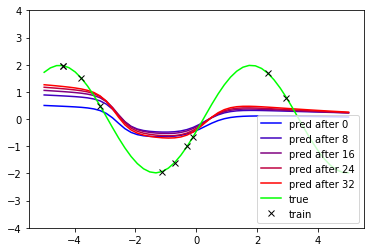

-----------------------------
iteration               6260
loss on plotted curve   1.169


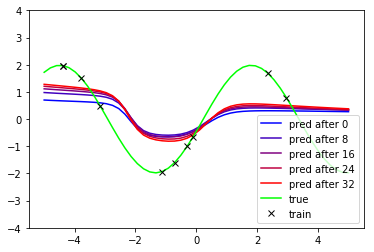

-----------------------------
iteration               6270
loss on plotted curve   1.272


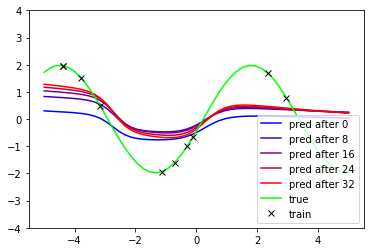

-----------------------------
iteration               6280
loss on plotted curve   1.132


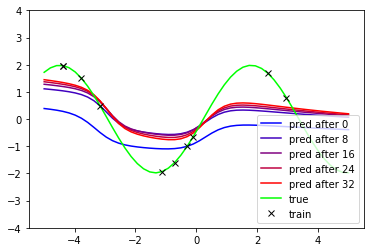

-----------------------------
iteration               6290
loss on plotted curve   1.032


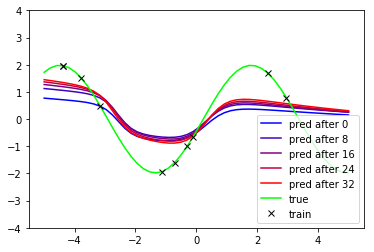

-----------------------------
iteration               6300
loss on plotted curve   1.021


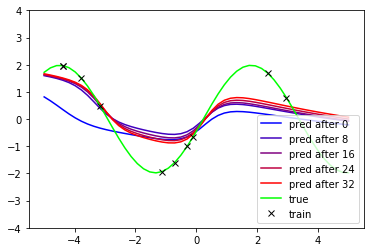

-----------------------------
iteration               6310
loss on plotted curve   0.863


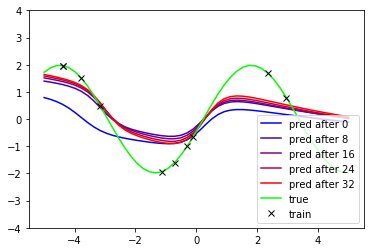

-----------------------------
iteration               6320
loss on plotted curve   0.849


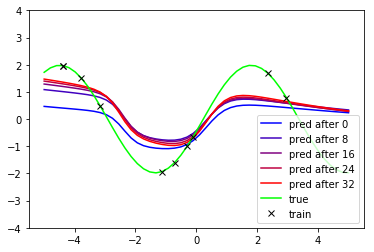

-----------------------------
iteration               6330
loss on plotted curve   1.002


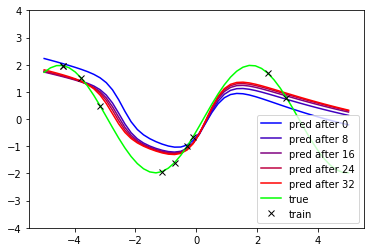

-----------------------------
iteration               6340
loss on plotted curve   0.807


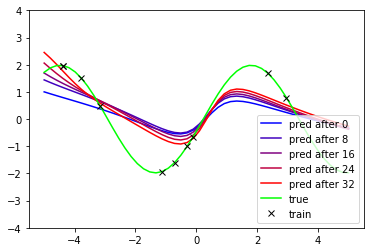

-----------------------------
iteration               6350
loss on plotted curve   0.792


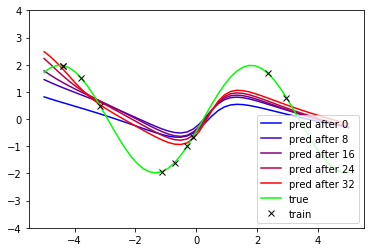

-----------------------------
iteration               6360
loss on plotted curve   0.804


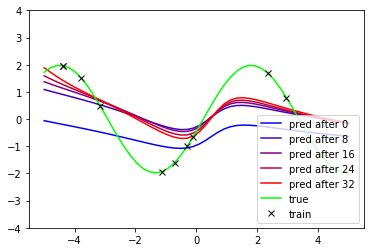

-----------------------------
iteration               6370
loss on plotted curve   1.046


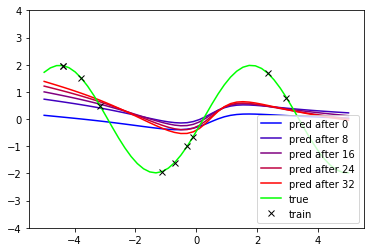

-----------------------------
iteration               6380
loss on plotted curve   1.239


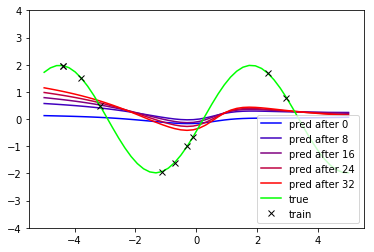

-----------------------------
iteration               6390
loss on plotted curve   1.491


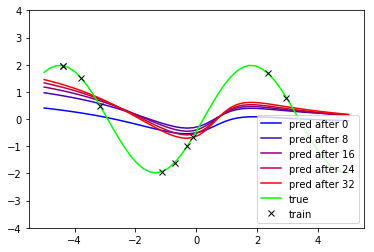

-----------------------------
iteration               6400
loss on plotted curve   1.309


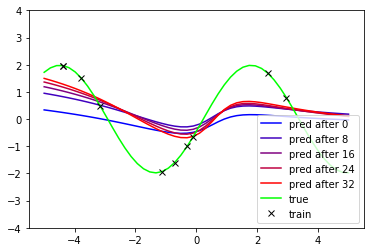

-----------------------------
iteration               6410
loss on plotted curve   1.235


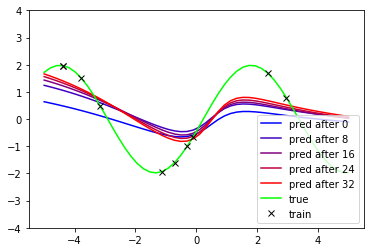

-----------------------------
iteration               6420
loss on plotted curve   1.099


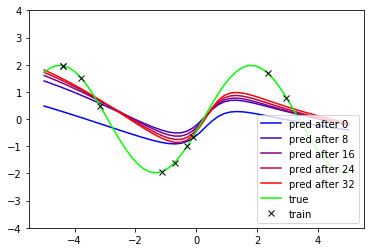

-----------------------------
iteration               6430
loss on plotted curve   0.879


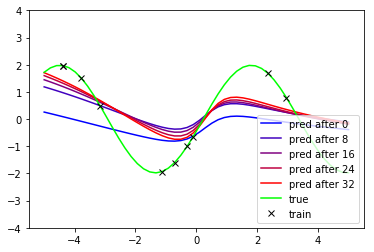

-----------------------------
iteration               6440
loss on plotted curve   0.972


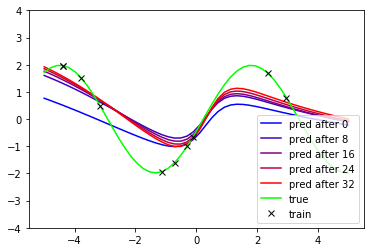

-----------------------------
iteration               6450
loss on plotted curve   0.849


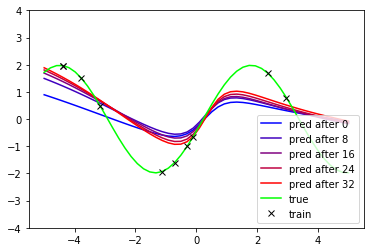

-----------------------------
iteration               6460
loss on plotted curve   0.858


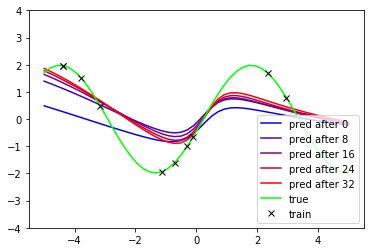

-----------------------------
iteration               6470
loss on plotted curve   0.864


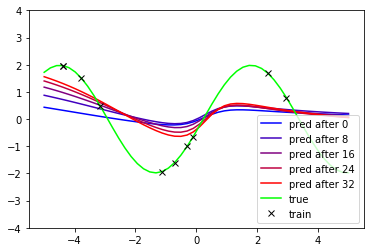

-----------------------------
iteration               6480
loss on plotted curve   1.169


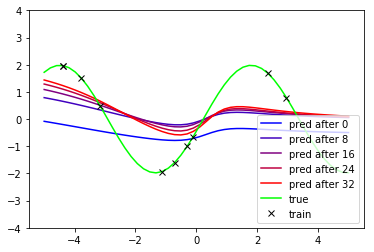

-----------------------------
iteration               6490
loss on plotted curve   1.272


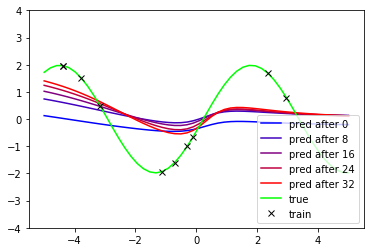

-----------------------------
iteration               6500
loss on plotted curve   1.299


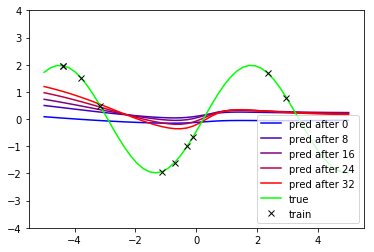

-----------------------------
iteration               6510
loss on plotted curve   1.452


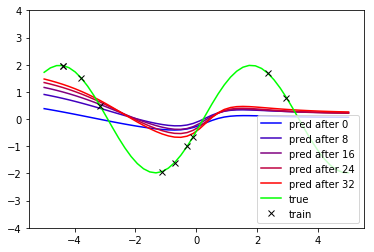

-----------------------------
iteration               6520
loss on plotted curve   1.283


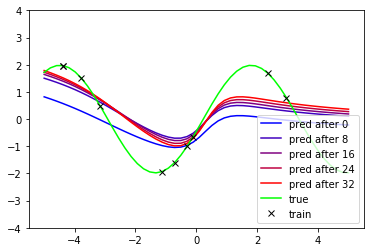

-----------------------------
iteration               6530
loss on plotted curve   1.071


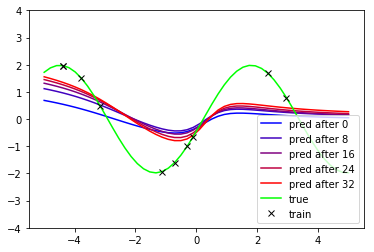

-----------------------------
iteration               6540
loss on plotted curve   1.192


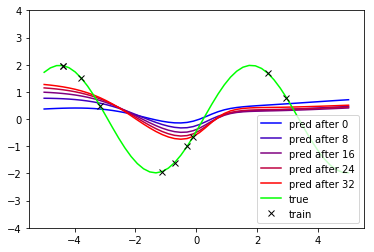

-----------------------------
iteration               6550
loss on plotted curve   1.475


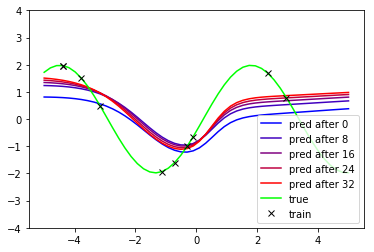

-----------------------------
iteration               6560
loss on plotted curve   1.563


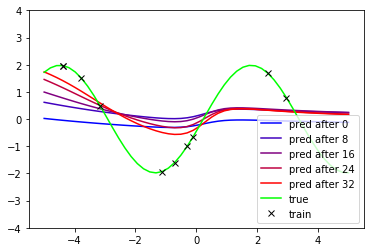

-----------------------------
iteration               6570
loss on plotted curve   1.257


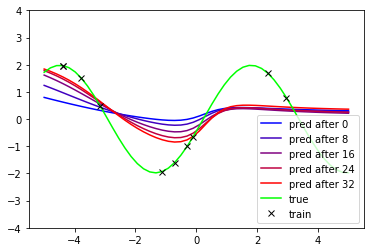

-----------------------------
iteration               6580
loss on plotted curve   1.168


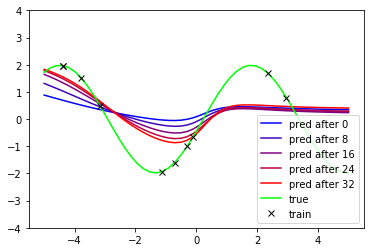

-----------------------------
iteration               6590
loss on plotted curve   1.172


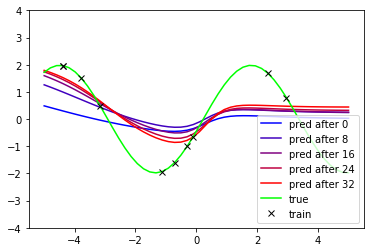

-----------------------------
iteration               6600
loss on plotted curve   1.209


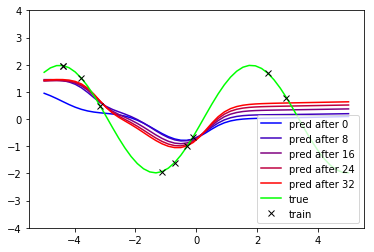

-----------------------------
iteration               6610
loss on plotted curve   1.291


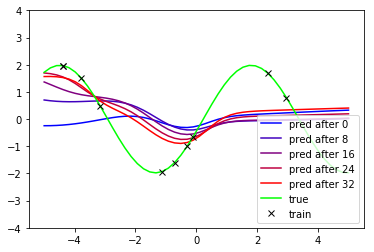

-----------------------------
iteration               6620
loss on plotted curve   1.388


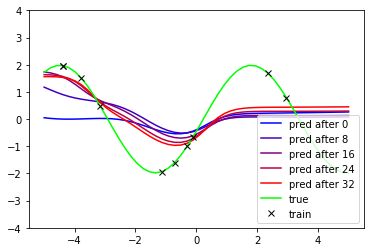

-----------------------------
iteration               6630
loss on plotted curve   1.242


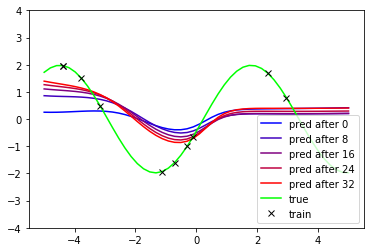

-----------------------------
iteration               6640
loss on plotted curve   1.384


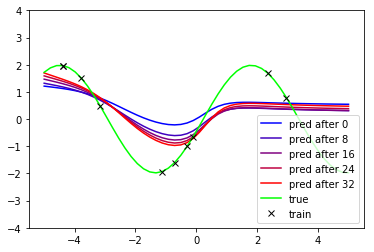

-----------------------------
iteration               6650
loss on plotted curve   1.194


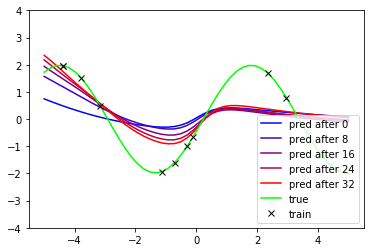

-----------------------------
iteration               6660
loss on plotted curve   0.980


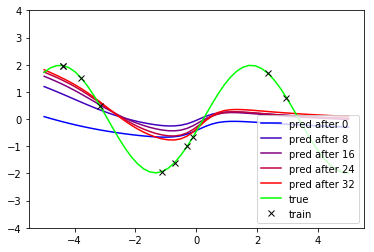

-----------------------------
iteration               6670
loss on plotted curve   1.128


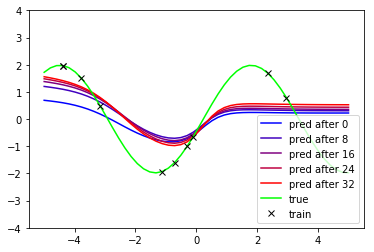

-----------------------------
iteration               6680
loss on plotted curve   1.216


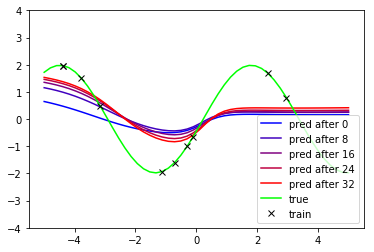

-----------------------------
iteration               6690
loss on plotted curve   1.254


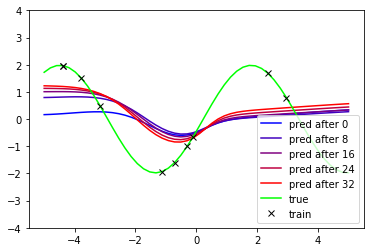

-----------------------------
iteration               6700
loss on plotted curve   1.537


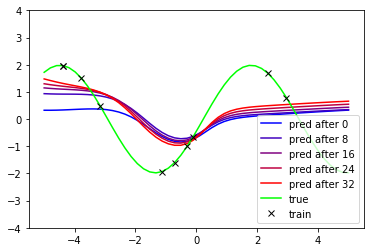

-----------------------------
iteration               6710
loss on plotted curve   1.503


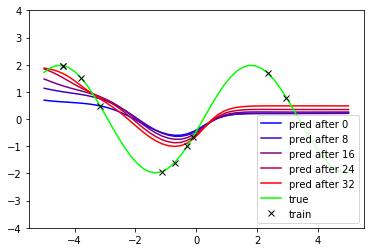

-----------------------------
iteration               6720
loss on plotted curve   1.236


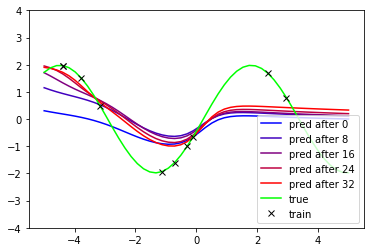

-----------------------------
iteration               6730
loss on plotted curve   1.096


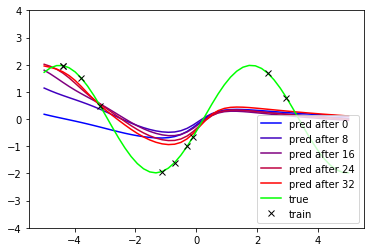

-----------------------------
iteration               6740
loss on plotted curve   1.002


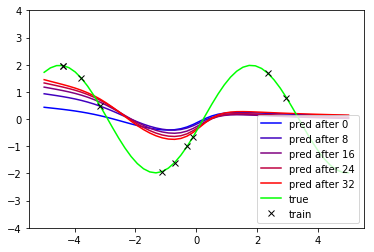

-----------------------------
iteration               6750
loss on plotted curve   1.255


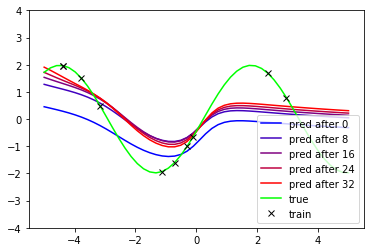

-----------------------------
iteration               6760
loss on plotted curve   1.063


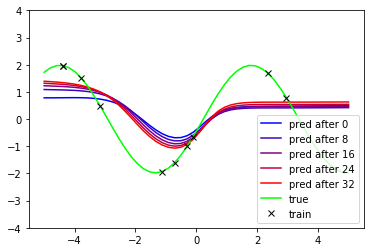

-----------------------------
iteration               6770
loss on plotted curve   1.337


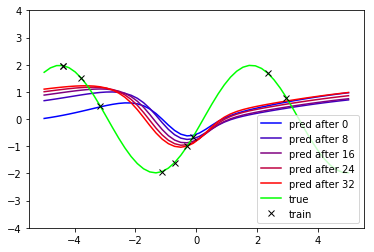

-----------------------------
iteration               6780
loss on plotted curve   1.932


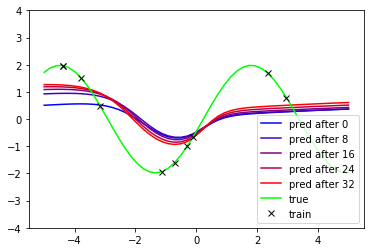

-----------------------------
iteration               6790
loss on plotted curve   1.438


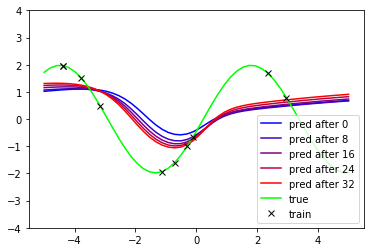

-----------------------------
iteration               6800
loss on plotted curve   1.546


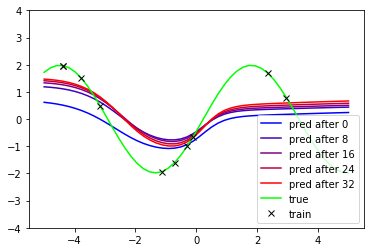

-----------------------------
iteration               6810
loss on plotted curve   1.294


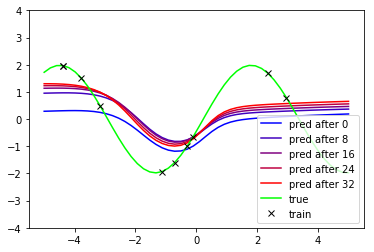

-----------------------------
iteration               6820
loss on plotted curve   1.423


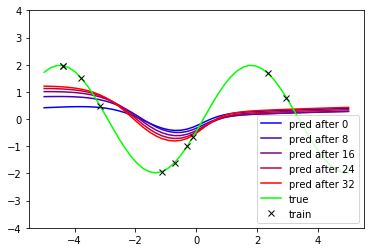

-----------------------------
iteration               6830
loss on plotted curve   1.443


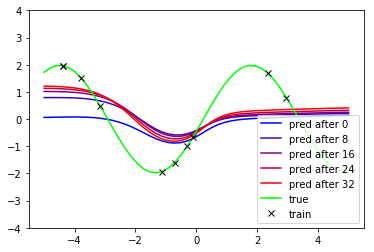

-----------------------------
iteration               6840
loss on plotted curve   1.436


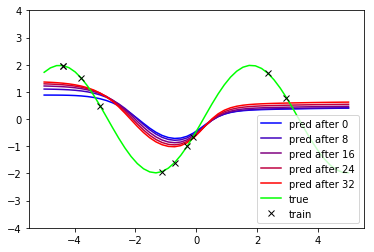

-----------------------------
iteration               6850
loss on plotted curve   1.347


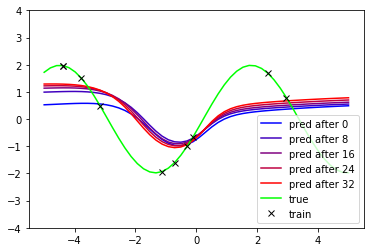

-----------------------------
iteration               6860
loss on plotted curve   1.529


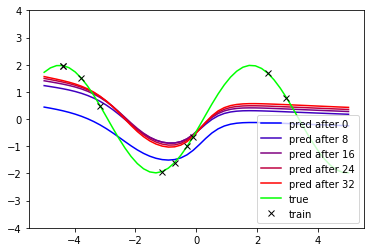

-----------------------------
iteration               6870
loss on plotted curve   1.143


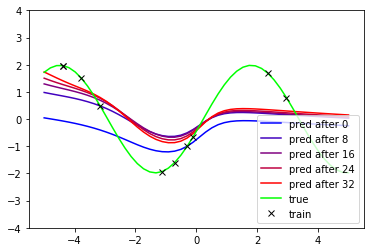

-----------------------------
iteration               6880
loss on plotted curve   1.155


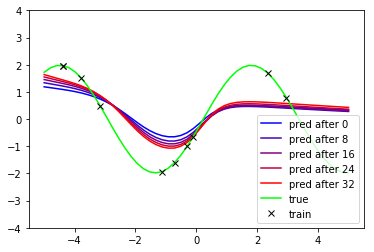

-----------------------------
iteration               6890
loss on plotted curve   1.119


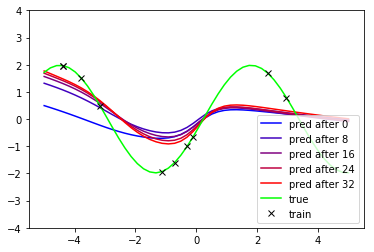

-----------------------------
iteration               6900
loss on plotted curve   0.970


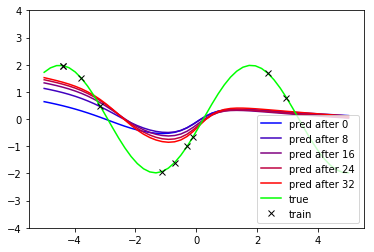

-----------------------------
iteration               6910
loss on plotted curve   1.101


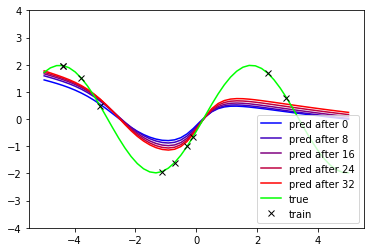

-----------------------------
iteration               6920
loss on plotted curve   0.915


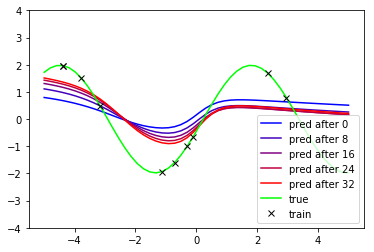

-----------------------------
iteration               6930
loss on plotted curve   1.090


In [ ]:
# Reptile training loop
for iteration in range(niterations):
    weights_before = model.weights


    # Generate task
    f = gen_task()
    y_all = f(x_all)
    # Do SGD on this task
    
    inds = rng.permutation(len(x_all))
    for _ in range(innerepochs):
        for start in range(0, len(x_all), ntrain):
            mbinds = inds[start:start+ntrain]
            train_on_batch(x_all[mbinds], y_all[mbinds])

    weights_after = model.weights

    outerstepsize = outerstepsize0 * (1 - iteration / niterations) # linear schedule
    for i in range(len(weights_after)):
        model.weights[i]  = (weights_before[i]+
                                (weights_after[i]-weights_before[i])*outerstepsize)

    if plot and iteration==0 or (iteration+1) % 10 == 0:
        plt.cla()
        # test task
        f = f_plot
        weights_before = model.weights
        plt.plot(x_all, model.predict(x_all), label="pred after 0", color=(0,0,1))
        # test time. optimization at test time. but hey you roll it back. it is one-shot.
        for inneriter in range(32):
            train_on_batch(xtrain_plot, f(xtrain_plot))
            if (inneriter+1) % 8 == 0:
                frac = (inneriter+1) / 32
                plt.plot(x_all, model.predict(x_all), label="pred after %i"%(inneriter+1), color=(frac, 0, 1-frac))
        plt.plot(x_all, f(x_all), label="true", color=(0,1,0))
        lossval = np.square(model.predict(x_all) - f(x_all)).mean()
        plt.plot(xtrain_plot, f(xtrain_plot), "x", label="train", color="k")
        plt.ylim(-4,4)
        plt.legend(loc="lower right")
        plt.pause(0.01)
        plt.show()
        for i in range(len(model.weights)):
            model.weights[i] = weights_before[i]
        print(f"-----------------------------")
        print(f"iteration               {iteration+1}")
        print(f"loss on plotted curve   {lossval:.3f}") # w